# differential gene expression analysis of mitochondrial and metabolic genes

In [1]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import squidpy as sq
from scipy import sparse

import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
from scipy.spatial import cKDTree

import seaborn as sns

In [ ]:
adata = sc.read_h5ad('../data/RREAE_5k_raw_integration_processed.h5ad')

## identify DEGs by lesion proximity compared to control

In [ ]:
import numpy as np, pandas as pd
import seaborn as sns, matplotlib.pyplot as plt
from scipy import stats, sparse
from statsmodels.stats.multitest import multipletests
from tqdm.auto import tqdm

# --- settings ---
POP_COL    = "celltype_merged"          # e.g. "celltype_merged"
COND_COL   = "condition"                 # "EAE" / "Control"
SAMPLE_COL = "sample_id"                 # sample ID
DIST_COL   = "lesion_distance_um"        # distance in µm
use_layer  = 'raw'                        # e.g. "counts" if counts are in adata.layers

# distance bins (µm) — use hyphens consistently
bins   = (0, 25, 50, 100, 200, 500, np.inf)
bin_labels = ("0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm")

# genes to highlight
highlight_genes = [
 "Hif1a", "Nfe2l2", "Akt1", "Pik3cd", "Hmox1", "Txnip",
    "Slc16a1", "Slc16a3", "Ldha", "Ldhb", "Mfn1", "Mfn2",
    "Opa1", "Pkm", "Sirt2", "Ppargc1a"
]

# ---------- helpers ----------
def get_X(adata):
    X = adata.layers[use_layer] if use_layer else adata.X
    return X.tocsr() if sparse.issparse(X) else np.asarray(X)

import numpy as np, pandas as pd
import scipy.sparse as sp
from tqdm.auto import tqdm

def pseudobulk_counts_fast(adata_subset, group_cols, show_progress=True):
    """
    Vectorized pseudobulk: builds a (groups x genes) matrix with one sparse matmul.
    group_cols: list of obs columns (e.g., [SAMPLE_COL, "group_label"])
    Returns:
      pb_csr:  CSR matrix (n_groups x n_genes) of counts
      meta:    DataFrame with one row per group (pb_id + columns in group_cols)
    """
    obs = adata_subset.obs[group_cols].astype(str).copy()
    # make a single key per cell
    key = obs.astype(str).agg("|".join, axis=1)
    cats = pd.Categorical(key)
    codes = cats.codes.astype(np.int64)            # shape (n_cells,)
    if (codes < 0).any():
        raise ValueError("Found -1 codes in categorical; something went wrong building group keys.")

    n_cells = adata_subset.n_obs
    n_groups = len(cats.categories)

    if show_progress: print(f"[pseudobulk] cells={n_cells:,}, groups={n_groups:,}, genes={adata_subset.n_vars:,}")

    # One-hot (cells x groups)
    H = sp.csr_matrix((np.ones(n_cells, dtype=np.float32),
                       (np.arange(n_cells, dtype=np.int64), codes)),
                      shape=(n_cells, n_groups))

    # Counts matrix (cells x genes)
    X = adata_subset.layers[use_layer] if use_layer else adata_subset.X
    X = X.tocsr() if sp.issparse(X) else sp.csr_matrix(np.asarray(X))

    if show_progress: print("[pseudobulk] aggregating (H^T @ X) ...")
    # Aggregate: (groups x genes)
    pb_csr = H.T @ X

    # Build meta per group
    meta = pd.DataFrame({"pb_id": cats.categories})
    # split back into columns
    split_cols = meta["pb_id"].str.split("|", expand=True)
    split_cols.columns = [f"__grp{i}__" for i in range(split_cols.shape[1])]
    meta = pd.concat([meta, split_cols], axis=1)

    # Also return original column names if two columns were used
    if len(group_cols) == split_cols.shape[1]:
        meta.rename(columns={f"__grp{i}__": group_cols[i] for i in range(split_cols.shape[1])}, inplace=True)

    meta.set_index("pb_id", inplace=True)
    return pb_csr.tocsr(), meta

def normalize_cpm(pb_counts):
    lib = np.asarray(pb_counts.sum(axis=1)).ravel()
    lib[lib == 0] = 1
    return (pb_counts.T / lib).T * 1e6  # CPM

from statsmodels.stats.multitest import multipletests
from scipy import stats

def welch_t_pvalues_vectorized(A, B):
    nA = A.shape[0]; nB = B.shape[0]
    mA = np.nanmean(A, axis=0); mB = np.nanmean(B, axis=0)
    vA = np.nanvar(A, axis=0, ddof=1); vB = np.nanvar(B, axis=0, ddof=1)
    se2 = vA/nA + vB/nB
    se2 = np.where(se2 <= 0, np.nan, se2)
    t = (mA - mB) / np.sqrt(se2)
    num = se2**2
    den = (vA**2)/(nA**2*(nA-1)) + (vB**2)/(nB**2*(nB-1))
    df = num / den
    p = 2 * stats.t.sf(np.abs(t), df)
    return t, df, p

def de_log2fc_fast(cpm_df, meta, group_col, ref="Control", offset=1.0, show_progress=True):
    out = []
    genes = cpm_df.columns.to_numpy()
    cpm = cpm_df.to_numpy(dtype=float)
    log2cpm = np.log2(cpm + offset)

    levels = pd.unique(meta[group_col])
    comps = [lev for lev in levels if lev != ref]
    if show_progress:
        comps = tqdm(comps, desc="[DE] comparisons")

    for lev in comps:
        maskA = (meta[group_col].values == lev)
        maskB = (meta[group_col].values == ref)
        nA, nB = maskA.sum(), maskB.sum()
        if nA < 2 or nB < 2:
            continue

        A_cpm, B_cpm = cpm[maskA, :], cpm[maskB, :]
        A_log, B_log = log2cpm[maskA, :], log2cpm[maskB, :]

        mean_case = np.nanmean(A_cpm, axis=0)
        mean_ref  = np.nanmean(B_cpm, axis=0)
        log2fc    = np.nanmean(A_log, axis=0) - np.nanmean(B_log, axis=0)

        _, _, pvals = welch_t_pvalues_vectorized(A_log, B_log)
        ok = np.isfinite(pvals)
        q = np.full_like(pvals, np.nan, dtype=float)
        if ok.any():
            q[ok] = multipletests(pvals[ok], method="fdr_bh")[1]

        out.append(pd.DataFrame({
            "gene": genes,
            "comparison": f"{lev} vs {ref}",
            "meanCPM_case": mean_case,
            "meanCPM_ref":  mean_ref,
            "log2FC": log2fc,
            "pval": pvals,
            "FDR": q,
        }))

    return pd.concat(out, ignore_index=True) if out else pd.DataFrame()

def attach_dist_bin(adata):
    adata.obs["dist_bin"] = pd.cut(adata.obs[DIST_COL], bins=bins, labels=bin_labels).astype(str)

def run_deg_bins(adata, pop_name, show_progress=True, filter_genes=True):
    print(f"[run] subset: {pop_name}")
    sub = adata[adata.obs[POP_COL] == pop_name].copy()

    # bins (use your hyphen labels)
    sub.obs["dist_bin"] = pd.cut(sub.obs[DIST_COL], bins=bins, labels=bin_labels).astype(str)
    is_ctl = sub.obs[COND_COL].str.upper().isin(["CONTROL","CTRL"])
    sub.obs["group_label"] = np.where(is_ctl, "Control", sub.obs["dist_bin"])

    print("[run] pseudobulk ...")
    pb_csr, meta = pseudobulk_counts_fast(sub, group_cols=[SAMPLE_COL, "group_label"], show_progress=show_progress)

    print("[run] CPM ...")
    # CPM ... (stay sparse; avoid numpy.matrix)
    lib = np.asarray(pb_csr.sum(axis=1)).ravel()
    lib[lib == 0] = 1
    scale = (1e6 / lib).astype(np.float32)          # row scalars
    cpm_csr = pb_csr.multiply(scale[:, None])       # (groups x genes) CSR scaled by rows
    
    # Convert to dense DataFrame for DE
    cpm_df = pd.DataFrame(cpm_csr.toarray(), index=meta.index, columns=sub.var_names)

    if filter_genes:
        # speed: keep informative genes
        keep = ((cpm_df > 0).mean(axis=0) >= 0.10) | (cpm_df.mean(axis=0) >= 5)
        cpm_df = cpm_df.loc[:, keep]
        if show_progress:
            print(f"[run] kept {keep.sum():,} / {keep.size:,} genes for DE")

    print("[run] DE ...")
    deg = de_log2fc_fast(cpm_df, meta, group_col="group_label", ref="Control",
                         offset=1.0, show_progress=show_progress)

    print("[run] done.")
    return deg, sub

# ---------- plotting ----------
def volcano_plot(df, title="", highlight_genes=None, fdr_thresh=0.05, log2fc_thresh=1):
    if df is None or df.empty:
        print(f"[{title}] No results.")
        return
    df = df.copy()
    df["neglog10FDR"] = -np.log10(df["FDR"].replace(0, np.nextafter(0, 1)))
    df["sig"] = "NS"
    df.loc[(df["FDR"] < fdr_thresh) & (df["log2FC"] >  log2fc_thresh), "sig"] = "Up"
    df.loc[(df["FDR"] < fdr_thresh) & (df["log2FC"] < -log2fc_thresh), "sig"] = "Down"
    palette = {"Up": "#d62728", "Down": "#1f77b4", "NS": "lightgrey"}

    plt.figure(figsize=(6, 5), dpi=150)
    sns.scatterplot(data=df, x="log2FC", y="neglog10FDR", hue="sig",
                    palette=palette, edgecolor=None, s=15, alpha=0.7)
    plt.axhline(-np.log10(fdr_thresh), color="grey", ls="--", lw=1)
    plt.axvline( log2fc_thresh,        color="grey", ls="--", lw=1)
    plt.axvline(-log2fc_thresh,        color="grey", ls="--", lw=1)

    if highlight_genes:
        sub = df[df["gene"].isin(highlight_genes)]
        plt.scatter(sub["log2FC"], sub["neglog10FDR"], color="black", s=25, zorder=3)
        for _, row in sub.iterrows():
            plt.text(row["log2FC"], row["neglog10FDR"], row["gene"],
                     fontsize=7, ha="right" if row["log2FC"] < 0 else "left")

    plt.title(title)
    plt.xlabel("log2FC (vs Control)")
    plt.ylabel("-log10(FDR)")
    plt.legend(frameon=False, title="")
    plt.tight_layout()
    plt.show()

def dotplot_fraction_mean(adata_sub, genes, group_col):
    """
    Dotplot: y=group (bins/Control), x=gene.
    Dot size = fraction expressing (>0), color = mean log1p expression.
    """
    vals = {}
    for g in genes:
        if g not in adata_sub.var_names:
            continue
        xg = adata_sub[:, g].X
        xg = xg.toarray().ravel() if sparse.issparse(xg) else xg.ravel()
        vals[g] = xg

    df = adata_sub.obs[[group_col]].copy()
    for g, v in vals.items():
        df[f"{g}_frac"] = (v > 0).astype(float)
        df[f"{g}_mean"] = np.log1p(v)

    agg = df.groupby(group_col).mean()

    tall = agg.reset_index().melt(id_vars=group_col, var_name="gene_metric", value_name="value")
    tall["gene"]   = tall["gene_metric"].str.replace("_frac", "", regex=False).str.replace("_mean", "", regex=False)
    tall["metric"] = tall["gene_metric"].str.rsplit("_", n=1).str[-1]

    frac = tall[tall["metric"] == "frac"].pivot(index=group_col, columns="gene", values="value")
    mean = tall[tall["metric"] == "mean"].pivot(index=group_col, columns="gene", values="value")

    genes_order  = [g for g in genes if g in frac.columns]
    groups_order = list(frac.index)

    if len(genes_order) == 0 or len(groups_order) == 0:
        print("[dotplot] Nothing to plot.")
        return

    vmin = np.nanmin(mean[genes_order].values)
    vmax = np.nanmax(mean[genes_order].values)
    if not np.isfinite(vmin) or not np.isfinite(vmax):
        vmin, vmax = 0.0, 1.0

    plt.figure(figsize=(0.6*len(genes_order)+3, 0.5*len(groups_order)+2), dpi=150)
    ax = plt.gca()
    for i, grp in enumerate(groups_order):
        for j, g in enumerate(genes_order):
            size  = float(frac.loc[grp, g])  if pd.notna(frac.loc[grp, g]) else 0.0
            color = float(mean.loc[grp, g]) if pd.notna(mean.loc[grp, g]) else vmin
            ax.scatter(j, i, s=300*size, c=[[color]], cmap="viridis", vmin=vmin, vmax=vmax)
    ax.set_xticks(range(len(genes_order)))
    ax.set_xticklabels(genes_order, rotation=45, ha="right")
    ax.set_yticks(range(len(groups_order)))
    ax.set_yticklabels(groups_order)
    ax.set_xlabel("Gene"); ax.set_ylabel(group_col)
    ax.set_title("Dotplot: size=fraction, color=mean log1p expression")
    plt.tight_layout(); plt.show()



# Inspecting Raw Gene Expression in Lesion-Proximal Astrocytes

### Goal
Directly visualize and quantify **raw expression counts** for candidate genes in **astrocytes located within 0–25 µm of lesions**.  
This helps determine whether observed differential expression results reflect **real biological signal** or are driven by **sparse low-level expression**.

### Approach
1. **Subset cells**
   - Select astrocytes (`celltype_merged == "Astrocyte"`) within the lesion-distance bin (`0–25µm`).

2. **Extract raw counts**
   - Use `adata.layers['raw']` (or `.X` if unavailable).
   - Convert to dense arrays for easy manipulation.

3. **Summarize per gene**
   - Mean raw count per cell  
   - Median raw count  
   - Number of cells with nonzero expression  
   - Percentage of cells expressing the gene

4. **Visualize distributions**
   - Histograms of raw counts for each gene  
   - Bubble summary plot:
     - **x-axis**: mean expression  
     - **y-axis**: % of cells expressing  
     - **point size**: median expression  
     - **point color**: mean expression

### Why this matters
- **Contextualizes log2FC**: Large fold-changes with low baseline counts may be misleading.  
- **Reveals heterogeneity**: Distinguishes widespread vs. rare expression.  
- **Supports interpretation**: Confirms whether lesion-associated upregulation (e.g., *Arg1*, *Arg2*, *Slc16a3*) is robust or sparse/noisy.

In [ ]:
def inspect_gene_distributions(
    adata,
    genes,
    celltype,
    bin_label,
    ct_col="celltype_merged",
    bin_col="dist_bin",
    layer="raw",
    ncols=4,
    bins=20
):
    """
    Inspect raw expression distributions for selected genes in a given cell type + bin.

    Returns:
        summary (pd.DataFrame): mean, median, nonzero counts, % nonzero per gene.
        fig_hist (matplotlib Figure): histograms of raw counts per gene.
        fig_summary (matplotlib Figure): bubble plot summary.
    """

    # ------------------------
    # Subset
    # ------------------------
    mask = (
        (adata.obs[ct_col] == celltype) &
        (adata.obs[bin_col] == bin_label)
    )
    sub = adata[mask, genes]

    # Get raw matrix
    if layer in sub.layers:
        X = sub.layers[layer]
    else:
        X = sub.X
    if sp.issparse(X):
        X = X.toarray()

    # Build DataFrame
    df = pd.DataFrame(X, index=sub.obs_names, columns=genes)

    # ------------------------
    # Summary table
    # ------------------------
    summary = pd.DataFrame({
        "mean": df.mean(),
        "median": df.median(),
        "nonzero_cells": (df > 0).sum(),
        "pct_nonzero": (df > 0).mean()
    })
    print(summary)

    # ------------------------
    # Plot distributions in subplots
    # ------------------------
    n_genes = len(genes)
    nrows = int(np.ceil(n_genes / ncols))

    fig_hist, axes = plt.subplots(nrows, ncols, figsize=(ncols*4, nrows*3))
    axes = axes.flatten()

    for i, g in enumerate(genes):
        ax = axes[i]
        sns.histplot(df[g], bins=bins, kde=False, ax=ax)
        ax.set_title(g, fontsize=10)
        ax.set_xlabel("Raw counts")
        ax.set_ylabel("# cells")

    # Remove empty subplots
    for j in range(i+1, len(axes)):
        fig_hist.delaxes(axes[j])

    fig_hist.suptitle(f"{celltype} {bin_label} – raw expression distributions", fontsize=14)
    plt.tight_layout()
    plt.show()

    # ------------------------
    # Bubble summary plot
    # ------------------------
    summary_reset = summary.reset_index().rename(columns={"index": "gene"})
    fig_summary = plt.figure(figsize=(8,6))
    ax = sns.scatterplot(
        data=summary_reset,
        x="mean",
        y="pct_nonzero",
        size="median",
        hue="mean",
        sizes=(20, 200),
        palette="viridis",
        legend="brief"
    )
    for _, row in summary_reset.iterrows():
        plt.text(row["mean"]+0.05, row["pct_nonzero"], row["gene"], fontsize=8)

    plt.xlabel("Mean expression (raw counts)")
    plt.ylabel("Fraction of cells expressing")
    plt.title(f"{celltype} {bin_label}: expression summary per gene")
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

    return summary, fig_hist, fig_summary

import numpy as np
import pandas as pd
import scipy.sparse as sp
import seaborn as sns
import matplotlib.pyplot as plt

def plot_raw_histograms_for_group(
    adata,
    genes,
    celltype="Astrocyte",
    ct_col="celltype_merged",
    cond_col="condition",
    condition_label="CONTROL",
    bin_col=None,
    bin_label=None,
    title_prefix=None,
    ncols=4,
    show_mean=True,
    mean_color="crimson",
):
    # ----- subset cells -----
    mask = (adata.obs[ct_col] == celltype) & (adata.obs[cond_col] == condition_label)
    if bin_col and (bin_label is not None):
        mask &= (adata.obs[bin_col] == bin_label)

    sub = adata[mask, genes]
    if sub.n_obs == 0:
        print("[warn] no cells matched this selection")
        return None, None

    # matrix (prefer 'raw' layer if present)
    X = sub.layers["raw"] if "raw" in sub.layers else sub.X
    X = X.toarray() if sp.issparse(X) else np.asarray(X)

    df = pd.DataFrame(X, index=sub.obs_names, columns=genes)

    # summary table to return
    summary = pd.DataFrame({
        "gene": genes,
        "mean": df.mean().values,
        "median": df.median().values,
        "pct_nonzero": (df > 0).mean().values
    }).set_index("gene")

    # ----- plot -----
    n = len(genes)
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*4, nrows*3), squeeze=False)
    axes = axes.ravel()

    for i, g in enumerate(genes):
        ax = axes[i]
        sns.histplot(df[g], bins=30, kde=False, ax=ax)
        if show_mean:
            m = summary.loc[g, "mean"]
            ax.axvline(m, color=mean_color, lw=1.5, ls="--")
            ax.text(m, ax.get_ylim()[1]*0.9, f"mean={m:.2f}",
                    color=mean_color, ha="left", va="top", fontsize=8)
        ax.set_title(g, fontsize=10)
        ax.set_xlabel("Raw counts")
        ax.set_ylabel("# cells")

    # remove empties
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    group_txt = condition_label if bin_label is None else f"{condition_label} — {bin_label}"
    fig.suptitle(f"{title_prefix or celltype} {group_txt}: raw expression distributions",
                 fontsize=14)
    plt.tight_layout()
    plt.show()

    return summary, fig


## Astrocyte

In [ ]:
highlight_genes = [
    'Hif1a',
    'Nfe2l2',
    'Akt1',
    'Pik3cd',
    'Hmox1',
    'Txnip',
    'Slc16a1',
    'Slc16a3',
    'Ldha',
    'Ldhb',
    'Mfn1',
    'Mfn2',
    'Opa1',
    'Pkm',
    'Sirt2',
    'Ppargc1a',
    'Serpina3n'
]

In [ ]:

# ---- use it for controls (pooled across tissue) ----
GENES = ["Hif1a","Nfe2l2","Akt1","Pik3cd","Hmox1","Txnip","Slc16a1","Slc16a3",
         "Ldha","Ldhb","Mfn1","Mfn2","Opa1","Pkm","Sirt2","Ppargc1a","Serpina3n"]


In [ ]:
# Astrocytes with progress bars
cell = 'Astrocyte'

astro_deg_bins, astro_sub = run_deg_bins(adata, cell, show_progress=True)
# Volcano: 0-50µm vs Control
v = astro_deg_bins[astro_deg_bins["comparison"].eq("0–25µm vs Control")]
volcano_plot(v, title=cell+": 0-25µm vs Control", highlight_genes=highlight_genes)

summary_case, fig_case = plot_raw_histograms_for_group(
    adata,
    genes=GENES,
    celltype=cell,
    condition_label="EAE",          # or "CONTROL" for controls
    bin_col="dist_bin",
    bin_label="0–25µm",
    title_prefix="Astrocyte",
    show_mean=True
)

display(summary_case)

## Microglia

In [ ]:
# Astrocytes with progress bars
cell = 'Microglia'

micro_deg_bins, micro_sub = run_deg_bins(adata, cell, show_progress=True)
# Volcano: 0-50µm vs Control
v = micro_deg_bins[micro_deg_bins["comparison"].eq("0–25µm vs Control")]
volcano_plot(v, title=cell+": 0-25µm vs Control", highlight_genes=highlight_genes)


summary_case, fig_case = plot_raw_histograms_for_group(
    adata,
    genes=GENES,
    celltype=cell,
    condition_label="EAE",          # or "CONTROL" for controls
    bin_col="dist_bin",
    bin_label="0–25µm",
    title_prefix=cell,
    show_mean=True
)

display(summary_case)

## Oligodendrocyte

In [ ]:
# Astrocytes with progress bars
cell = 'Oligodendrocyte'

oligo_deg_bins, oligo_sub = run_deg_bins(adata, cell, show_progress=True)
# Volcano: 0-50µm vs Control
v = oligo_deg_bins[oligo_deg_bins["comparison"].eq("0–25µm vs Control")]
volcano_plot(v, title=cell+": 0-25µm vs Control", highlight_genes=highlight_genes)

summary_case, fig_case = plot_raw_histograms_for_group(
    adata,
    genes=GENES,
    celltype=cell,
    condition_label="EAE",          # or "CONTROL" for controls
    bin_col="dist_bin",
    bin_label="0–25µm",
    title_prefix=cell,
    show_mean=True
)

display(summary_case)

## OPC

In [ ]:
# Astrocytes with progress bars
cell = 'OPC'

OPC_deg_bins, OPC_sub = run_deg_bins(adata, cell, show_progress=True)
# Volcano: 0-50µm vs Control
v = OPC_deg_bins[OPC_deg_bins["comparison"].eq("0–25µm vs Control")]
volcano_plot(v, title=cell+": 0-25µm vs Control", highlight_genes=highlight_genes)

summary_case, fig_case = plot_raw_histograms_for_group(
    adata,
    genes=GENES,
    celltype=cell,
    condition_label="EAE",          # or "CONTROL" for controls
    bin_col="dist_bin",
    bin_label="0–25µm",
    title_prefix="Astrocyte",
    show_mean=True
)

display(summary_case)

In [ ]:
CURATED_METABOLIC = {
    "Glycolysis": [
        "Slc2a1","Slc2a3","Hk1","Hk2","Pfkl","Pfkp","Aldoa","Aldoc",
        "Gapdh","Pgk1","Pgk2","Eno1","Eno2","Pkm","Pklr","Ldha","Ldhb"
    ],
    "TCA": [
        "Idh1","Idh2","Idh3a","Idh3b","Ogdh","Suclg1","Suclg2",
        "Sdha","Sdhb","Mdh1","Mdh2","Fh","Pcx","Aco2"
    ],
    "OXPHOS": [
        "Ndufs1","Ndufs2","Ndufa9","Ndufb8",
        "Uqcrc1","Uqcrc2","Uqcrfs1",
        "Cox4i1","Cox5a","Cox6a1","Cox7a2",
        "Atp5f1a","Atp5f1b","Atp5f1c","Atp5mc1","Cycs"
    ],
    "FAO": [
        "Cpt1a","Cpt1b","Cpt2","Acadl","Acadvl","Acadm","Acads",
        "Hadha","Hadhb","Acox1","Acox2"
    ],
    "PPP": [
        "G6pd","Pgls","Tkt","Taldo1","Rpia"
    ],
    "Redox": [
        "Nfe2l2","Hmox1","Hmox2","Nqo1","Txnrd1","Txn1",
        "Gclm","Gclc","Gpx1","Gpx4","Prdx1","Prdx2","Prdx3","Sod1","Sod2"
    ],
    "Cholesterol": [
        "Hmgcr","Hmgcs1","Mvk","Mvd","Fdft1","Sqle","Lss",
        "Dhcr24","Sc5d","Soat1","Cyp51","Insig1",'Abca1',
    ],
    "MyelinLipids": [
        "Fasn","Scd1","Scd2","Elovl1","Elovl2","Elovl5","Elovl7",
        "Ugt8a","Cers2","Cers4","Gal3st1","Enpp6","Plp1","Mbp","Mog"
    ],
    "AminoAcid": [
        "Glul","Slc1a2","Slc1a3","Slc7a5","Slc7a11","Got1","Got2","Gls","Gls2","Ass1","Asns"
    ],
    "Nucleotide": [
        "Rrm1","Rrm2","Tk1","Tk2","Dck","DtYmk","Polg","Impdh1","Impdh2"
    ],
    "LactateShuttle": [
        "Slc16a1","Slc16a3","Slc16a7","Slc16a2"
    ],
    "mTOR_Signaling": [
        "Mtor","Rptor","Rictor","Akt1","Akt2","Rheb","Tsc1","Tsc2","Eif4ebp1"
    ],
}

CURATED_METABOLIC_GENES = sorted(set(sum(CURATED_METABOLIC.values(), [])))
print("Curated metabolic genes:", len(CURATED_METABOLIC_GENES))

In [ ]:
astro_deg_bins

In [ ]:
def annotate_metabolism(de_df, metabolic_gene_list, gene_col="gene"):
    df = de_df.copy()
    df['is_metabolic'] = df[gene_col].isin(set(metabolic_gene_list))
    return df

# Adapt 'gene_col' if your column is called differently
oligo_de = annotate_metabolism(oligo_deg_bins, CURATED_METABOLIC_GENES, gene_col="gene")
contrast = "0–25µm vs Control"
oligo_c = oligo_de[oligo_de['comparison']==contrast]
print(oligo_c[['gene','log2FC','FDR','is_metabolic']].head(20))

# Adapt 'gene_col' if your column is called differently
astro_de = annotate_metabolism(astro_deg_bins, CURATED_METABOLIC_GENES, gene_col="gene")
contrast = "0–25µm vs Control"
astro_c = astro_de[astro_de['comparison']==contrast]
print(astro_c[['gene','log2FC','FDR','is_metabolic']].head(20))

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_volcano_highlight_metabolic(
    df,
    gene_col="gene",
    fc_col="log2FC",
    fdr_col="FDR",
    is_met_col="is_metabolic",
    pathway_col="metabolic_pathway",   # optional; if missing, all metabolic genes share one color
    fdr_thresh=0.05,
    lfc_thresh=1.0,
    annotate_top=15,                   # number of metabolic genes to label
    title="Oligodendrocytes: Volcano (case vs ref)"
):
    d = df.copy()

    # Clean up & guards
    d = d.loc[d[fc_col].notna() & d[fdr_col].notna()].copy()
    d["neglog10FDR"] = -np.log10(d[fdr_col].clip(lower=np.finfo(float).tiny))

    # Base layers
    plt.figure(figsize=(8, 6))
    ax = plt.gca()

    # All genes (background)
    sns.scatterplot(
        data=d, x=fc_col, y="neglog10FDR",
        color="0.8", edgecolor="none", s=14, ax=ax, label="_nolegend_"
    )

    # Threshold lines
    ax.axhline(-np.log10(fdr_thresh), ls="--", lw=1, color="0.5")
    ax.axvline(-lfc_thresh, ls="--", lw=1, color="0.5")
    ax.axvline( lfc_thresh, ls="--", lw=1, color="0.5")

    # Metabolic subset
    if is_met_col in d.columns:
        met = d[d[is_met_col] == True].copy()
    else:
        raise ValueError(f"Column '{is_met_col}' not found. Make sure you added the flag.")

    # Color metabolic points by pathway if available, else single color
    if pathway_col in d.columns and met[pathway_col].notna().any():
        # explode multi-pathway annotations like "Glycolysis, PPP" to first tag for coloring
        met["_pathway1"] = met[pathway_col].fillna("").map(lambda s: s.split(",")[0].strip() if s else "Metabolic")
        sns.scatterplot(
            data=met, x=fc_col, y="neglog10FDR",
            hue="_pathway1", palette="tab10", s=26, edgecolor="black", linewidth=0.3, ax=ax
        )
        legend_title = "Pathway"
    else:
        sns.scatterplot(
            data=met, x=fc_col, y="neglog10FDR",
            color="#C0392B", s=26, edgecolor="black", linewidth=0.3, ax=ax, label="Metabolic"
        )
        legend_title = None

        # Annotate top metabolic genes by significance, then effect size
    to_annot = (
        met.assign(abs_fc=met[fc_col].abs())
           .sort_values(["neglog10FDR", "abs_fc"], ascending=[False, False])
           .head(annotate_top)
    )
    for _, r in to_annot.iterrows():
        ax.text(
            r[fc_col], r["neglog10FDR"],
            r[gene_col],
            fontsize=8, ha="left", va="bottom",
            clip_on=True
        )

    ax.set_title(title)
    ax.set_xlabel("log2 fold change")
    ax.set_ylabel(r"$-\log_{10}(\mathrm{FDR})$")
    if legend_title:
        leg = ax.legend(title=legend_title, frameon=False, bbox_to_anchor=(1.02, 1), loc="upper left")
    else:
        ax.legend(frameon=False, bbox_to_anchor=(1.02, 1), loc="upper left")

    plt.tight_layout()
    plt.show()

def plot_volcano_with_external_zoom(
    df,
    gene_col="gene",
    fc_col="log2FC",
    fdr_col="FDR",
    highlight=None,
    fdr_thresh=0.05,
    lfc_thresh=1.0,
    zoom_xlim=(-3, 3),    # window for zoom plot
    zoom_ylim=(0, 10),
    title="Volcano with zoom"
):
    df = df.copy()
    df["neglog10FDR"] = -np.log10(df[fdr_col] + 1e-300)

    fig, (ax, ax_zoom) = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={"width_ratios":[2,1]})

    # ------------------------
    # Main volcano
    # ------------------------
    ax.scatter(df[fc_col], df["neglog10FDR"], s=10, c="lightgrey", alpha=0.6)

    if highlight is not None:
        sub = df[df[gene_col].isin(highlight)]
        ax.scatter(sub[fc_col], sub["neglog10FDR"], c="red", s=30, zorder=3)
        for _, r in sub.iterrows():
            ax.text(r[fc_col], r["neglog10FDR"], r[gene_col], fontsize=7)

    # thresholds
    ax.axhline(-np.log10(fdr_thresh), ls="--", lw=0.8, color="black")
    ax.axvline(lfc_thresh, ls="--", lw=0.8, color="black")
    ax.axvline(-lfc_thresh, ls="--", lw=0.8, color="black")

    ax.set_xlabel("log2 fold change")
    ax.set_ylabel("-log10(FDR)")
    ax.set_title(title)

    # ------------------------
    # Zoom panel (external)
    # ------------------------
    ax_zoom.scatter(df[fc_col], df["neglog10FDR"], s=10, c="lightgrey", alpha=0.6)

    if highlight is not None:
        ax_zoom.scatter(sub[fc_col], sub["neglog10FDR"], c="red", s=30, zorder=3)
        for _, r in sub.iterrows():
            ax_zoom.text(r[fc_col], r["neglog10FDR"], r[gene_col], fontsize=7)

    ax_zoom.set_xlim(zoom_xlim)
    ax_zoom.set_ylim(zoom_ylim)
    ax_zoom.set_xlabel("log2 fold change")
    ax_zoom.set_ylabel("-log10(FDR)")
    ax_zoom.set_title("Zoomed in")

    plt.tight_layout()
    plt.show()
    return fig

# ==== Use it on your table ====
# Assumes `oligo_c` has columns: 'gene','log2FC','FDR','is_metabolic' and (optionally) 'metabolic_pathway'
plot_volcano_highlight_metabolic(
    oligo_c,
    title="Oligodendrocytes: 0–25µm vs Control — Metabolic genes highlighted"
)

In [ ]:
# Select metabolic genes
metabolic = astro_c[astro_c["is_metabolic"] == True]

# Define cutoff (adjust as you like, e.g., 0.5)
fc_cutoff = 0.4

# Upregulated metabolic genes
metabolic_up = metabolic[metabolic["log2FC"] > fc_cutoff]

# Downregulated metabolic genes
metabolic_down = metabolic[metabolic["log2FC"] < -fc_cutoff]

print("Upregulated metabolic genes:")
print(metabolic_up[["gene", 'meanCPM_case','meanCPM_ref',"log2FC", "FDR"]])

print("\nDownregulated metabolic genes:")
print(metabolic_down[["gene", 'meanCPM_case','meanCPM_ref',"log2FC", "FDR"]])

In [ ]:
# Select metabolic genes
metabolic = oligo_c[oligo_c["is_metabolic"] == True]

# Define cutoff (adjust as you like, e.g., 0.5)
fc_cutoff = 0.4

# Upregulated metabolic genes
metabolic_up = metabolic[metabolic["log2FC"] > fc_cutoff]

# Downregulated metabolic genes
metabolic_down = metabolic[metabolic["log2FC"] < -fc_cutoff]

print("Upregulated metabolic genes:")
print(metabolic_up[["gene", 'meanCPM_case','meanCPM_ref',"log2FC", "FDR"]])

print("\nDownregulated metabolic genes:")
print(metabolic_down[["gene", 'meanCPM_case','meanCPM_ref',"log2FC", "FDR"]])

In [ ]:
def plot_volcano_clean(df, gene_col="gene", fc_col="log2FC", fdr_col="FDR",
                       curated_genes=None, title="Volcano", fdr_thresh=0.05, lfc_thresh=1):
    df = df.copy()
    df["neglog10FDR"] = -np.log10(df[fdr_col] + 1e-300)

    # classify
    df["regulation"] = "NS"
    df.loc[(df[fc_col] > lfc_thresh) & (df[fdr_col] < fdr_thresh), "regulation"] = "Up"
    df.loc[(df[fc_col] < -lfc_thresh) & (df[fdr_col] < fdr_thresh), "regulation"] = "Down"

    fig, ax = plt.subplots(figsize=(7,6))
    sns.scatterplot(data=df, x=fc_col, y="neglog10FDR", hue="regulation",
                    palette={"Up":"red","Down":"blue","NS":"lightgrey"},
                    ax=ax, alpha=0.6, s=20, edgecolor=None)

    # add labels for curated
    if curated_genes:
        sub = df[df[gene_col].isin(curated_genes)]
        for _, r in sub.iterrows():
            ax.text(r[fc_col], r["neglog10FDR"], r[gene_col],
                    fontsize=8, ha="left", va="bottom")

    ax.axhline(-np.log10(fdr_thresh), color="grey", ls="--")
    ax.axvline(lfc_thresh, color="grey", ls="--")
    ax.axvline(-lfc_thresh, color="grey", ls="--")
    ax.set_title(title)
    ax.set_xlabel("log2FC")
    ax.set_ylabel("-log10(FDR)")
    plt.legend(title="Regulation")
    plt.show()

In [ ]:
astro_DEG_met = [
    "Slc16a1", "Slc16a3", "Hk2", "Hmox1", "Nfe2l2",'Abca1','Ldha',

    "Aldoc", "Eno2", "Fasn", "Hadhb", "Hmgcr", "Idh1",
    "Ldhb", "Ugt8a",
    "Ndufa9", "Ndufs1", "Sdha", "Sdhb",
    "Slc2a1", "Sod1", "Sod2", 'Serpina3n'
]

In [ ]:
cell = 'Astrocyte'
v = astro_deg_bins[astro_deg_bins["comparison"].eq("0–25µm vs Control")]
volcano_plot(v, title=cell+": 0-25µm vs Control", highlight_genes=astro_DEG_met,log2fc_thresh=0.5)
v = v[v.gene.isin(astro_DEG_met)]
plot_volcano_clean(v, 
    curated_genes=CURATED_METABOLIC_GENES,lfc_thresh=0.5,
    title="Astrocyte: metabolic genes highlighted"
)

In [ ]:
oligo_DEG_met = [
    "Hk2", "Hmox1", "Abca1", "Slc16a3",  # last one borderline
    "Aldoc", "Cers2", "Elovl1",
    "Cpt1a", "Cpt2", "Hadhb",
    "Eno1", "Eno2", "Pfkp",
    "Hmgcr", "Lss",
    "Idh1", "Ogdh", "Pcx",
    "Ndufa9", "Ndufs1", "Sdha",
    "Ldhb", "Slc2a1",
    "Sod1", "Sod2",
    "Ugt8a", "Mog",
    "Mtor", "Rheb", "Rictor", "Rptor", "Tsc1", "Tsc2",'Serpina3n'
]

In [ ]:
cell = 'Oligodendrocytes'
v = oligo_deg_bins[oligo_deg_bins["comparison"].eq("0–25µm vs Control")]
volcano_plot(v, title=cell+": 0-25µm vs Control", highlight_genes=oligo_DEG_met,log2fc_thresh=0.5)
v = v[v.gene.isin(oligo_DEG_met)]
plot_volcano_clean(v, 
    curated_genes=CURATED_METABOLIC_GENES,lfc_thresh=0.5,
    title="Oligodendrocytes: metabolic genes highlighted"
)

In [ ]:
MODELS = {'MOG': {'baseline': 'MOG CFA',
  'courses': ['non symptomatic',
   'early onset',
   'chronic peak',
   'chronic long']},
 'PLP': {'baseline': 'PLP CFA',
  'courses': ['onset I',
   'onset II',
   'peak I',
   'monophasic',
   'remitt I',
   'peak II',
   'remitt II',
   'peak III']}}

In [ ]:
import numpy as np, pandas as pd
import scipy.sparse as sp
import matplotlib.pyplot as plt

# 0) Inspect what you actually have
print("Unique courses:", sorted(adata.obs["course"].astype(str).str.strip().unique()))
print("Counts per course for Astrocyte:",
      adata.obs.loc[adata.obs["celltype_merged"].eq("Astrocyte"), "course"]
           .astype(str).str.strip().value_counts().to_dict())

# 1) Use only curated genes that exist in var_names
varset = set(map(str, adata.var_names))
genes_present = [g for g in CURATED_METABOLIC_GENES if g in varset]
if not genes_present:
    raise ValueError("None of the curated metabolic genes are present in adata.var_names")

# 2) Safe pseudobulk CPM by (sample_id, course) for a given cell type
def _to_dense(X):
    return X.toarray() if sp.issparse(X) else np.asarray(X)

def pseudobulk_cpm_by_course_safe(
    ad, celltype, genes, ct_col="celltype_merged", course_col="course", sample_col="sample_id", layer=None
):
    obs = ad.obs.copy()
    obs[course_col] = obs[course_col].astype(str).str.strip()
    sel = obs[ct_col].astype(str).eq(celltype) & obs[course_col].notna() & obs[sample_col].notna()
    sub = ad[sel, genes]
    if sub.n_obs == 0:
        return None, None, None
    X = sub.layers[layer] if (layer and layer in sub.layers) else sub.X
    X = _to_dense(X)
    key = obs.loc[sel, [sample_col, course_col]].copy()
    key.columns = ["sample", "course"]

    PB = []
    for (s, c), idx in key.groupby(["sample", "course"]).indices.items():
        M = X[idx, :]
        counts = M.sum(axis=0)
        cpm = counts / max(counts.sum(), 1) * 1e6
        PB.append(pd.DataFrame({"sample": s, "course": c, "gene": genes, "cpm": cpm}))
    PB = pd.concat(PB, ignore_index=True)
    return PB, key, genes

# 3) Simple Welch t-test on CPM for course vs baseline (per gene)
from scipy.stats import ttest_ind

def deg_vs_baseline_from_PB(PB, baseline, course):
    dfb = PB[PB["course"].isin([baseline, course])].copy()
    out = []
    for g, gdf in dfb.groupby("gene"):
        x = gdf.loc[gdf["course"].eq(course), "cpm"].values
        y = gdf.loc[gdf["course"].eq(baseline), "cpm"].values
        if len(x) < 2 or len(y) < 2:
            continue
        lfc = np.log2((x.mean()+1e-9)/(y.mean()+1e-9))
        p = ttest_ind(x, y, equal_var=False).pvalue
        out.append((g, lfc, p, x.mean(), y.mean()))
    if not out:
        return pd.DataFrame(columns=["gene","log2FC","pval","FDR","course","mean_case","mean_ref"])
    res = pd.DataFrame(out, columns=["gene","log2FC","pval","mean_case","mean_ref"])
    res["FDR"] = np.minimum(1, res["pval"] * len(res))  # BH-lite (safe fallback)
    res["course"] = course
    return res

# 4) Build PB for your model’s baseline & courses (no hard model filter)
celltype = "Astrocyte"
model    = "PLP"  # or your other model name as defined in MODELS
baseline = MODELS[model]["baseline"]
courses  = MODELS[model]["courses"]  # ['onset I','onset II','peak I',...]

PB, _, _ = pseudobulk_cpm_by_course_safe(
    adata, celltype, genes_present,
    ct_col="celltype_merged",
    course_col="course",
    sample_col="sample_id",
    layer=None
)
if PB is None or PB.empty:
    raise ValueError("No cells/genes found after subsetting. Check celltype label & genes_present.")

# Keep only rows that belong to baseline or listed courses
valid = [baseline] + courses
PB = PB[PB["course"].isin(valid)].copy()
if PB["course"].nunique() < 2:
    raise ValueError(f"Not enough courses after filtering. Have: {sorted(PB['course'].unique())}")

# 5) Compute DE for each course vs baseline
deg_list = []
for c in courses:
    if c == baseline: 
        continue
    if c not in PB["course"].unique():
        continue
    deg_list.append(deg_vs_baseline_from_PB(PB, baseline, c))
deg_res = pd.concat(deg_list, ignore_index=True) if deg_list else pd.DataFrame()

print("DE rows:", len(deg_res))
print("Courses in DE:", sorted(deg_res["course"].unique()) if not deg_res.empty else [])

# 6) Volcano with curated genes highlighted
import numpy as np

def volcano_by_course_highlight(df, course, baseline_label, highlight_genes,
                                lfc_thresh=1.0, fdr_thresh=0.05, title=None):
    sub = df[df["course"].astype(str).str.strip().eq(course)].copy()
    if sub.empty:
        raise ValueError(f"No rows for course '{course}'. Courses in result: {sorted(df['course'].unique())}")
    sub["neglog10FDR"] = -np.log10(sub["FDR"].clip(lower=1e-300))

    sig_up   = (sub["log2FC"] >=  lfc_thresh) & (sub["FDR"] <= fdr_thresh)
    sig_down = (sub["log2FC"] <= -lfc_thresh) & (sub["FDR"] <= fdr_thresh)
    other    = ~(sig_up | sig_down)

    fig, ax = plt.subplots(figsize=(6.6,5.2))
    ax.scatter(sub.loc[other, "log2FC"],   sub.loc[other, "neglog10FDR"], s=10, color="0.85", label="NS")
    ax.scatter(sub.loc[sig_up, "log2FC"],  sub.loc[sig_up, "neglog10FDR"], s=16, color="#d62728", label="Up")
    ax.scatter(sub.loc[sig_down,"log2FC"], sub.loc[sig_down,"neglog10FDR"], s=16, color="#1f77b4", label="Down")

    mask_h = sub["gene"].isin(highlight_genes)
    if mask_h.any():
        ax.scatter(sub.loc[mask_h, "log2FC"], sub.loc[mask_h, "neglog10FDR"],
                   s=34, facecolor="none", edgecolor="black", linewidth=0.6, label="Curated metabolic")
        ann = sub[mask_h].sort_values(["FDR", sub["log2FC"].abs().name], ascending=[True, False]).head(12)
        for _, r in ann.iterrows():
            ax.text(r["log2FC"], r["neglog10FDR"]+0.15, r["gene"], fontsize=8)

    ax.axvline( lfc_thresh, color="0.7", ls="--", lw=1)
    ax.axvline(-lfc_thresh, color="0.7", ls="--", lw=1)
    ax.axhline(-np.log10(fdr_thresh), color="0.7", ls="--", lw=1)
    ax.set_xlabel("log2 fold-change")
    ax.set_ylabel("-log10(FDR)")
    ax.set_title(title or f"{course} vs {baseline_label}")
    ax.legend(frameon=False, fontsize=9, loc="upper right")
    plt.tight_layout(); plt.show()

course_to_plot = "onset I"  # change as needed
volcano_by_course_highlight(
    deg_res, course=course_to_plot, baseline_label=baseline,
    highlight_genes=genes_present, lfc_thresh=1.0, fdr_thresh=0.05,
    title=f"{celltype} ({model}) — {course_to_plot} vs {baseline}"
)

In [ ]:
deg_res[deg_res['gene'] == 'Abca1']

In [ ]:
import numpy as np, pandas as pd
import scipy.sparse as sp
import matplotlib.pyplot as plt
import seaborn as sns

# --- helpers ---
def _to_dense(X):
    return X.toarray() if sp.issparse(X) else np.asarray(X)

def pseudobulk_cpm_by_course(
    ad, celltype, genes, ct_col="celltype_merged", course_col="course", sample_col="sample_id", layer=None
):
    obs = ad.obs.copy()
    obs[course_col] = obs[course_col].astype(str).str.strip()
    sel = obs[ct_col].astype(str).eq(celltype) & obs[course_col].notna() & obs[sample_col].notna()
    sub = ad[sel, genes]
    if sub.n_obs == 0:
        raise ValueError("No cells after subsetting (check celltype/labels).")
    X = sub.layers[layer] if (layer and layer in sub.layers) else sub.X
    X = _to_dense(X)
    meta = obs.loc[sel, [sample_col, course_col]].copy()
    meta.columns = ["sample", "course"]

    PB = []
    for (s, c), idx in meta.groupby(["sample", "course"]).indices.items():
        M = X[idx, :]
        counts = M.sum(axis=0)
        cpm = counts / max(counts.sum(), 1) * 1e6
        PB.append(pd.DataFrame({"sample": s, "course": c, "gene": genes, "cpm": cpm}))
    PB = pd.concat(PB, ignore_index=True)
    return PB

def compute_log2fc_over_course(PB, baseline, course_order=None, eps=1e-9):
    # baseline mean per gene (across samples)
    base_means = (
        PB.loc[PB["course"]==baseline]
          .groupby("gene", as_index=False)["cpm"].mean()
          .rename(columns={"cpm":"base_mean"})
    )
    df = PB.merge(base_means, on="gene", how="left")
    # per-sample log2FC relative to baseline mean
    df["log2FC"] = np.log2((df["cpm"]+eps)/(df["base_mean"]+eps))
    # mean & sd across samples per course
    agg = (df.groupby(["gene","course"])
             .agg(mean_log2FC=("log2FC","mean"),
                  sd_log2FC=("log2FC","std"),
                  n=("log2FC","count"))
             .reset_index())
    if course_order is not None:
        agg["course"] = pd.Categorical(agg["course"], categories=course_order, ordered=True)
        agg = agg.sort_values("course")
    return df, agg

def plot_fc_trajectories_colored(agg, genes, baseline, title_prefix=None, ylim=None):
    sns.set_style("whitegrid")
    n = len(genes)
    ncols = 3
    nrows = int(np.ceil(n/ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*4.5, nrows*3.3), squeeze=False)
    axes = axes.ravel()

    for i, g in enumerate(genes):
        ax = axes[i]
        sub = agg[agg["gene"]==g].dropna(subset=["mean_log2FC"])
        if sub.empty: 
            ax.set_visible(False); continue

        # Determine overall direction
        mean_fc = sub["mean_log2FC"].mean()
        if mean_fc > 0.1:
            color = "green"
        elif mean_fc < -0.1:
            color = "red"
        else:
            color = "gray"

        # Plot trajectory
        ax.plot(sub["course"].astype(str), sub["mean_log2FC"], marker="o", color=color, lw=2)

        # Add ±SD ribbon if >1 sample
        if (sub["n"]>1).any():
            ax.fill_between(
                sub["course"].astype(str),
                sub["mean_log2FC"]-sub["sd_log2FC"],
                sub["mean_log2FC"]+sub["sd_log2FC"],
                alpha=0.2, color=color
            )

        ax.axhline(0, color="0.7", lw=1)
        ax.set_title(g, fontsize=10)
        ax.set_xlabel("")
        ax.set_ylabel("log2FC vs baseline")
        if ylim: ax.set_ylim(*ylim)

        for lab in ax.get_xticklabels():
            lab.set_rotation(30); lab.set_ha("right")

    # Hide unused axes
    for j in range(i+1, len(axes)):
        axes[j].set_visible(False)

    fig.suptitle((title_prefix or "") + f" (baseline = {baseline})", y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()
# --- usage ---
# Choose model & labels you already have in MODELS
celltype = "Astrocyte"
model    = "MOG"  # or your chronic model
baseline = MODELS[model]["baseline"]            # e.g. "PLP CFA"
courses  = MODELS[model]["courses"]             # ordered list for this model
genes    = ["Slc16a1","Slc16a3","Hk2","Pfkl","Nfe2l2","Hmox1","Ldhb","Ppargc1a",'Serpina3n']  # pick any panel

PB = pseudobulk_cpm_by_course(adata, celltype, astro_DEG_met,
                              ct_col="celltype_merged",
                              course_col="course",
                              sample_col="sample_id",
                              layer='Raw')

# keep only baseline + model courses
PB = PB[PB["course"].isin([baseline] + courses)].copy()

df_samples, agg_courses = compute_log2fc_over_course(PB, baseline=baseline, course_order=courses)
agg_courses = agg_courses.dropna()
# Plot trajectories (mean ± SD across samples) for your genes
plot_fc_trajectories_colored(agg_courses, astro_DEG_met, baseline=baseline,
                     title_prefix=f"{celltype} — {model}", ylim=None)

In [ ]:
# --- usage ---
# Choose model & labels you already have in MODELS
celltype = "Oligodendrocyte"
model    = "MOG"  # or your chronic model
baseline = MODELS[model]["baseline"]            # e.g. "PLP CFA"
courses  = MODELS[model]["courses"]             # ordered list for this model
genes    = ["Slc16a1","Slc16a3","Hk2","Pfkl","Nfe2l2","Hmox1","Ldhb","Ppargc1a",'Serpina3n']  # pick any panel

PB = pseudobulk_cpm_by_course(adata, celltype, astro_DEG_met,
                              ct_col="celltype_merged",
                              course_col="course",
                              sample_col="sample_id",
                              layer='Raw')

# keep only baseline + model courses
PB = PB[PB["course"].isin([baseline] + courses)].copy()

df_samples, agg_courses = compute_log2fc_over_course(PB, baseline=baseline, course_order=courses)
agg_courses = agg_courses.dropna()
# Plot trajectories (mean ± SD across samples) for your genes
plot_fc_trajectories_colored(agg_courses, astro_DEG_met, baseline=baseline,
                     title_prefix=f"{celltype} — {model}", ylim=None)

In [ ]:
PB_sub = PB[PB.gene == 'Aldoc']
# Group by course, average across samples
summary = (
    PB_sub.groupby("course")["cpm"]
       .agg(mean="mean", sd="std", n="count")
       .reset_index()
)

print(summary)

In [ ]:
import numpy as np, pandas as pd
import scipy.sparse as sp
import matplotlib.pyplot as plt
import seaborn as sns

# --- helpers ---
def _to_dense(X):
    return X.toarray() if sp.issparse(X) else np.asarray(X)

def pseudobulk_cpm_by_course(
    ad,
    celltype,
    genes,
    ct_col="celltype_merged",
    course_col="course",
    sample_col="sample_id",
    layer='Raw',
    # NEW filters
    cond_col=None, cond_include=None,           # e.g. cond_col="condition", cond_include=["EAE"]
    bin_col=None,  bins_include=None            # e.g. bin_col="dist_bin", bins_include=["0–10µm","10–25µm"]
):
    """Build per-(sample,course) CPM after optional filters (condition, distance bins)."""
    obs = ad.obs.copy()
    obs[course_col] = obs[course_col].astype(str).str.strip()

    sel = obs[ct_col].astype(str).eq(celltype) & obs[course_col].notna() & obs[sample_col].notna()
    if cond_col and cond_include is not None:
        sel &= obs[cond_col].astype(str).isin(cond_include)
    if bin_col and bins_include is not None:
        # normalize dash variants
        norm = lambda s: str(s).replace("-", "–")
        bins_set = set(norm(b) for b in bins_include)
        sel &= obs[bin_col].astype(str).map(norm).isin(bins_set)

    sub = ad[sel, genes]
    if sub.n_obs == 0:
        raise ValueError("No cells after subsetting (check filters: celltype/condition/bin labels).")

    X = sub.layers[layer] if (layer and layer in sub.layers) else sub.X
    X = _to_dense(X)
    meta = obs.loc[sel, [sample_col, course_col]].copy()
    meta.columns = ["sample", "course"]

    PB = []
    for (s, c), idx in meta.groupby(["sample", "course"]).indices.items():
        M = X[idx, :]
        counts = M.sum(axis=0)
        cpm = counts / max(counts.sum(), 1) * 1e6
        PB.append(pd.DataFrame({"sample": s, "course": c, "gene": genes, "cpm": cpm}))
    return pd.concat(PB, ignore_index=True)

def compute_log2fc_over_course(PB, baseline, course_order=None, eps=1e-9):
    """log2FC per course vs the chosen baseline course (baseline must be present in PB)."""
    if baseline not in PB["course"].unique():
        raise ValueError(f"Baseline '{baseline}' not present in PB courses: {sorted(PB['course'].unique())}")

    base_means = (
        PB.loc[PB["course"] == baseline]
          .groupby("gene", as_index=False)["cpm"].mean()
          .rename(columns={"cpm": "base_mean"})
    )
    df = PB.merge(base_means, on="gene", how="left")
    df["log2FC"] = np.log2((df["cpm"] + eps) / (df["base_mean"] + eps))

    agg = (df.groupby(["gene", "course"])
             .agg(mean_log2FC=("log2FC", "mean"),
                  sd_log2FC=("log2FC", "std"),
                  n=("log2FC", "count"))
             .reset_index())

    if course_order is not None:
        agg["course"] = pd.Categorical(agg["course"], categories=course_order, ordered=True)
        agg = agg.sort_values("course")
    return df, agg

def plot_fc_trajectories_colored(agg, genes, baseline, title_prefix=None, ylim=None):
    sns.set_style("whitegrid")
    n, ncols = len(genes), 3
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*4.5, nrows*3.3), squeeze=False)
    axes = axes.ravel()

    for i, g in enumerate(genes):
        ax = axes[i]
        sub = agg[agg["gene"] == g].dropna(subset=["mean_log2FC"])
        if sub.empty:
            ax.set_visible(False); continue
        mean_fc = sub["mean_log2FC"].mean()
        color = "green" if mean_fc > 0.1 else ("red" if mean_fc < -0.1 else "gray")

        ax.plot(sub["course"].astype(str), sub["mean_log2FC"], marker="o", color=color, lw=2)
        if (sub["n"] > 1).any():
            ax.fill_between(
                sub["course"].astype(str),
                sub["mean_log2FC"] - sub["sd_log2FC"],
                sub["mean_log2FC"] + sub["sd_log2FC"],
                alpha=0.2, color=color
            )
        ax.axhline(0, color="0.7", lw=1)
        ax.set_title(g, fontsize=10)
        ax.set_xlabel(""); ax.set_ylabel("log2FC vs baseline")
        if ylim: ax.set_ylim(*ylim)
        for lab in ax.get_xticklabels(): lab.set_rotation(30); lab.set_ha("right")

    for j in range(i + 1, len(axes)): axes[j].set_visible(False)
    fig.suptitle((title_prefix or "") + f" (baseline = {baseline})", y=1.02, fontsize=14)
    plt.tight_layout(); plt.show()

In [ ]:
# ==========================================
# Spatial diagnostics for lesion-distance bins
# ==========================================
import numpy as np
import pandas as pd
import scipy.sparse as sp
import seaborn as sns
import matplotlib.pyplot as plt

# -----------------------
# General helpers
# -----------------------
def _to_dense(X):
    return X.toarray() if sp.issparse(X) else np.asarray(X)

def _get_expr_matrix(ad, layer=None):
    """Return X (dense) from ad; prefer ad.layers[layer] if provided."""
    if layer and (layer in ad.layers):
        X = ad.layers[layer]
    else:
        X = ad.X
    return _to_dense(X)

def _ensure_genes_present(ad, genes):
    """Intersect a list of gene symbols with ad.var_names in original order."""
    present = [g for g in genes if g in ad.var_names]
    missing = [g for g in genes if g not in ad.var_names]
    if missing:
        print(f"[warn] {len(missing)} genes not found and will be skipped:\n{missing[:20]}{' ...' if len(missing)>20 else ''}")
    return present

def _ordered_bins(series, bins_order=None):
    """Return an ordered list of bins from a column (categorical respected)."""
    if bins_order is not None:
        return list(bins_order)
    if pd.api.types.is_categorical_dtype(series):
        return list(series.cat.categories)
    # default to sorted unique (strings sort okay for your labels)
    return sorted(series.dropna().unique().tolist())

# -----------------------
# (1) Raw distributions per bin
# -----------------------
def plot_raw_histograms_by_bin(
    ad,
    genes,
    celltype,
    bin_col="lesion_distance_bin",
    ct_col="celltype_merged",
    cond_col="condition",
    case_label=None,        # e.g. "EAE"; if None -> all non-control are cases
    control_label="CONTROL",
    layer="raw",
    bins_order=None,
    ncols=4,
    detect_threshold=0.0,   # for % expressing overlay
    title_prefix=None
):
    genes = _ensure_genes_present(ad, genes)
    if not genes:
        return None

    # CASE mask (EAE etc.)
    if case_label is None:
        mask_case = (ad.obs[cond_col] != control_label)
    else:
        mask_case = (ad.obs[cond_col] == case_label)

    mask = mask_case & (ad.obs[ct_col] == celltype) & ad.obs[bin_col].notna()
    sub = ad[mask, genes]
    if sub.n_obs == 0:
        print("[warn] no cells for this selection")
        return None

    bins_in_order = _ordered_bins(sub.obs[bin_col], bins_order)
    X = _get_expr_matrix(sub, layer=layer)
    df = pd.DataFrame(X, index=sub.obs_names, columns=genes)
    df[bin_col] = sub.obs[bin_col].values

    # Faceted histograms by gene (rows) and bin (columns)
    n = len(genes)
    ncols_fig = len(bins_in_order)
    nrows_fig = int(np.ceil(n))
    fig, axes = plt.subplots(nrows_fig, ncols_fig, figsize=(3.4*ncols_fig, 2.6*nrows_fig), squeeze=False)
    axes = axes.reshape(nrows_fig, ncols_fig)

    for i, g in enumerate(genes):
        for j, b in enumerate(bins_in_order):
            ax = axes[i, j]
            vals = df.loc[df[bin_col]==b, g].astype(float)
            sns.histplot(vals, bins=20, kde=False, ax=ax)
            # overlay % expressing as title detail
            pct = (vals > detect_threshold).mean() if len(vals) else np.nan
            ax.set_title(f"{g} | {b}\n%>thr={pct:.1%}" if not np.isnan(pct) else f"{g} | {b}")
            ax.set_xlabel("Raw counts"); ax.set_ylabel("# cells")

    for k in range(i+1, nrows_fig):
        for j in range(ncols_fig):
            axes[k, j].set_visible(False)

    title = f"{title_prefix or celltype} — {celltype} ({case_label or 'CASE'}) raw counts by bin"
    fig.suptitle(title, y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()
    return fig

# -----------------------
# (2) % expressing per bin (and mean)
# -----------------------
def summarize_mean_and_pct_by_bin(
    ad, genes, celltype,
    bin_col="lesion_distance_bin",
    ct_col="celltype_merged",
    cond_col="condition",
    case_label=None,        # e.g. "EAE"; if None -> all non-control are cases
    control_label="CONTROL",
    layer="raw",
    bins_order=None,
    detect_threshold=0.0
):
    genes = _ensure_genes_present(ad, genes)
    if not genes:
        return pd.DataFrame()

    if case_label is None:
        mask_case = (ad.obs[cond_col] != control_label)
    else:
        mask_case = (ad.obs[cond_col] == case_label)

    mask = mask_case & (ad.obs[ct_col] == celltype) & ad.obs[bin_col].notna()
    sub = ad[mask, genes]
    if sub.n_obs == 0:
        print("[warn] no cells for this selection")
        return pd.DataFrame()

    bins_in_order = _ordered_bins(sub.obs[bin_col], bins_order)
    X = _get_expr_matrix(sub, layer=layer)
    df = pd.DataFrame(X, index=sub.obs_names, columns=genes)
    df[bin_col] = sub.obs[bin_col].values

    records = []
    for b in bins_in_order:
        dfb = df[df[bin_col]==b]
        if dfb.empty: 
            continue
        for g in genes:
            vals = dfb[g].astype(float).values
            records.append({
                "bin": b, "gene": g,
                "mean": float(np.mean(vals)),
                "pct_expressing": float((vals > detect_threshold).mean()),
                "n_cells": int(len(vals))
            })
    out = pd.DataFrame.from_records(records)
    if out.empty:
        return out
    out["bin"] = pd.Categorical(out["bin"], categories=bins_in_order, ordered=True)
    return out.sort_values(["gene","bin"])

def plot_mean_pct_lines(summary_df, title=None, rotate_x=30):
    """Two panels: mean counts and % expressing across bins."""
    if summary_df.empty:
        print("[warn] empty summary_df")
        return None

    bins_order = summary_df["bin"].cat.categories if pd.api.types.is_categorical_dtype(summary_df["bin"]) \
                  else sorted(summary_df["bin"].unique())

    fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=False)
    # mean
    sns.lineplot(data=summary_df, x="bin", y="mean", hue="gene", marker="o", ax=axes[0])
    axes[0].set_title("Mean raw counts per bin")
    axes[0].set_xlabel("Bin"); axes[0].set_ylabel("Mean raw counts")
    axes[0].set_xticklabels(bins_order, rotation=rotate_x, ha="right")

    # pct expressing
    sns.lineplot(data=summary_df, x="bin", y="pct_expressing", hue="gene", marker="o", ax=axes[1])
    axes[1].set_title("Fraction expressing per bin")
    axes[1].set_xlabel("Bin"); axes[1].set_ylabel("Fraction > 0")
    axes[1].set_xticklabels(bins_order, rotation=rotate_x, ha="right")

    if title:
        fig.suptitle(title, y=1.02)
    plt.tight_layout()
    plt.show()
    return fig

# -----------------------
# (3) Pseudobulk CPM per bin
# -----------------------
def pseudobulk_cpm_by_bin(
    ad, genes, celltype,
    bin_col="lesion_distance_bin",
    ct_col="celltype_merged",
    cond_col="condition",
    case_label=None,        # e.g. "EAE"; if None -> all non-control are cases
    control_label="CONTROL",
    sample_col="sample_id",
    layer="raw",
    bins_order=None
):
    genes = _ensure_genes_present(ad, genes)
    if not genes:
        return pd.DataFrame()

    if case_label is None:
        mask_case = (ad.obs[cond_col] != control_label)
    else:
        mask_case = (ad.obs[cond_col] == case_label)

    mask = mask_case & (ad.obs[ct_col] == celltype) & ad.obs[bin_col].notna() & ad.obs[sample_col].notna()
    sub = ad[mask, genes]
    if sub.n_obs == 0:
        print("[warn] no cells for this selection")
        return pd.DataFrame()

    bins_in_order = _ordered_bins(sub.obs[bin_col], bins_order)
    X = _get_expr_matrix(sub, layer=layer)
    df = pd.DataFrame(X, index=sub.obs_names, columns=genes)
    meta = sub.obs[[sample_col, bin_col]].rename(columns={sample_col:"sample", bin_col:"bin"}).copy()

    rows = []
    for (s, b), idx in meta.groupby(["sample","bin"]).indices.items():
        M = df.iloc[idx, :].values
        counts = M.sum(axis=0)  # gene-wise
        lib = counts.sum()
        cpm = (counts / lib * 1e6) if lib > 0 else np.zeros_like(counts)
        rows.append(pd.DataFrame({"sample": s, "bin": b, "gene": genes, "cpm": cpm}))
    PB = pd.concat(rows, ignore_index=True)
    # mean ± sd across samples per bin
    agg = (PB.groupby(["gene","bin"])
             .agg(mean_cpm=("cpm","mean"),
                  sd_cpm=("cpm","std"),
                  n=("cpm","count"))
             .reset_index())
    agg["bin"] = pd.Categorical(agg["bin"], categories=bins_in_order, ordered=True)
    agg = agg.sort_values(["gene","bin"])
    return PB, agg

# -----------------------
# (4) Integration plot (mean, % expressing, and log2FC vs pooled control)
# -----------------------
def pooled_control_baseline(
    ad, genes, celltype,
    ct_col="celltype_merged",
    cond_col="condition",
    control_label="CONTROL",
    layer="raw",
    detect_threshold=0.0
):
    """Mean and % expressing across ALL control cells (pooled) for baseline per gene."""
    genes = _ensure_genes_present(ad, genes)
    if not genes:
        return pd.DataFrame()

    mask = (ad.obs[ct_col] == celltype) & (ad.obs[cond_col] == control_label)
    sub = ad[mask, genes]
    if sub.n_obs == 0:
        print("[warn] no control cells for this selection")
        return pd.DataFrame()

    X = _get_expr_matrix(sub, layer=layer)
    mean_ctrl = X.mean(axis=0)
    pct_ctrl  = (X > detect_threshold).mean(axis=0)
    base = pd.DataFrame({"gene": genes, "mean_ctrl": mean_ctrl, "pct_ctrl": pct_ctrl})
    return base

def integrate_vs_control(summary_df, baseline_df, eps=1e-9):
    """Attach log2FC vs pooled control mean to the per-bin summary."""
    df = summary_df.merge(baseline_df, on="gene", how="left")
    df["log2FC_vs_ctrl"] = np.log2((df["mean"] + eps) / (df["mean_ctrl"] + eps))
    return df

def plot_integration(df_int, title=None, rotate_x=30):
    """Side-by-side: mean (per bin) + % expressing + log2FC vs ctrl (per bin)."""
    if df_int.empty:
        print("[warn] empty integration df")
        return None

    bins_order = df_int["bin"].cat.categories if pd.api.types.is_categorical_dtype(df_int["bin"]) \
                  else sorted(df_int["bin"].unique())

    fig, axes = plt.subplots(1, 3, figsize=(16, 4), sharey=False)
    # Mean
    sns.lineplot(data=df_int, x="bin", y="mean", hue="gene", marker="o", ax=axes[0])
    axes[0].set_title("Mean raw counts per bin")
    axes[0].set_xlabel("Bin"); axes[0].set_ylabel("Mean raw counts")
    axes[0].set_xticklabels(bins_order, rotation=rotate_x, ha="right")

    # % expressing
    sns.lineplot(data=df_int, x="bin", y="pct_expressing", hue="gene", marker="o", ax=axes[1])
    axes[1].set_title("Fraction expressing per bin")
    axes[1].set_xlabel("Bin"); axes[1].set_ylabel("Fraction > 0")
    axes[1].set_xticklabels(bins_order, rotation=rotate_x, ha="right")

    # log2FC vs control
    sns.lineplot(data=df_int, x="bin", y="log2FC_vs_ctrl", hue="gene", marker="o", ax=axes[2])
    axes[2].axhline(0, color="0.7", lw=1)
    axes[2].set_title("log2FC (bin vs pooled control)")
    axes[2].set_xlabel("Bin"); axes[2].set_ylabel("log2FC vs ctrl")
    axes[2].set_xticklabels(bins_order, rotation=rotate_x, ha="right")

    if title:
        fig.suptitle(title, y=1.02)
    plt.tight_layout()
    plt.show()
    return fig

# ==========================================
# Example usage (Astrocytes; EAE bins vs pooled controls)
# ==========================================
# 1) choose panel and columns
GENES = ["Slc16a3","Slc16a1","Hk2","Pfkl","Nfe2l2","Hmox1","Ldha","Ldhb","Ppargc1a"]
CELLTYPE = "Astrocyte"
BIN_COL  = "lesion_distance_bin"   # or "dist_bin" in your notebook
CT_COL   = "celltype_merged"
COND_COL = "condition"
CONTROL  = "CONTROL"
CASE     = None        # None => all non-control are treated as "case"
LAYER    = "raw"       # Xenium counts

# Optional, fix order if needed:
BINS_ORDER = ["0–10µm","10–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm"]

# 2) Raw histograms by bin (case only)
_ = plot_raw_histograms_by_bin(
    adata, GENES, CELLTYPE,
    bin_col=BIN_COL, ct_col=CT_COL, cond_col=COND_COL,
    case_label=CASE, control_label=CONTROL,
    layer=LAYER, bins_order=BINS_ORDER,
    title_prefix=CELLTYPE
)

# 3) % expressing & mean per bin
summ = summarize_mean_and_pct_by_bin(
    adata, GENES, CELLTYPE,
    bin_col=BIN_COL, ct_col=CT_COL, cond_col=COND_COL,
    case_label=CASE, control_label=CONTROL,
    layer=LAYER, bins_order=BINS_ORDER,
    detect_threshold=0.0
)
_ = plot_mean_pct_lines(summ, title=f"{CELLTYPE}: mean & % expressing by bin")

# 4) Pseudobulk CPM per bin (aggregated by sample_id)
PB_bin, agg_bin = pseudobulk_cpm_by_bin(
    adata, GENES, CELLTYPE,
    bin_col=BIN_COL, ct_col=CT_COL, cond_col=COND_COL,
    case_label=CASE, control_label=CONTROL,
    sample_col="sample_id", layer=LAYER, bins_order=BINS_ORDER
)
display(agg_bin.head())

# 5) Integrate vs pooled controls (for the same cell type)
baseline_ctrl = pooled_control_baseline(
    adata, GENES, CELLTYPE,
    ct_col=CT_COL, cond_col=COND_COL, control_label=CONTROL, layer=LAYER
)
df_int = integrate_vs_control(summ, baseline_ctrl, eps=1e-9)
_ = plot_integration(df_int, title=f"{CELLTYPE}: per-bin vs pooled controls")

In [ ]:
def plot_raw_histograms_by_bin(
    ad,
    genes,
    celltype,
    bin_col="lesion_distance_bin",
    ct_col="celltype_merged",
    cond_col="condition",
    case_label=None,        # e.g. "EAE"; if None -> all non-control are cases
    control_label="CONTROL",
    layer="raw",
    bins_order=None,
    ncols=4,
    detect_threshold=0.0,   # for % expressing overlay
    title_prefix=None,
    show_median=False       # optional: also draw median (gray dotted)
):
    genes = _ensure_genes_present(ad, genes)
    if not genes:
        return None

    # CASE mask (EAE etc.)
    if case_label is None:
        mask_case = (ad.obs[cond_col] != control_label)
    else:
        mask_case = (ad.obs[cond_col] == case_label)

    mask = mask_case & (ad.obs[ct_col] == celltype) & ad.obs[bin_col].notna()
    sub = ad[mask, genes]
    if sub.n_obs == 0:
        print("[warn] no cells for this selection")
        return None

    bins_in_order = _ordered_bins(sub.obs[bin_col], bins_order)
    X = _get_expr_matrix(sub, layer=layer)
    df = pd.DataFrame(X, index=sub.obs_names, columns=genes)
    df[bin_col] = sub.obs[bin_col].values

    # Faceted histograms by gene (rows) and bin (columns)
    n = len(genes)
    ncols_fig = len(bins_in_order)
    nrows_fig = int(np.ceil(n))
    fig, axes = plt.subplots(nrows_fig, ncols_fig, figsize=(3.8*ncols_fig, 3.0*nrows_fig), squeeze=False)
    axes = axes.reshape(nrows_fig, ncols_fig)

    for i, g in enumerate(genes):
        for j, b in enumerate(bins_in_order):
            ax = axes[i, j]
            vals = df.loc[df[bin_col]==b, g].astype(float)
            sns.histplot(vals, bins=20, kde=False, ax=ax)

            # compute stats
            n_cells = int(vals.size)
            mean_v  = float(vals.mean()) if n_cells > 0 else np.nan
            med_v   = float(vals.median()) if n_cells > 0 else np.nan
            pct     = (vals > detect_threshold).mean() if n_cells > 0 else np.nan

            # mean line + annotation
            if n_cells > 0 and np.isfinite(mean_v):
                ax.axvline(mean_v, color="red", linestyle="--", lw=1.3, label="mean")
                # place label a bit below top
                ymax = ax.get_ylim()[1]
                ax.text(mean_v, ymax*0.92, f"{mean_v:.2f}", color="red",
                        fontsize=8, ha="center", va="top", rotation=0,
                        bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="none", alpha=0.6))

            # optional: median
            if show_median and n_cells > 0 and np.isfinite(med_v):
                ax.axvline(med_v, color="gray", linestyle=":", lw=1.1, label="median")

            # panel title with % expressing + n
            if np.isnan(pct):
                title_txt = f"{g} | {b}\n(n={n_cells})"
            else:
                title_txt = f"{g} | {b}\n%>thr={pct:.1%} • n={n_cells}"
            ax.set_title(title_txt, fontsize=10)
            ax.set_xlabel("Raw counts"); ax.set_ylabel("# cells")

            # make space for labels near axis edge
            ax.margins(x=0.05)

            # tidy legend only if both mean/median shown
            if show_median:
                handles, labels = ax.get_legend_handles_labels()
                if handles:
                    ax.legend(frameon=False, fontsize=8, loc="upper right")
                else:
                    ax.legend_.remove() if hasattr(ax, "legend_") and ax.legend_ else None

    # hide unused rows (safety for odd layouts)
    for k in range(i+1, nrows_fig):
        for j in range(ncols_fig):
            axes[k, j].set_visible(False)

    group_txt = f"{case_label or 'CASE'}"
    title = f"{title_prefix or celltype} — {celltype} ({group_txt}) raw counts by bin"
    fig.suptitle(title, y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()
    return fig

In [ ]:
# ==========================================
# Spatial diagnostics (integrated)
# ==========================================
import numpy as np
import pandas as pd
import scipy.sparse as sp
import seaborn as sns
import matplotlib.pyplot as plt

# -----------------------
# General helpers
# -----------------------
def _to_dense(X):
    return X.toarray() if sp.issparse(X) else np.asarray(X)

def _get_expr_matrix(ad, layer=None):
    """Return X (dense) from ad; prefer ad.layers[layer] if provided."""
    if layer and (layer in ad.layers):
        X = ad.layers[layer]
    else:
        X = ad.X
    return _to_dense(X)

def _ensure_genes_present(ad, genes):
    """Intersect a list of gene symbols with ad.var_names in original order."""
    present = [g for g in genes if g in ad.var_names]
    missing = [g for g in genes if g not in ad.var_names]
    if missing:
        print(f"[warn] {len(missing)} genes not found and will be skipped:\n"
              f"{missing[:20]}{' ...' if len(missing)>20 else ''}")
    return present

def _ordered_bins(series, bins_order=None):
    """Return an ordered list of bins from a column (categorical respected)."""
    if bins_order is not None:
        return list(bins_order)
    if pd.api.types.is_categorical_dtype(series):
        return list(series.cat.categories)
    return sorted(series.dropna().unique().tolist())

# -----------------------
# (1) Raw histograms per bin (WITH mean & optional median)
# -----------------------
def plot_raw_histograms_by_bin(
    ad,
    genes,
    celltype,
    bin_col="lesion_distance_bin",
    ct_col="celltype_merged",
    cond_col="condition",
    case_label=None,        # e.g. "EAE"; if None -> all non-control are cases
    control_label="CONTROL",
    layer="raw",
    bins_order=None,
    ncols=4,
    detect_threshold=0.0,   # for % expressing overlay
    title_prefix=None,
    show_median=False       # optional: also draw median (gray dotted)
):
    genes = _ensure_genes_present(ad, genes)
    if not genes:
        return None

    # CASE mask (EAE etc.)
    if case_label is None:
        mask_case = (ad.obs[cond_col] != control_label)
    else:
        mask_case = (ad.obs[cond_col] == case_label)

    mask = mask_case & (ad.obs[ct_col] == celltype) & ad.obs[bin_col].notna()
    sub = ad[mask, genes]
    if sub.n_obs == 0:
        print("[warn] no cells for this selection")
        return None

    bins_in_order = _ordered_bins(sub.obs[bin_col], bins_order)
    X = _get_expr_matrix(sub, layer=layer)
    df = pd.DataFrame(X, index=sub.obs_names, columns=genes)
    df[bin_col] = sub.obs[bin_col].values

    # Faceted histograms by gene (rows) and bin (columns)
    n = len(genes)
    ncols_fig = len(bins_in_order)
    nrows_fig = int(np.ceil(n))
    fig, axes = plt.subplots(nrows_fig, ncols_fig, figsize=(3.8*ncols_fig, 3.0*nrows_fig), squeeze=False)
    axes = axes.reshape(nrows_fig, ncols_fig)

    for i, g in enumerate(genes):
        for j, b in enumerate(bins_in_order):
            ax = axes[i, j]
            vals = df.loc[df[bin_col]==b, g].astype(float)
            sns.histplot(vals, bins=20, kde=False, ax=ax)

            # compute stats
            n_cells = int(vals.size)
            mean_v  = float(vals.mean()) if n_cells > 0 else np.nan
            med_v   = float(vals.median()) if n_cells > 0 else np.nan
            pct     = (vals > detect_threshold).mean() if n_cells > 0 else np.nan

            # mean line + annotation
            if n_cells > 0 and np.isfinite(mean_v):
                ax.axvline(mean_v, color="red", linestyle="--", lw=1.3, label="mean")
                ymax = ax.get_ylim()[1]
                ax.text(mean_v, ymax*0.92, f"{mean_v:.2f}", color="red",
                        fontsize=8, ha="center", va="top",
                        bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="none", alpha=0.6))

            # optional: median
            if show_median and n_cells > 0 and np.isfinite(med_v):
                ax.axvline(med_v, color="gray", linestyle=":", lw=1.1, label="median")

            # panel title with % expressing + n
            if np.isnan(pct):
                title_txt = f"{g} | {b}\n(n={n_cells})"
            else:
                title_txt = f"{g} | {b}\n%>thr={pct:.1%} • n={n_cells}"
            ax.set_title(title_txt, fontsize=10)
            ax.set_xlabel("Raw counts"); ax.set_ylabel("# cells")

            ax.margins(x=0.05)

            if show_median:
                handles, labels = ax.get_legend_handles_labels()
                if handles:
                    ax.legend(frameon=False, fontsize=8, loc="upper right")
                else:
                    if hasattr(ax, "legend_") and ax.legend_:
                        ax.legend_.remove()

    # hide unused rows
    for k in range(i+1, nrows_fig):
        for j in range(ncols_fig):
            axes[k, j].set_visible(False)

    group_txt = f"{case_label or 'CASE'}"
    title = f"{title_prefix or celltype} — {celltype} ({group_txt}) raw counts by bin"
    fig.suptitle(title, y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()
    return fig

# -----------------------
# (2) % expressing + mean per bin
# -----------------------
def summarize_mean_and_pct_by_bin(
    ad, genes, celltype,
    bin_col="lesion_distance_bin",
    ct_col="celltype_merged",
    cond_col="condition",
    case_label=None,        # e.g. "EAE"; if None -> all non-control are cases
    control_label="CONTROL",
    layer="raw",
    bins_order=None,
    detect_threshold=0.0
):
    genes = _ensure_genes_present(ad, genes)
    if not genes:
        return pd.DataFrame()

    if case_label is None:
        mask_case = (ad.obs[cond_col] != control_label)
    else:
        mask_case = (ad.obs[cond_col] == case_label)

    mask = mask_case & (ad.obs[ct_col] == celltype) & ad.obs[bin_col].notna()
    sub = ad[mask, genes]
    if sub.n_obs == 0:
        print("[warn] no cells for this selection")
        return pd.DataFrame()

    bins_in_order = _ordered_bins(sub.obs[bin_col], bins_order)
    X = _get_expr_matrix(sub, layer=layer)
    df = pd.DataFrame(X, index=sub.obs_names, columns=genes)
    df[bin_col] = sub.obs[bin_col].values

    records = []
    for b in bins_in_order:
        dfb = df[df[bin_col]==b]
        if dfb.empty: 
            continue
        for g in genes:
            vals = dfb[g].astype(float).values
            records.append({
                "bin": b, "gene": g,
                "mean": float(np.mean(vals)),
                "pct_expressing": float((vals > detect_threshold).mean()),
                "n_cells": int(len(vals))
            })
    out = pd.DataFrame.from_records(records)
    if out.empty:
        return out
    out["bin"] = pd.Categorical(out["bin"], categories=bins_in_order, ordered=True)
    return out.sort_values(["gene","bin"])

def plot_mean_pct_lines(summary_df, title=None, rotate_x=30):
    """Two panels: mean counts and % expressing across bins."""
    if summary_df.empty:
        print("[warn] empty summary_df"); return None

    bins_order = summary_df["bin"].cat.categories if pd.api.types.is_categorical_dtype(summary_df["bin"]) \
                  else sorted(summary_df["bin"].unique())

    fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=False)
    # mean
    sns.lineplot(data=summary_df, x="bin", y="mean", hue="gene", marker="o", ax=axes[0])
    axes[0].set_title("Mean raw counts per bin")
    axes[0].set_xlabel("Bin"); axes[0].set_ylabel("Mean raw counts")
    axes[0].set_xticklabels(bins_order, rotation=rotate_x, ha="right")

    # pct expressing
    sns.lineplot(data=summary_df, x="bin", y="pct_expressing", hue="gene", marker="o", ax=axes[1])
    axes[1].set_title("Fraction expressing per bin")
    axes[1].set_xlabel("Bin"); axes[1].set_ylabel("Fraction > 0")
    axes[1].set_xticklabels(bins_order, rotation=rotate_x, ha="right")

    if title:
        fig.suptitle(title, y=1.02)
    plt.tight_layout()
    plt.show()
    return fig

# -----------------------
# (3) Pooled-control baseline
# -----------------------
def pooled_control_baseline(
    ad, genes, celltype,
    ct_col="celltype_merged",
    cond_col="condition",
    control_label="CONTROL",
    layer="raw",
    detect_threshold=0.0
):
    """Mean and % expressing across ALL control cells (pooled) for baseline per gene."""
    genes = _ensure_genes_present(ad, genes)
    if not genes:
        return pd.DataFrame()

    mask = (ad.obs[ct_col] == celltype) & (ad.obs[cond_col] == control_label)
    sub = ad[mask, genes]
    if sub.n_obs == 0:
        print("[warn] no control cells for this selection")
        return pd.DataFrame()

    X = _get_expr_matrix(sub, layer=layer)
    mean_ctrl = X.mean(axis=0)
    pct_ctrl  = (X > detect_threshold).mean(axis=0)
    base = pd.DataFrame({"gene": genes, "mean_ctrl": mean_ctrl, "pct_ctrl": pct_ctrl})
    return base

def integrate_vs_control(summary_df, baseline_df, eps=1e-9):
    """Attach log2FC vs pooled control mean to the per-bin summary."""
    df = summary_df.merge(baseline_df, on="gene", how="left")
    df["log2FC_vs_ctrl"] = np.log2((df["mean"] + eps) / (df["mean_ctrl"] + eps))
    return df

def plot_integration(df_int, title=None, rotate_x=30):
    """Side-by-side: mean (per bin) + % expressing + log2FC vs ctrl (per bin)."""
    if df_int.empty:
        print("[warn] empty integration df"); return None

    bins_order = df_int["bin"].cat.categories if pd.api.types.is_categorical_dtype(df_int["bin"]) \
                  else sorted(df_int["bin"].unique())

    fig, axes = plt.subplots(1, 3, figsize=(16, 4), sharey=False)
    # Mean
    sns.lineplot(data=df_int, x="bin", y="mean", hue="gene", marker="o", ax=axes[0])
    axes[0].set_title("Mean raw counts per bin")
    axes[0].set_xlabel("Bin"); axes[0].set_ylabel("Mean raw counts")
    axes[0].set_xticklabels(bins_order, rotation=rotate_x, ha="right")

    # % expressing
    sns.lineplot(data=df_int, x="bin", y="pct_expressing", hue="gene", marker="o", ax=axes[1])
    axes[1].set_title("Fraction expressing per bin")
    axes[1].set_xlabel("Bin"); axes[1].set_ylabel("Fraction > 0")
    axes[1].set_xticklabels(bins_order, rotation=rotate_x, ha="right")

    # log2FC vs control
    sns.lineplot(data=df_int, x="bin", y="log2FC_vs_ctrl", hue="gene", marker="o", ax=axes[2])
    axes[2].axhline(0, color="0.7", lw=1)
    axes[2].set_title("log2FC (bin vs pooled control)")
    axes[2].set_xlabel("Bin"); axes[2].set_ylabel("log2FC vs ctrl")
    axes[2].set_xticklabels(bins_order, rotation=rotate_x, ha="right")

    if title:
        fig.suptitle(title, y=1.02)
    plt.tight_layout()
    plt.show()
    return fig

# ==========================================
# Example usage
# ==========================================
# 1) choose panel and columns
GENES = ["Slc16a3","Slc16a1","Hk2","Pfkl","Nfe2l2","Hmox1","Ldha","Ldhb","Ppargc1a", 'Serpina3n']
CELLTYPE = "Astrocyte"
BIN_COL  = "dist_bin"   # or your 'dist_bin'
CT_COL   = "celltype_merged"
COND_COL = "condition"
CONTROL  = "CONTROL"
CASE     = None        # None => all non-control are treated as "case"
LAYER    = "raw"       # Xenium counts
BINS_ORDER = ["0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm"]

# 2) Raw histograms by bin (case only, with mean lines)
_ = plot_raw_histograms_by_bin(
    adata, GENES, CELLTYPE,
    bin_col=BIN_COL, ct_col=CT_COL, cond_col=COND_COL,
    case_label=CASE, control_label=CONTROL,
    layer=LAYER, bins_order=BINS_ORDER,
    title_prefix=CELLTYPE, show_median=False
)

# 3) % expressing & mean per bin
summ = summarize_mean_and_pct_by_bin(
    adata, GENES, CELLTYPE,
    bin_col=BIN_COL, ct_col=CT_COL, cond_col=COND_COL,
    case_label=CASE, control_label=CONTROL,
    layer=LAYER, bins_order=BINS_ORDER,
    detect_threshold=0.0
)
_ = plot_mean_pct_lines(summ, title=f"{CELLTYPE}: mean & % expressing by bin")

# 4) Pooled-control baseline and integration (adds log2FC vs pooled control)
baseline_ctrl = pooled_control_baseline(
    adata, GENES, CELLTYPE,
    ct_col=CT_COL, cond_col=COND_COL, control_label=CONTROL, layer=LAYER
)
df_int = integrate_vs_control(summ, baseline_ctrl, eps=1e-9)
_ = plot_integration(df_int, title=f"{CELLTYPE}: per-bin vs pooled controls")

In [32]:
def plot_histograms_case_vs_control(
    ad,
    genes,
    celltype,
    bin_col="lesion_distance_bin",
    ct_col="celltype_merged",
    cond_col="condition",
    control_label="CONTROL",
    case_label=None,            # None => all non-control as case
    layer="raw",
    bins_order=None,
    detect_threshold=0.0,
    show_median=False,
    title_prefix=None
):
    # ---- helpers ----
    def _to_dense(X):
        return X.toarray() if sp.issparse(X) else np.asarray(X)
    def _getX(a, lyr):
        return _to_dense(a.layers[lyr]) if (lyr and lyr in a.layers) else _to_dense(a.X)
    def _present(ad, genes):
        keep=[g for g in genes if g in ad.var_names]
        miss=[g for g in genes if g not in ad.var_names]
        if miss: print(f"[warn] {len(miss)} genes not found: {miss[:20]}{' ...' if len(miss)>20 else ''}")
        return keep
    def _bins(series, order):
        if order is not None: return list(order)
        if pd.api.types.is_categorical_dtype(series): return list(series.cat.categories)
        return sorted(series.dropna().unique().tolist())

    genes = _present(ad, genes)
    if not genes: return None

    # masks
    case_mask = (ad.obs[cond_col] != control_label) if case_label is None else (ad.obs[cond_col] == case_label)
    ctrl_mask = (ad.obs[cond_col] == control_label)

    # subset case (needs bins)
    case_mask = case_mask & (ad.obs[ct_col] == celltype) & ad.obs[bin_col].notna()
    ad_case = ad[case_mask, genes]
    if ad_case.n_obs == 0:
        print("[warn] no CASE cells for this selection"); return None
    bins_in_order = _bins(ad_case.obs[bin_col], bins_order)
    X_case = _getX(ad_case, layer)
    df_case = pd.DataFrame(X_case, index=ad_case.obs_names, columns=genes)
    df_case[bin_col] = ad_case.obs[bin_col].values

    # subset control (pooled, no bins)
    ctrl_mask = ctrl_mask & (ad.obs[ct_col] == celltype)
    ad_ctrl = ad[ctrl_mask, genes]
    if ad_ctrl.n_obs == 0:
        print("[warn] no CONTROL cells for this selection"); return None
    X_ctrl = _getX(ad_ctrl, layer)
    df_ctrl = pd.DataFrame(X_ctrl, index=ad_ctrl.obs_names, columns=genes)

    # figure: columns = (all case bins) + 1 pooled control column
    n_cols = len(bins_in_order) + 1
    n_rows = len(genes)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(3.8*n_cols, 3.0*n_rows), squeeze=False)

    for i, g in enumerate(genes):
        # case bins
        for j, b in enumerate(bins_in_order):
            ax = axes[i, j]
            vals = df_case.loc[df_case[bin_col]==b, g].astype(float)
            sns.histplot(vals, bins=20, kde=False, ax=ax)
            n_cells = int(vals.size)
            mean_v  = float(vals.mean()) if n_cells > 0 else np.nan
            med_v   = float(vals.median()) if n_cells > 0 else np.nan
            pct     = (vals > detect_threshold).mean() if n_cells > 0 else np.nan

            if n_cells > 0 and np.isfinite(mean_v):
                ax.axvline(mean_v, color="red", linestyle="--", lw=1.3)
                ytop = ax.get_ylim()[1]
                ax.text(mean_v, ytop*0.92, f"{mean_v:.2f}", color="red",
                        fontsize=8, ha="center", va="top",
                        bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="none", alpha=0.6))
            if show_median and n_cells > 0 and np.isfinite(med_v):
                ax.axvline(med_v, color="gray", linestyle=":", lw=1.1)

            title_txt = f"{g} | {b}\n%>0={pct:.1%} • n={n_cells}" if not np.isnan(pct) else f"{g} | {b}\n(n={n_cells})"
            ax.set_title(title_txt, fontsize=10)
            ax.set_xlabel("Raw counts"); ax.set_ylabel("# cells"); ax.margins(x=0.05)

        # control column (last)
        axc = axes[i, -1]
        vctrl = df_ctrl[g].astype(float)
        sns.histplot(vctrl, bins=20, kde=False, ax=axc, color="tab:gray")
        nC = int(vctrl.size)
        mC = float(vctrl.mean()) if nC>0 else np.nan
        medC = float(vctrl.median()) if nC>0 else np.nan
        if nC>0 and np.isfinite(mC):
            axc.axvline(mC, color="black", linestyle="--", lw=1.3)
            ytop = axc.get_ylim()[1]
            axc.text(mC, ytop*0.92, f"{mC:.2f}", color="black",
                     fontsize=8, ha="center", va="top",
                     bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="none", alpha=0.6))
        if show_median and nC>0 and np.isfinite(medC):
            axc.axvline(medC, color="0.4", linestyle=":", lw=1.1)
        axc.set_title(f"{g} | CONTROL\nn={nC}", fontsize=10)
        axc.set_xlabel("Raw counts"); axc.set_ylabel("# cells"); axc.margins(x=0.05)

    # big title
    ttl = f"{title_prefix or celltype} — CASE bins vs pooled CONTROL"
    fig.suptitle(ttl, y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()
    return fig

In [33]:
adata.obs.dist_bin.unique()

['50–100µm', '100–200µm', 'nan', '200–500µm', '25–50µm', '>500µm', '0–25µm']
Categories (7, object): ['0–25µm', '25–50µm', '50–100µm', '100–200µm', '200–500µm', '>500µm', 'nan']

In [34]:
# Warburg core order (cleaned)
warburg_core = [
    # regulators
    "Hif1a","Myc","Pik3cd","Akt1","Mtor","Pdk4",
    # redox/stress
    "Txnip","Hmox1","Nqo1",
    # glucose uptake + glycolysis
    "Slc2a1","Slc2a3","Hk2","Pfkp","Aldoa",
    "Pgk1","Eno1","Pkm","Ldha","Ldhb",
    # lactate transporters
    "Slc16a3","Slc16a1",
    
    # biogenesis counterpoint
    "Ppargc1a",
    
    # ETC / TCA survivors after cleanup
    "Ndufs1","Sdha","Sdhb"
]

# Add mitochondrial dynamics
mito_dynamics = ["Mfn1","Mfn2","Opa1","Dnm1l","Miga1","Miga2"]

# Pyruvate entry
pyruvate_entry = ["Pdk1","Mpc1","Mpc2"]

# Final plotting order
plot_order = warburg_core + mito_dynamics + pyruvate_entry

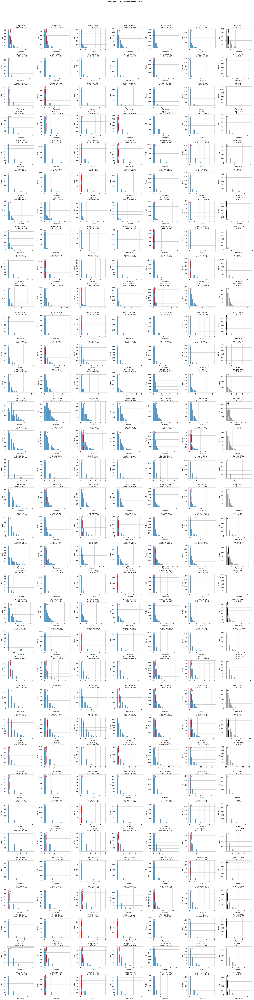

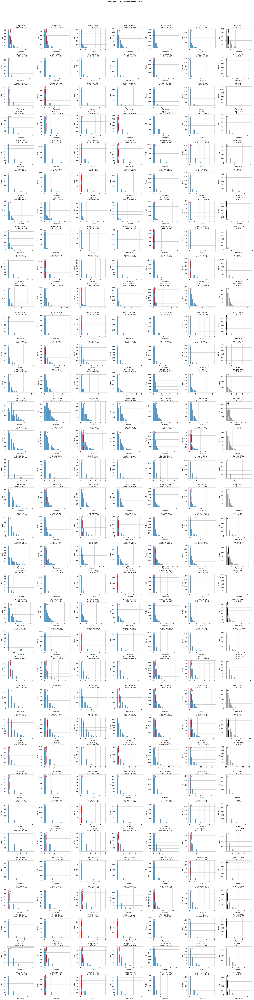

In [35]:
GENES = ["Slc16a3","Slc16a1","Hk2","Pfkl","Nfe2l2","Hmox1","Ldha","Ldhb","Ppargc1a", 'Serpina3n']
plot_histograms_case_vs_control(
    adata,
    genes=plot_order,
    celltype="Astrocyte",
    bin_col="dist_bin",
    ct_col="celltype_merged",
    cond_col="condition",
    control_label="CONTROL",
    case_label=None,          # None => all non-control as case
    layer="raw",
    bins_order=["0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm"],
    detect_threshold=0.0,
    show_median=False,
    title_prefix="Astrocyte"
)

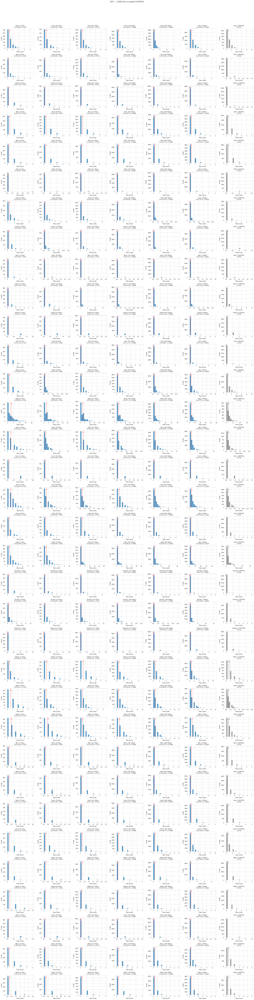

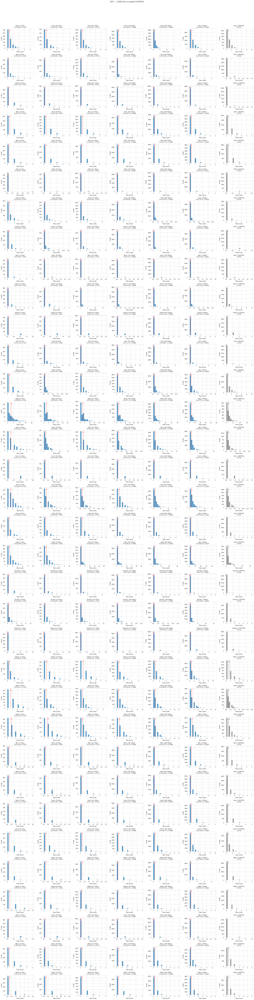

In [57]:
GENES = ["Slc16a3","Slc16a1","Hk2","Pfkl","Nfe2l2","Hmox1","Ldha","Ldhb","Ppargc1a", 'Serpina3n']
plot_histograms_case_vs_control(
    adata,
    genes=plot_order,
    celltype="OPC",
    bin_col="dist_bin",
    ct_col="celltype_merged",
    cond_col="condition",
    control_label="CONTROL",
    case_label=None,          # None => all non-control as case
    layer="raw",
    bins_order=["0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm"],
    detect_threshold=0.0,
    show_median=False,
    title_prefix="OPC"
)

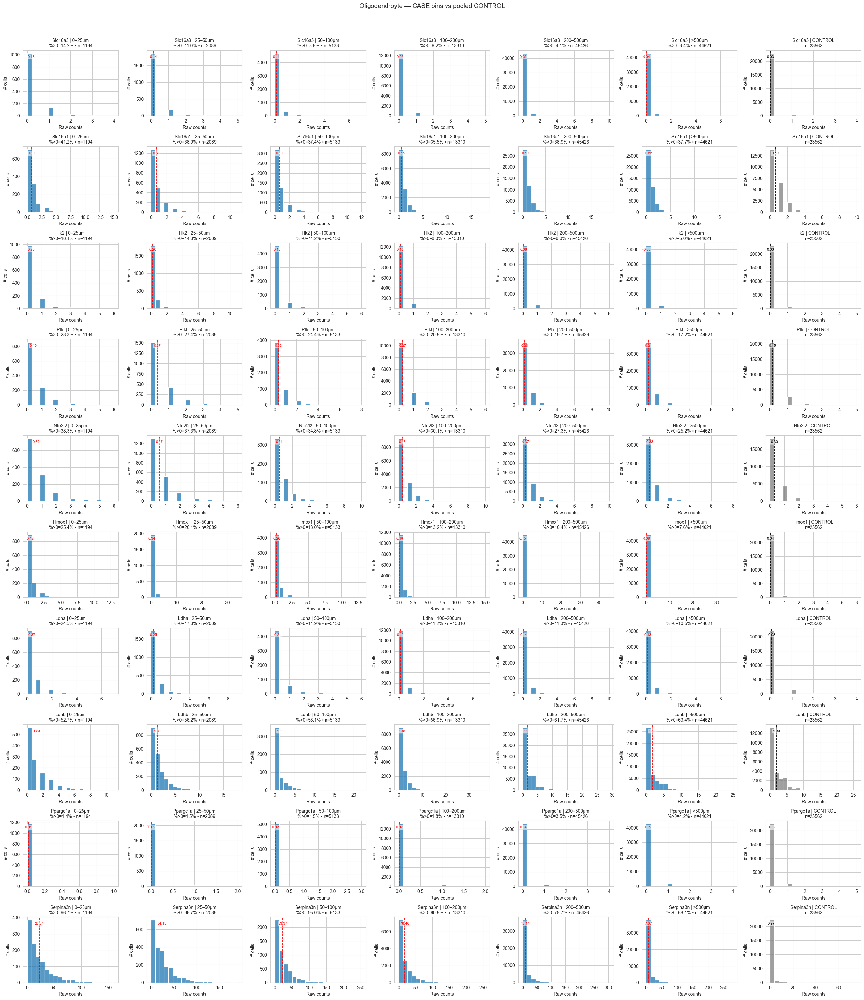

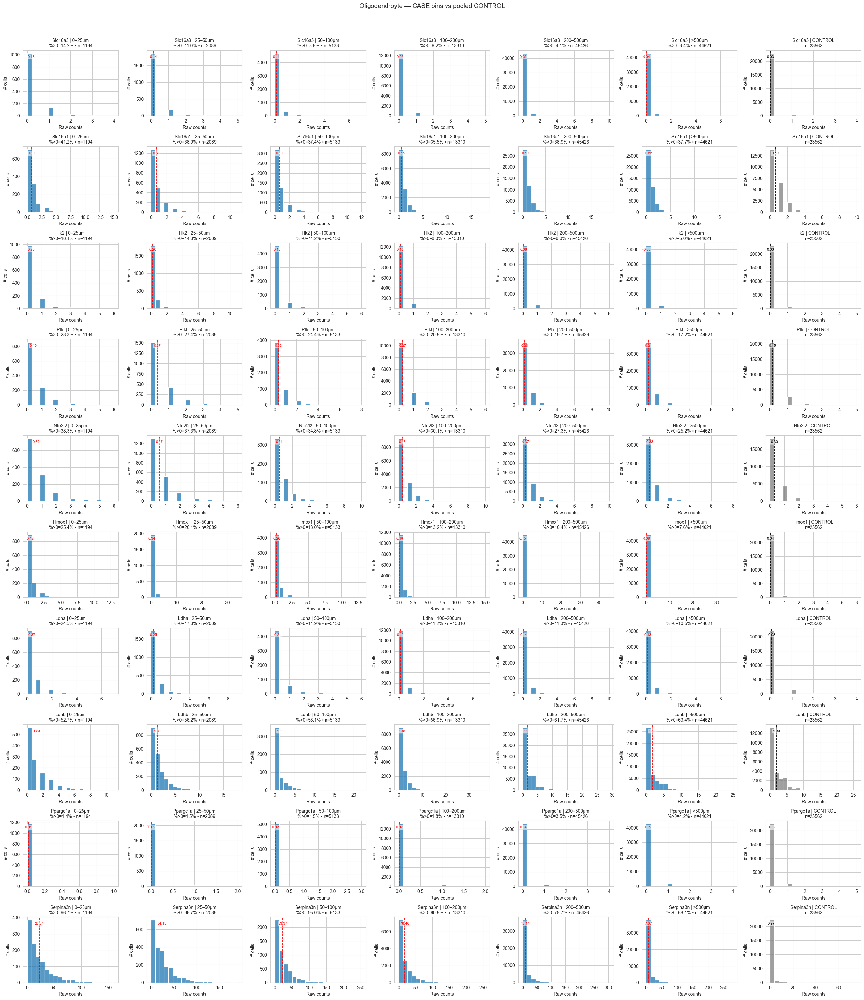

In [590]:
GENES = ["Slc16a3","Slc16a1","Hk2","Pfkl","Nfe2l2","Hmox1","Ldha","Ldhb","Ppargc1a", 'Serpina3n']
plot_histograms_case_vs_control(
    adata,
    genes=GENES,
    celltype="Oligodendrocyte",
    bin_col="dist_bin",
    ct_col="celltype_merged",
    cond_col="condition",
    control_label="CONTROL",
    case_label=None,          # None => all non-control as case
    layer="raw",
    bins_order=["0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm"],
    detect_threshold=0.0,
    show_median=False,
    title_prefix="Oligodendroyte"
)

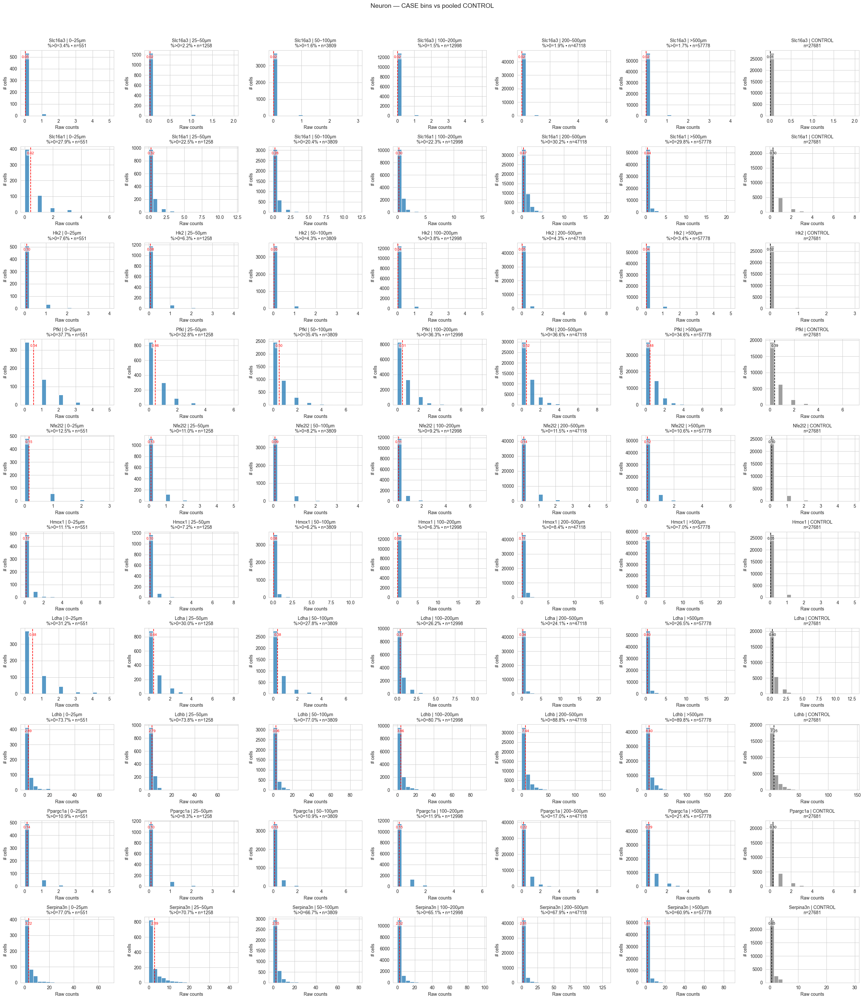

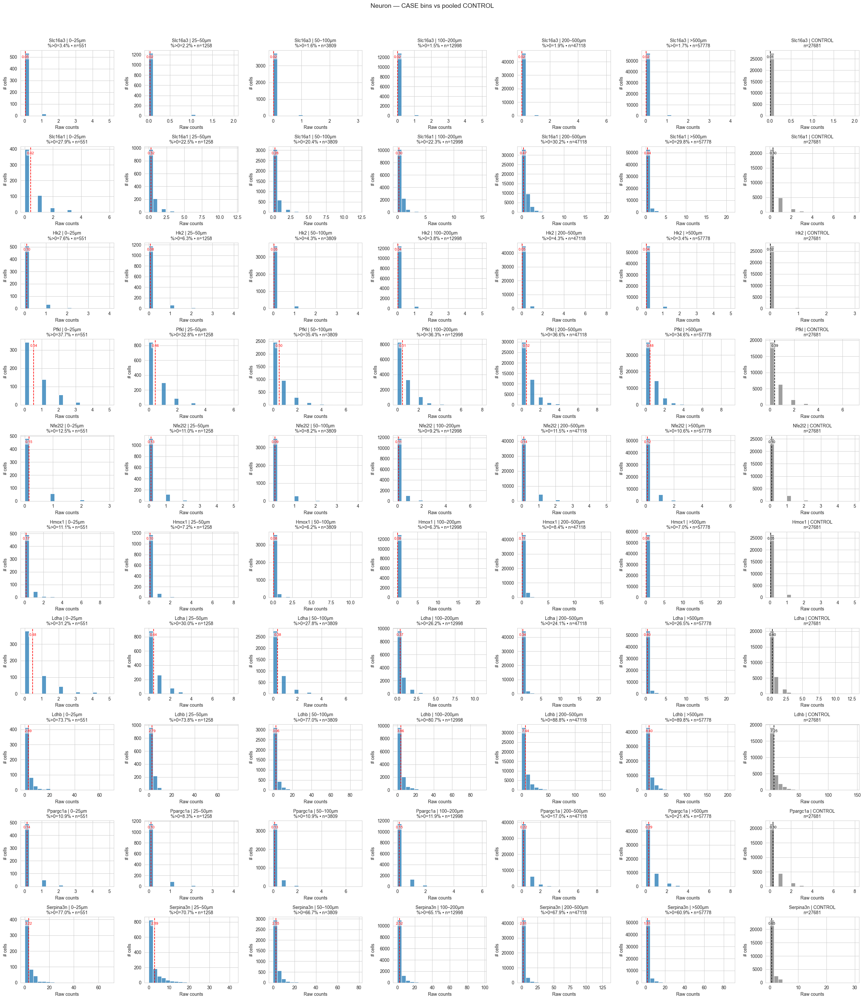

In [736]:
GENES = ["Slc16a3","Slc16a1","Hk2","Pfkl","Nfe2l2","Hmox1","Ldha","Ldhb","Ppargc1a", 'Serpina3n']
plot_histograms_case_vs_control(
    adata,
    genes=GENES,
    celltype="Neuron",
    bin_col="dist_bin",
    ct_col="celltype_merged",
    cond_col="condition",
    control_label="CONTROL",
    case_label=None,          # None => all non-control as case
    layer="raw",
    bins_order=["0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm"],
    detect_threshold=0.0,
    show_median=False,
    title_prefix="Neuron"
)

In [739]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Optional, List, Tuple
# =========================
# Dot plot: mean (color) + % expressing (size)
# =========================
import numpy as np
import pandas as pd
import scipy.sparse as sp
import seaborn as sns
import matplotlib.pyplot as plt

# ---------- helpers ----------
def _to_dense(X):
    return X.toarray() if sp.issparse(X) else np.asarray(X)

def _get_expr_matrix(ad, layer=None):
    if (layer is not None) and (layer in ad.layers):
        X = ad.layers[layer]
    else:
        X = ad.X
    return _to_dense(X)

def _ensure_genes_present(ad, genes):
    present = [g for g in genes if g in ad.var_names]
    missing = [g for g in genes if g not in ad.var_names]
    if missing:
        print(f"[warn] {len(missing)} genes not found and will be skipped: {missing[:20]}{' ...' if len(missing)>20 else ''}")
    return present

def _ordered_bins(series, bins_order=None):
    if bins_order is not None:
        return list(bins_order)
    if pd.api.types.is_categorical_dtype(series):
        return list(series.cat.categories)
    return list(series.dropna().unique())

# ---------- summaries ----------
def summarize_mean_and_pct_by_bin(
    ad, genes, celltype,
    bin_col="lesion_distance_bin",
    ct_col="celltype_merged",
    cond_col="condition",
    case_label=None,            # None => treat all non-control as case
    control_label="CONTROL",
    layer="raw",
    detect_threshold=0.0,
    bins_order=None
):
    genes = _ensure_genes_present(ad, genes)
    if not genes:
        return pd.DataFrame()

    # CASE = condition != control (or exactly case_label if provided)
    if case_label is None:
        mask_case = ad.obs[cond_col].astype(str).ne(control_label)
    else:
        mask_case = ad.obs[cond_col].astype(str).eq(case_label)

    mask = mask_case & ad.obs[ct_col].astype(str).eq(celltype) & ad.obs[bin_col].notna()
    sub = ad[mask, genes]
    if sub.n_obs == 0:
        print("[warn] no case cells for this selection")
        return pd.DataFrame()

    bins_in_order = _ordered_bins(sub.obs[bin_col], bins_order)
    X = _get_expr_matrix(sub, layer=layer)
    df = pd.DataFrame(X, index=sub.obs_names, columns=genes)
    df[bin_col] = sub.obs[bin_col].values

    rows = []
    for b in bins_in_order:
        dfb = df[df[bin_col] == b]
        if dfb.empty: 
            continue
        for g in genes:
            vals = dfb[g].astype(float).values
            rows.append({
                "bin": b,
                "gene": g,
                "mean": float(np.mean(vals)),
                "pct_expressing": float((vals > detect_threshold).mean()),
                "n_cells": int(len(vals))
            })
    out = pd.DataFrame(rows)
    if out.empty:
        return out
    out["bin"] = pd.Categorical(out["bin"], categories=bins_in_order, ordered=True)
    return out.sort_values(["gene","bin"])

def pooled_control_baseline(
    ad, genes, celltype,
    ct_col="celltype_merged",
    cond_col="condition",
    control_label="CONTROL",
    layer="raw",
    detect_threshold=0.0
):
    genes = _ensure_genes_present(ad, genes)
    if not genes:
        return pd.DataFrame()

    mask = ad.obs[ct_col].astype(str).eq(celltype) & ad.obs[cond_col].astype(str).eq(control_label)
    sub = ad[mask, genes]
    if sub.n_obs == 0:
        print("[warn] no control cells for this selection")
        return pd.DataFrame()

    X = _get_expr_matrix(sub, layer=layer)
    mean_ctrl = X.mean(axis=0)
    pct_ctrl  = (X > detect_threshold).mean(axis=0)

    return pd.DataFrame({"gene": genes, "mean": mean_ctrl, "pct_expressing": pct_ctrl})

def build_dotplot_table(
    ad, genes, celltype,
    bin_col="lesion_distance_bin",
    ct_col="celltype_merged",
    cond_col="condition",
    control_label="CONTROL",
    case_label=None,
    layer="raw",
    detect_threshold=0.0,
    bins_order=None,
    control_bin_name="CONTROL"
):
    # case bins
    case_df = summarize_mean_and_pct_by_bin(
        ad, genes, celltype,
        bin_col=bin_col, ct_col=ct_col, cond_col=cond_col,
        case_label=case_label, control_label=control_label,
        layer=layer, detect_threshold=detect_threshold, bins_order=bins_order
    )
    # pooled control “bin”
    ctrl_df = pooled_control_baseline(
        ad, genes, celltype,
        ct_col=ct_col, cond_col=cond_col, control_label=control_label,
        layer=layer, detect_threshold=detect_threshold
    )
    if not ctrl_df.empty:
        ctrl_df = ctrl_df.assign(bin=control_bin_name, n_cells=np.nan)

    df = pd.concat([case_df, ctrl_df], ignore_index=True)
    # order bins: case bins then CONTROL at the end
    if not case_df.empty:
        case_bins = list(case_df["bin"].cat.categories) if pd.api.types.is_categorical_dtype(case_df["bin"]) \
                    else _ordered_bins(case_df["bin"])
    else:
        case_bins = []
    order = case_bins + ([control_bin_name] if not ctrl_df.empty else [])
    df["bin"] = pd.Categorical(df["bin"], categories=order, ordered=True)
    return df.sort_values(["gene","bin"])

# -------------------------------
# 1) Add z-scores to your summary
# -------------------------------
def compute_zscores(
    df: pd.DataFrame,
    control_label: str = "CONTROL",
    min_sd: float = 1e-6
) -> pd.DataFrame:
    """
    Expects columns: gene, bin, mean (raw counts or CPM), pct_expressing (0..1).

    Adds:
      - z_vs_ctrl: (mean_bin - mean_control_bin) / SD_across_bins_for_that_gene
      - z_within_gene: (mean_bin - gene_mean) / gene_sd

    If a gene lacks CONTROL or has ~0 SD across bins, z is set to 0 for safety.
    """
    out = df.copy()

    # SD across bins per gene (for scaling)
    sd_by_gene = (
        out.groupby("gene")["mean"]
           .std(ddof=1)
           .replace(0, np.nan)
    )

    # gene-wise center (for z_within_gene)
    mean_by_gene = out.groupby("gene")["mean"].mean()

    # control mean per gene (anchor)
    ctrl = (
        out.loc[out["bin"] == control_label, ["gene", "mean"]]
           .drop_duplicates(subset=["gene"])
           .rename(columns={"mean": "mean_control"})
           .set_index("gene")
    )

    out = out.join(sd_by_gene.rename("sd_gene"), on="gene")
    out = out.join(mean_by_gene.rename("mean_gene"), on="gene")
    out = out.join(ctrl, on="gene")

    # z within gene (standardize across bins)
    z_within = (out["mean"] - out["mean_gene"]) / out["sd_gene"]
    z_within = z_within.replace([np.inf, -np.inf], np.nan).fillna(0.0)

    # z vs control (anchored at CONTROL)
    num = out["mean"] - out["mean_control"]
    den = out["sd_gene"].where(out["sd_gene"].abs() >= min_sd, np.nan)
    z_vs_ctrl = (num / den).replace([np.inf, -np.inf], np.nan).fillna(0.0)

    out["z_within_gene"] = z_within.astype(float)
    out["z_vs_ctrl"] = z_vs_ctrl.astype(float)
    return out

# -----------------------------------------
# 2) Pretty dotplot with z-score color modes
# -----------------------------------------
from typing import Optional, Tuple, List
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# -----------------------------------------
# 2) Pretty dotplot with z-score color modes
#    + sort genes by z in a chosen bin
# -----------------------------------------
def plot_dotplot_beautified(
    df: pd.DataFrame,
    title: str = "Dotplot: % expressing (size) & mean/z (color)",
    color_mode: str = "log1p_mean",      # "mean", "log1p_mean", "z_vs_ctrl", "z_within_gene"
    cmap: Optional[str] = None,          # auto-chosen if None
    size_range: Tuple[int, int] = (20, 300),
    sort_genes: Optional[str] = "mean",  # "z", "mean", "pct", "name", or None
    sort_genes_bin: Optional[str] = "0–25µm",  # which bin to use when sort_genes in {"z","mean","pct"}
    sort_bins: Optional[List[str]] = None,
    control_last: bool = True,
    jitter_y: float = 0.0,
    vmin: Optional[float] = None,
    vmax: Optional[float] = None,
    annotate_sizes: Optional[Tuple[int,int,int]] = (10, 50, 90)  # % levels
):
    """
    df must have: gene, bin, mean, pct_expressing.
    If color_mode is z*, df must also have those computed columns (use compute_zscores()).

    Sorting:
      - sort_genes="z"   -> sort by `z_vs_ctrl` in `sort_genes_bin`
      - sort_genes="mean"-> sort by `mean` in `sort_genes_bin` (or overall mean if bin missing)
      - sort_genes="pct" -> sort by `pct_expressing` in `sort_genes_bin`
      - sort_genes="name"-> alphabetical
      - sort_genes=None  -> leave as-is
    """

    if df.empty:
        print("[warn] nothing to plot")
        return

    plot_df = df.copy()

    # ---------- choose color source ----------
    if color_mode == "log1p_mean":
        plot_df["color_val"] = np.log1p(plot_df["mean"])
        cbar_label = "log1p(mean counts)"
        cmap = cmap or "rocket_r"
    elif color_mode == "mean":
        plot_df["color_val"] = plot_df["mean"]
        cbar_label = "Mean counts"
        cmap = cmap or "rocket_r"
    elif color_mode == "z_vs_ctrl":
        if "z_vs_ctrl" not in plot_df.columns:
            raise ValueError("z_vs_ctrl not found; run compute_zscores(...) first.")
        plot_df["color_val"] = plot_df["z_vs_ctrl"]
        cbar_label = "z vs CONTROL"
        cmap = cmap or "coolwarm"
        if vmin is None or vmax is None:
            m = np.nanmax(np.abs(plot_df["color_val"].values))
            vmin, vmax = -m, m
    elif color_mode == "z_within_gene":
        if "z_within_gene" not in plot_df.columns:
            raise ValueError("z_within_gene not found; run compute_zscores(...) first.")
        plot_df["color_val"] = plot_df["z_within_gene"]
        cbar_label = "z within gene"
        cmap = cmap or "coolwarm"
        if vmin is None or vmax is None:
            m = np.nanmax(np.abs(plot_df["color_val"].values))
            vmin, vmax = -m, m
    else:
        raise ValueError("color_mode must be one of: 'mean','log1p_mean','z_vs_ctrl','z_within_gene'")

    # ---------- order bins ----------
    if sort_bins is not None:
        plot_df["bin"] = pd.Categorical(plot_df["bin"], categories=sort_bins, ordered=True)
    elif control_last:
        bins = list(plot_df["bin"].unique())
        if "CONTROL" in bins:
            bins = [b for b in bins if b != "CONTROL"] + ["CONTROL"]
            plot_df["bin"] = pd.Categorical(plot_df["bin"], categories=bins, ordered=True)

    # ---------- gene sorting ----------
    if sort_genes in {"z", "mean", "pct"} and sort_genes_bin is not None:
        # pick metric column
        if sort_genes == "z":
            if "z_vs_ctrl" not in plot_df.columns:
                raise ValueError("sort_genes='z' requires column 'z_vs_ctrl'.")
            metric_col = "z_vs_ctrl"
        elif sort_genes == "mean":
            metric_col = "mean"
        else:
            metric_col = "pct_expressing"

        sub = plot_df.loc[plot_df["bin"].astype(str) == str(sort_genes_bin)]
        if sub.empty:
            # fall back to global average if the requested bin doesn't exist
            order = (plot_df.groupby("gene")[metric_col]
                             .mean()
                             .sort_values(ascending=False).index.tolist())
        else:
            order = (sub.groupby("gene")[metric_col]
                        .mean()
                        .sort_values(ascending=False).index.tolist())
        plot_df["gene"] = pd.Categorical(plot_df["gene"], categories=order, ordered=True)

    elif sort_genes == "name":
        order = sorted(plot_df["gene"].unique())
        plot_df["gene"] = pd.Categorical(plot_df["gene"], categories=order, ordered=True)
    # sort_genes=None -> keep input order

    # ---------- sizes ----------
    plot_df["pct_plot"] = plot_df["pct_expressing"] * 100.0

    # figure size scales with number of genes/bins
    fig_w = max(3, 0.9 * plot_df["bin"].nunique())
    fig_h = 0.25 * plot_df["gene"].nunique() + 2.5
    plt.figure(figsize=(fig_w, fig_h))

    # optional vertical jitter
    if jitter_y and jitter_y > 0:
        gene_cats = plot_df["gene"].cat.categories if hasattr(plot_df["gene"], "cat") else sorted(plot_df["gene"].unique())
        gene_to_y = {g: i for i, g in enumerate(gene_cats)}
        plot_df["_y"] = plot_df["gene"].map(gene_to_y).astype(float) \
                        + np.random.uniform(-jitter_y, jitter_y, size=len(plot_df))
        y_arg, y_ticks, y_ticklabels = "_y", list(range(len(gene_cats))), gene_cats
    else:
        y_arg, y_ticks, y_ticklabels = "gene", None, None

    ax = sns.scatterplot(
        data=plot_df,
        x="bin", y=y_arg,
        size="pct_plot", sizes=size_range,
        hue="color_val", palette=cmap,
        edgecolor="0.2", linewidth=0.3, alpha=0.95
    )

    # y ticks and italics
    if y_arg == "_y":
        ax.set_yticks(y_ticks)
        ax.set_yticklabels(y_ticklabels)
    for lab in ax.get_yticklabels():
        lab.set_fontstyle("italic")

    ax.invert_yaxis()
    ax.set_xlabel("Distance bin (incl. CONTROL)", fontsize=12)
    ax.set_ylabel("")
    ax.set_title(title, fontsize=15, weight="bold")

    # ----- colorbar (smaller) -----
    norm = plt.Normalize(
        vmin if vmin is not None else plot_df["color_val"].min(),
        vmax if vmax is not None else plot_df["color_val"].max()
    )
    sm = plt.cm.ScalarMappable(cmap=sns.color_palette(cmap, as_cmap=True), norm=norm)
    sm.set_array([])
    cbar = ax.figure.colorbar(sm, ax=ax, pad=0.02, fraction=0.03, aspect=20)  # slim bar
    cbar.set_label({"log1p_mean":"log1p(mean counts)","mean":"Mean counts"}.get(color_mode, "z-score"),
                   fontsize=11)

    # ----- compact % legend (no overlaps) -----
    def area_to_markersize(area_pts2: float) -> float:
        return (area_pts2 / np.pi) ** 0.5 * 2.0

    size_min, size_max = size_range
    pct_levels = annotate_sizes or (10, 50, 90)
    areas = np.interp(pct_levels, [0, 100], [size_min, size_max])
    ms = [area_to_markersize(a) for a in areas]

    # remove seaborn's auto legend (combined hue+size)
    leg = ax.get_legend()
    if leg:
        leg.remove()

    handles = [plt.Line2D([0],[0], marker='o', linestyle='',
                          markerfacecolor='none', markeredgecolor='0.4',
                          markersize=m) for m in ms]
    labels = [f"{p}%" for p in pct_levels]
    ax.legend(handles, labels, title="% expressing", frameon=False,
              loc="upper left", bbox_to_anchor=(1.02, 1.0),
              borderaxespad=0.0, handletextpad=0.8, labelspacing=1.6,
              fontsize=9, title_fontsize=10)

    ax.grid(True, which="major", axis="x", color="0.92", lw=0.7)
    plt.xticks(rotation=35, ha="right", fontsize=10)
    plt.yticks(fontsize=10)
    plt.tight_layout()
    plt.show()

In [765]:
# =========================
# Example usage
# =========================
# Columns in your AnnData:
CT_COL   = "celltype_merged"
COND_COL = "condition"
BIN_COL  = "dist_bin"   # or your 'dist_bin'
CONTROL  = "CONTROL"
CASE     = None    # None => use all non-control as "case"
LAYER    = "raw"   # Xenium counts

# Fix bin order (optional)
BINS_ORDER = ["0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm"]

# Panel of genes (edit as needed)
GENES = plot_order

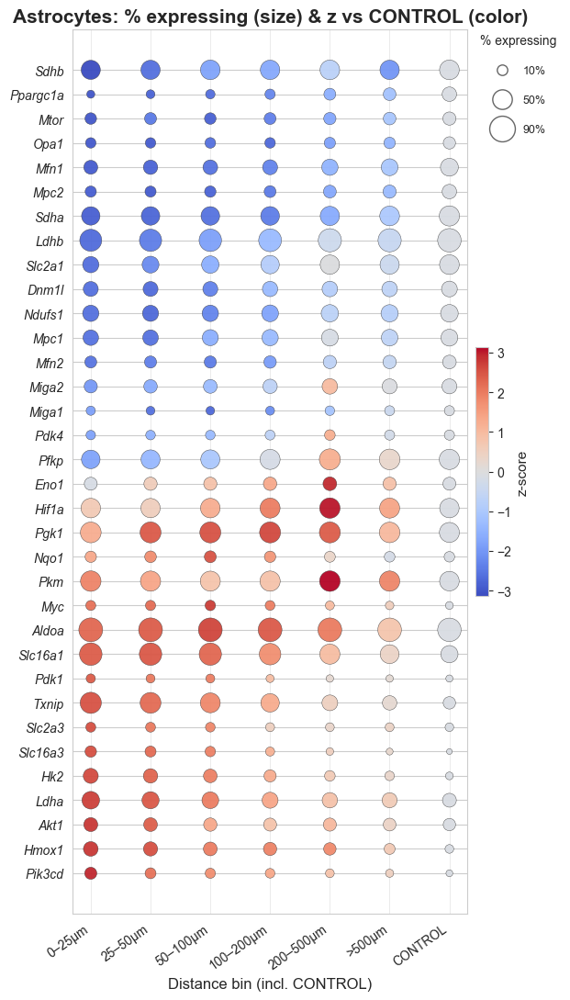

In [766]:
# Cell type to plot
CELLTYPE = "Astrocyte"

# Build table (bins + pooled CONTROL)
dot_df = build_dotplot_table(
    adata, GENES, CELLTYPE,
    bin_col=BIN_COL, ct_col=CT_COL, cond_col=COND_COL,
    control_label=CONTROL, case_label=CASE,
    layer=LAYER, detect_threshold=0.0,
    bins_order=BINS_ORDER,
    control_bin_name="CONTROL"
)
# 1) add z-scores
summ_z = compute_zscores(dot_df, control_label="CONTROL")

# 2A) Color by z vs CONTROL (blue=below, red=above control)
plot_dotplot_beautified(
    summ_z,  # output of compute_zscores(...)
    title="Astrocytes: % expressing (size) & z vs CONTROL (color)",
    color_mode="z_vs_ctrl",
    cmap="coolwarm",
    size_range=(20, 350),
    sort_genes="z",                # << sort by z
    sort_genes_bin="0–25µm",       # << in this bin
    sort_bins=["0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm","CONTROL"],
    control_last=True
)




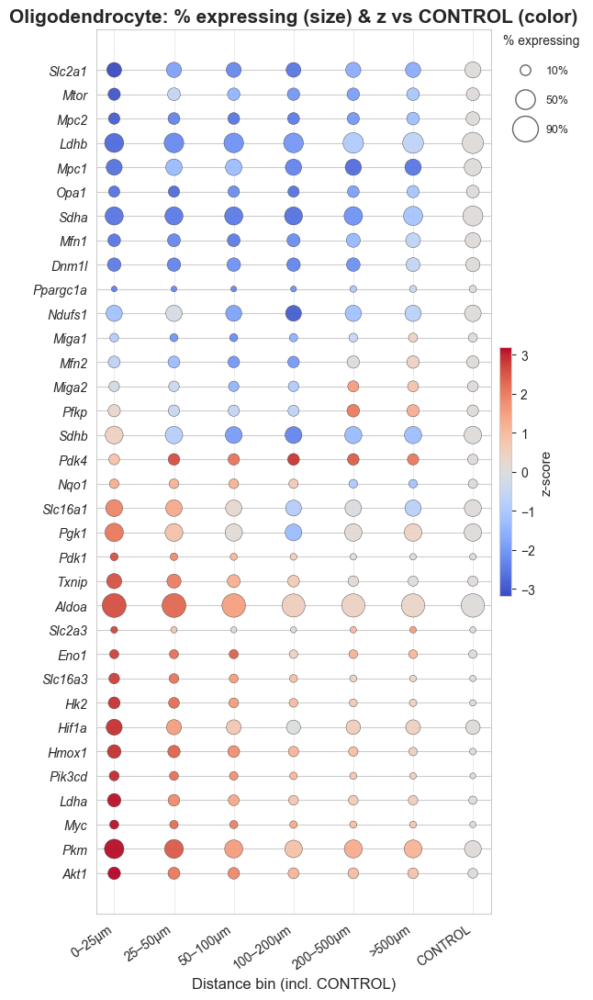

In [767]:
# Cell type to plot
CELLTYPE = "Oligodendrocyte"

# Build table (bins + pooled CONTROL)
dot_df = build_dotplot_table(
    adata, GENES, CELLTYPE,
    bin_col=BIN_COL, ct_col=CT_COL, cond_col=COND_COL,
    control_label=CONTROL, case_label=CASE,
    layer=LAYER, detect_threshold=0.0,
    bins_order=BINS_ORDER,
    control_bin_name="CONTROL"
)
# 1) add z-scores
summ_z = compute_zscores(dot_df, control_label="CONTROL")

# 2A) Color by z vs CONTROL (blue=below, red=above control)
plot_dotplot_beautified(
    summ_z,  # output of compute_zscores(...)
    title=CELLTYPE+": % expressing (size) & z vs CONTROL (color)",
    color_mode="z_vs_ctrl",
    cmap="coolwarm",
    size_range=(20, 350),
    sort_genes="z",                # << sort by z
    sort_genes_bin="0–25µm",       # << in this bin
    sort_bins=["0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm","CONTROL"],
    control_last=True
)




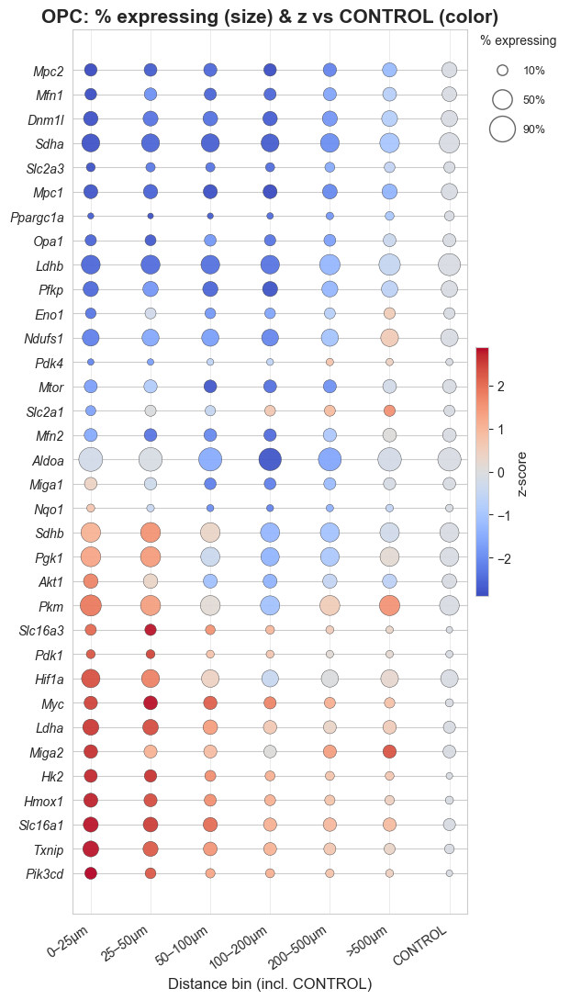

In [768]:
# Cell type to plot
CELLTYPE = "OPC"

# Build table (bins + pooled CONTROL)
dot_df = build_dotplot_table(
    adata, GENES, CELLTYPE,
    bin_col=BIN_COL, ct_col=CT_COL, cond_col=COND_COL,
    control_label=CONTROL, case_label=CASE,
    layer=LAYER, detect_threshold=0.0,
    bins_order=BINS_ORDER,
    control_bin_name="CONTROL"
)
# 1) add z-scores
summ_z = compute_zscores(dot_df, control_label="CONTROL")

# 2A) Color by z vs CONTROL (blue=below, red=above control)
plot_dotplot_beautified(
    summ_z,  # output of compute_zscores(...)
    title=CELLTYPE+": % expressing (size) & z vs CONTROL (color)",
    color_mode="z_vs_ctrl",
    cmap="coolwarm",
    size_range=(20, 350),
    sort_genes="z",                # << sort by z
    sort_genes_bin="0–25µm",       # << in this bin
    sort_bins=["0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm","CONTROL"],
    control_last=True
)




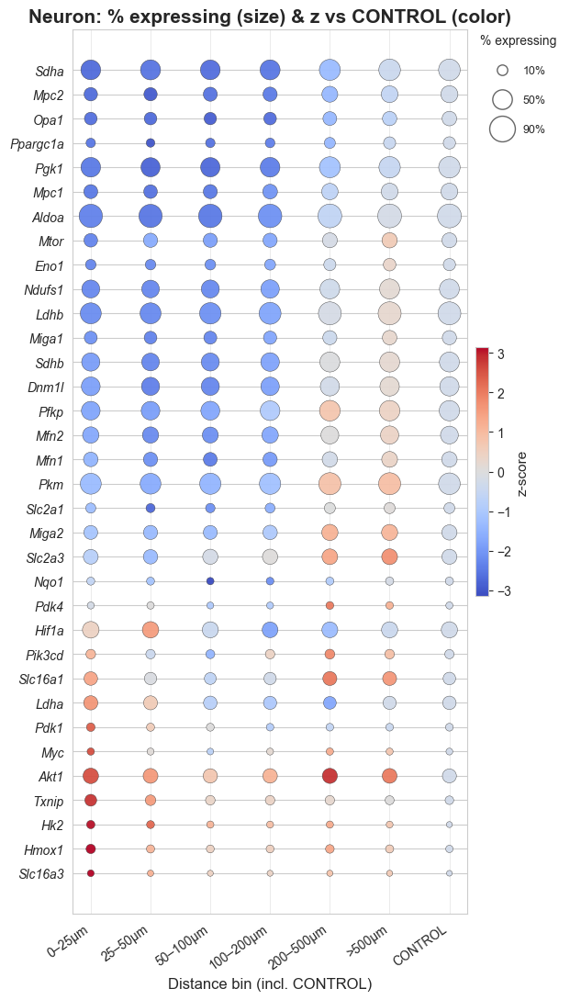

In [769]:
# Cell type to plot
CELLTYPE = "Neuron"

# Build table (bins + pooled CONTROL)
dot_df = build_dotplot_table(
    adata, GENES, CELLTYPE,
    bin_col=BIN_COL, ct_col=CT_COL, cond_col=COND_COL,
    control_label=CONTROL, case_label=CASE,
    layer=LAYER, detect_threshold=0.0,
    bins_order=BINS_ORDER,
    control_bin_name="CONTROL"
)
# 1) add z-scores
summ_z = compute_zscores(dot_df, control_label="CONTROL")

# 2A) Color by z vs CONTROL (blue=below, red=above control)
plot_dotplot_beautified(
    summ_z,  # output of compute_zscores(...)
    title=CELLTYPE+": % expressing (size) & z vs CONTROL (color)",
    color_mode="z_vs_ctrl",
    cmap="coolwarm",
    size_range=(20, 350),
    sort_genes="z",                # << sort by z
    sort_genes_bin="0–25µm",       # << in this bin
    sort_bins=["0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm","CONTROL"],
    control_last=True
)




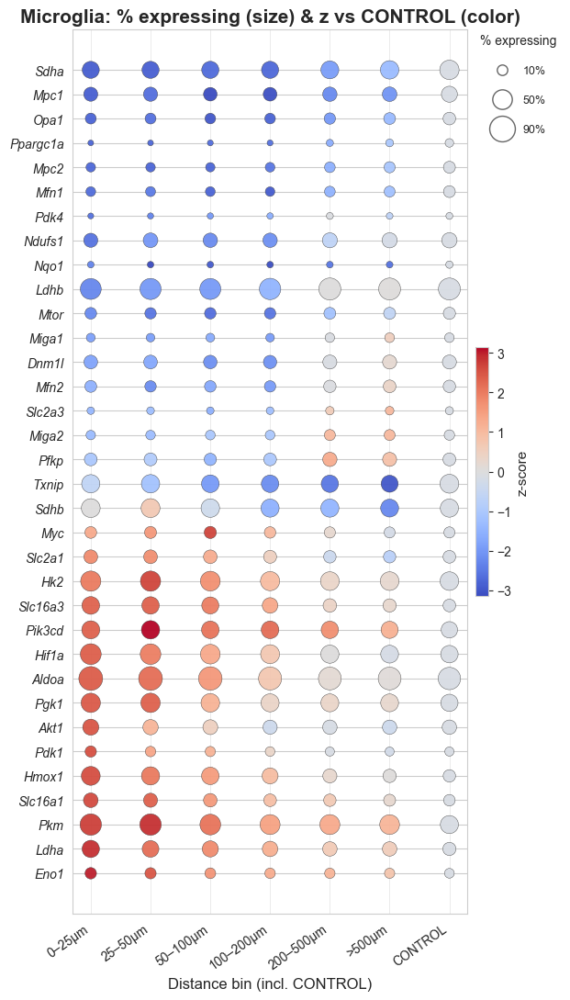

In [770]:
# Cell type to plot
CELLTYPE = "Microglia"

# Build table (bins + pooled CONTROL)
dot_df = build_dotplot_table(
    adata, GENES, CELLTYPE,
    bin_col=BIN_COL, ct_col=CT_COL, cond_col=COND_COL,
    control_label=CONTROL, case_label=CASE,
    layer=LAYER, detect_threshold=0.0,
    bins_order=BINS_ORDER,
    control_bin_name="CONTROL"
)
# 1) add z-scores
summ_z = compute_zscores(dot_df, control_label="CONTROL")

# 2A) Color by z vs CONTROL (blue=below, red=above control)
plot_dotplot_beautified(
    summ_z,  # output of compute_zscores(...)
    title=CELLTYPE+": % expressing (size) & z vs CONTROL (color)",
    color_mode="z_vs_ctrl",
    cmap="coolwarm",
    size_range=(20, 350),
    sort_genes="z",                # << sort by z
    sort_genes_bin="0–25µm",       # << in this bin
    sort_bins=["0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm","CONTROL"],
    control_last=True
)




In [773]:
import numpy as np
import pandas as pd
import scipy.sparse as sp
import seaborn as sns
import matplotlib.pyplot as plt
from typing import Optional, List, Tuple

# -----------------------
# Helpers
# -----------------------
def _to_dense(X):
    return X.toarray() if sp.issparse(X) else np.asarray(X)

def _get_expr_matrix(ad, layer=None):
    if (layer is not None) and (layer in ad.layers):
        X = ad.layers[layer]
    else:
        X = ad.X
    return _to_dense(X)

def _ensure_genes_present(ad, genes):
    present = [g for g in genes if g in ad.var_names]
    missing = [g for g in genes if g not in ad.var_names]
    if missing:
        print(f"[warn] {len(missing)} genes not found and will be skipped:\n{missing[:20]}{' ...' if len(missing)>20 else ''}")
    return present

def _ordered_bins(series, bins_order=None):
    if bins_order is not None:
        return list(bins_order)
    if pd.api.types.is_categorical_dtype(series):
        return list(series.cat.categories)
    return sorted(series.dropna().unique().tolist())

# -----------------------
# 1) Per-sample × bin summaries (CASE) and per-sample controls
# -----------------------
def per_sample_bin_stats(
    ad,
    genes,
    celltype,
    bin_col="lesion_distance_bin",
    ct_col="celltype_merged",
    cond_col="condition",
    control_label="CONTROL",
    sample_col="sample_id",
    layer="raw",
    detect_threshold=0.0,
    bins_order=None
):
    """
    Returns:
      case_df: rows per (sample, bin, gene) in non-control samples
               columns: sample, bin, gene, mean, pct_expressing, n_cells
      ctrl_df: rows per (control sample, gene), pooling all control cells (no bin)
               columns: sample, gene, mean_ctrl, pct_ctrl, n_cells_ctrl
    """
    genes = _ensure_genes_present(ad, genes)
    if not genes:
        return pd.DataFrame(), pd.DataFrame()

    obs = ad.obs
    # CASE: non-controls with valid bin
    mask_case = (obs[cond_col] != control_label) & (obs[ct_col] == celltype) & obs[bin_col].notna() & obs[sample_col].notna()
    sub_case = ad[mask_case, genes]
    bins_in_order = _ordered_bins(sub_case.obs[bin_col], bins_order) if sub_case.n_obs > 0 else None

    Xc = _get_expr_matrix(sub_case, layer=layer) if sub_case.n_obs > 0 else None
    case_df = []
    if sub_case.n_obs > 0:
        dfc = pd.DataFrame(Xc, index=sub_case.obs_names, columns=genes)
        meta = sub_case.obs[[sample_col, bin_col]].rename(columns={sample_col:"sample", bin_col:"bin"})
        for (s, b), idx in meta.groupby(["sample","bin"]).indices.items():
            block = dfc.iloc[idx, :]
            n_cells = int(block.shape[0])
            for g in genes:
                vals = block[g].astype(float).values
                case_df.append({
                    "sample": s,
                    "bin": b,
                    "gene": g,
                    "mean": float(np.mean(vals)),
                    "pct_expressing": float((vals > detect_threshold).mean()),
                    "n_cells": n_cells
                })
    case_df = pd.DataFrame(case_df)
    if (not case_df.empty) and bins_in_order is not None:
        case_df["bin"] = pd.Categorical(case_df["bin"], categories=bins_in_order, ordered=True)

    # CONTROLS: per control sample, pool across tissue (no bin)
    mask_ctrl = (obs[cond_col] == control_label) & (obs[ct_col] == celltype) & obs[sample_col].notna()
    sub_ctrl = ad[mask_ctrl, genes]
    X0 = _get_expr_matrix(sub_ctrl, layer=layer) if sub_ctrl.n_obs > 0 else None
    ctrl_df = []
    if sub_ctrl.n_obs > 0:
        df0 = pd.DataFrame(X0, index=sub_ctrl.obs_names, columns=genes)
        meta0 = sub_ctrl.obs[[sample_col]].rename(columns={sample_col:"sample"})
        for s, idx in meta0.groupby("sample").indices.items():
            block = df0.iloc[idx, :]
            n_cells = int(block.shape[0])
            for g in genes:
                vals = block[g].astype(float).values
                ctrl_df.append({
                    "sample": s,
                    "gene": g,
                    "mean_ctrl": float(np.mean(vals)),
                    "pct_ctrl": float((vals > detect_threshold).mean()),
                    "n_cells_ctrl": n_cells
                })
    ctrl_df = pd.DataFrame(ctrl_df)

    return case_df, ctrl_df

# -----------------------
# 2) Compute z-scores vs control distribution per sample
# -----------------------
def attach_z_vs_controls(case_df, ctrl_df):
    """
    For each gene, compute control mean & sd across control samples (for mean and pct),
    then compute z for each CASE (sample,bin,gene):
        z_mean = (mean - mu_ctrl_mean) / sd_ctrl_mean
        z_pct  = (pct_expressing - mu_ctrl_pct) / sd_ctrl_pct
    """
    if case_df.empty or ctrl_df.empty:
        return case_df.copy()

    # Control distribution per gene
    ctrl_mu = (ctrl_df.groupby("gene")
                     .agg(mu_mean_ctrl=("mean_ctrl","mean"),
                          sd_mean_ctrl=("mean_ctrl","std"),
                          mu_pct_ctrl =("pct_ctrl","mean"),
                          sd_pct_ctrl =("pct_ctrl","std"))
                     .reset_index())

    df = case_df.merge(ctrl_mu, on="gene", how="left")

    # safe z (avoid zero sd -> NaN)
    def _safe_z(x, mu, sd):
        sd = np.where(sd>0, sd, np.nan)
        return (x - mu) / sd

    df["z_mean_vs_ctrl"] = _safe_z(df["mean"].values, df["mu_mean_ctrl"].values, df["sd_mean_ctrl"].values)
    df["z_pct_vs_ctrl"]  = _safe_z(df["pct_expressing"].values, df["mu_pct_ctrl"].values, df["sd_pct_ctrl"].values)
    return df

# -----------------------
# 3) Aggregate across replicates (per bin, per gene)
# -----------------------
def aggregate_replicates(case_with_z):
    """
    Returns per (gene, bin):
      - mean_mean, sd_mean, mean_pct, sd_pct, n_samples
      - z_mean_stouffer, z_pct_stouffer (meta z combining per-sample z)
    """
    if case_with_z.empty:
        return pd.DataFrame()

    # Meta combine z by Stouffer (equal weights)
    def stouffer(z):
        z = pd.Series(z).dropna()
        if z.empty: return np.nan
        return z.sum() / np.sqrt(len(z))

    agg = (case_with_z.groupby(["gene","bin"])
           .agg(mean_mean=("mean","mean"),
                sd_mean=("mean","std"),
                mean_pct=("pct_expressing","mean"),
                sd_pct=("pct_expressing","std"),
                n_samples=("sample","nunique"),
                z_mean_stouffer=("z_mean_vs_ctrl", stouffer),
                z_pct_stouffer=("z_pct_vs_ctrl", stouffer))
           .reset_index())

    # keep bin categorical order if present
    if pd.api.types.is_categorical_dtype(case_with_z["bin"]):
        agg["bin"] = pd.Categorical(agg["bin"], categories=case_with_z["bin"].cat.categories, ordered=True)
        agg = agg.sort_values(["gene","bin"])
    return agg

# -----------------------
# 4) Replicate-aware dotplot (color = z_mean_stouffer or mean_mean)
# -----------------------
def plot_dotplot_replicate_aware(
    agg_df: pd.DataFrame,
    title: str = "Replicate-aware dotplot",
    color_mode: str = "z_mean",     # "z_mean", "z_pct", "log1p_mean", "mean"
    cmap: Optional[str] = None,
    size_range: Tuple[int,int] = (20, 350),
    sort_genes: Optional[str] = None,       # None, "name", "mean"
    gene_order: Optional[List[str]] = None, # preserve custom order if provided
    bins_order: Optional[List[str]] = None, # fix x-order if desired
    control_last: bool = True,
    annotate_sizes: Optional[Tuple[int,int,int]] = (10, 50, 90)
):
    """
    Expects agg_df from aggregate_replicates().
      size  = mean_pct (×100)
      color = chosen metric (z_mean_stouffer / z_pct_stouffer / mean_mean)
    """
    if agg_df.empty:
        print("[warn] nothing to plot")
        return

    df = agg_df.copy()

    # choose color
    if color_mode == "z_mean":
        color_col = "z_mean_stouffer"; cbar_label = "Z (mean vs control)"
        cmap = cmap or "coolwarm"
        m = np.nanmax(np.abs(df[color_col].values))
        vmin, vmax = -m, m
    elif color_mode == "z_pct":
        color_col = "z_pct_stouffer"; cbar_label = "Z (fraction vs control)"
        cmap = cmap or "coolwarm"
        m = np.nanmax(np.abs(df[color_col].values))
        vmin, vmax = -m, m
    elif color_mode == "log1p_mean":
        color_col = "mean_mean"; cbar_label = "log1p(mean counts)"
        df["_color_val"] = np.log1p(df[color_col].clip(lower=0))
        color_col = "_color_val"
        cmap = cmap or "rocket_r"
        vmin, vmax = None, None
    elif color_mode == "mean":
        color_col = "mean_mean"; cbar_label = "Mean counts"
        cmap = cmap or "rocket_r"
        vmin, vmax = None, None
    else:
        raise ValueError("color_mode must be one of: 'z_mean','z_pct','log1p_mean','mean'")

    # gene order
    if gene_order is not None:
        df["gene"] = pd.Categorical(df["gene"], categories=[g for g in gene_order if g in df["gene"].unique()], ordered=True)
    elif sort_genes == "mean":
        order = (df.groupby("gene")["mean_mean"].mean().sort_values(ascending=False).index.tolist())
        df["gene"] = pd.Categorical(df["gene"], categories=order, ordered=True)
    elif sort_genes == "name":
        order = sorted(df["gene"].unique().tolist())
        df["gene"] = pd.Categorical(df["gene"], categories=order, ordered=True)

    # bin order
    if bins_order is not None:
        df["bin"] = pd.Categorical(df["bin"], categories=bins_order, ordered=True)
    elif control_last and "CONTROL" in df["bin"].unique().tolist():
        bins = [b for b in df["bin"].unique().tolist() if b != "CONTROL"] + ["CONTROL"]
        df["bin"] = pd.Categorical(df["bin"], categories=bins, ordered=True)

    df["pct_plot"] = df["mean_pct"] * 100.0

    # figure size
    fig_w = max(3, 0.9 * df["bin"].nunique())
    fig_h = 0.25 * df["gene"].nunique() + 2.5
    plt.figure(figsize=(fig_w, fig_h))

    ax = sns.scatterplot(
        data=df,
        x="bin", y="gene",
        size="pct_plot", sizes=size_range,
        hue=color_col, palette=cmap,
        edgecolor="0.2", linewidth=0.3, alpha=0.95
    )
    ax.invert_yaxis()
    ax.set_xlabel("Distance bin (incl. CONTROL)", fontsize=12)
    ax.set_ylabel("")
    ax.set_title(title, fontsize=15, weight="bold")

    # colorbar
    norm = plt.Normalize(
        vmin if (vmin:=locals().get('vmin')) is not None else df[color_col].min(),
        vmax if (vmax:=locals().get('vmax')) is not None else df[color_col].max()
    )
    sm = plt.cm.ScalarMappable(cmap=sns.color_palette(cmap, as_cmap=True), norm=norm)
    sm.set_array([])
    cbar = ax.figure.colorbar(sm, ax=ax, pad=0.02, fraction=0.035, aspect=18)
    cbar.set_label(cbar_label, fontsize=11)

    # custom size legend
    def area_to_markersize(area_pts2: float) -> float:
        return (area_pts2 / np.pi) ** 0.5 * 2.0
    size_min, size_max = size_range
    pct_levels = annotate_sizes or (10, 50, 90)
    areas = np.interp(pct_levels, [0, 100], [size_min, size_max])
    ms = [area_to_markersize(a) for a in areas]
    handles = [plt.Line2D([0],[0], marker='o', linestyle='', markerfacecolor='none',
                           markeredgecolor='0.4', markersize=m) for m in ms]
    leg = ax.get_legend()
    if leg: leg.remove()
    ax.legend(handles, [f"{p}%" for p in pct_levels],
              title="% expressing (mean across samples)",
              frameon=False, loc="upper left", bbox_to_anchor=(1.02, 1.0),
              fontsize=9, title_fontsize=10, labelspacing=1.4, handletextpad=0.8)

    # small n-samples annotation on the right
    ns = (df.groupby("gene")["n_samples"].max()).reindex(df["gene"].cat.categories if hasattr(df["gene"],"cat") else df["gene"].unique())
    for y, (g, n) in enumerate(ns.items()):
        ax.text(1.01, (y+0.1)/ (len(ns)+0.2), f"n={int(n)}", transform=ax.transAxes, fontsize=8, ha="left", va="center", color="0.4")

    ax.grid(True, which="major", axis="x", color="0.92", lw=0.7)
    plt.xticks(rotation=35, ha="right", fontsize=10)
    # italicize gene labels
    for lab in ax.get_yticklabels():
        lab.set_fontstyle("italic")
    plt.yticks(fontsize=10)
    plt.tight_layout()
    plt.show()



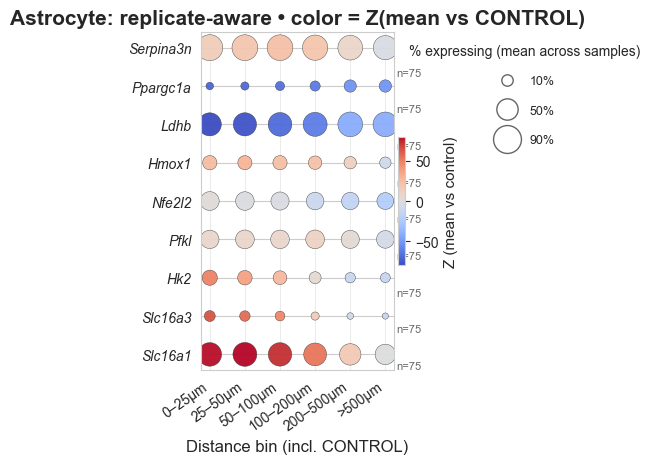

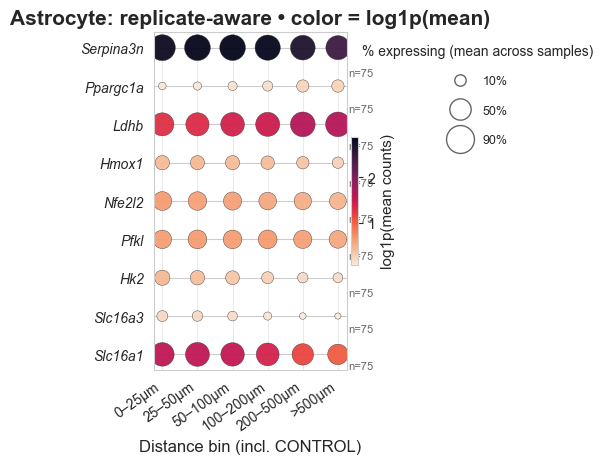

In [774]:
# -----------------------
# Example usage
# -----------------------
# Parameters you already use
BIN_COL  = "dist_bin"   # or your 'dist_bin'
CT_COL   = "celltype_merged"
COND_COL = "condition"
CONTROL  = "CONTROL"
LAYER    = "raw"                    # use 'raw' (Xenium counts) for per-sample summaries
BINS_ORDER = ["0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm"]

# Choose a cell type and genes
CELLTYPE = "Astrocyte"
GENES = ["Slc16a1","Slc16a3","Hk2","Pfkl","Nfe2l2","Hmox1","Ldhb","Ppargc1a","Serpina3n"]

# 1) per-sample summaries
case_df, ctrl_df = per_sample_bin_stats(
    adata, GENES, CELLTYPE,
    bin_col=BIN_COL, ct_col=CT_COL, cond_col=COND_COL,
    control_label=CONTROL, sample_col="sample_id",
    layer=LAYER, detect_threshold=0.0, bins_order=BINS_ORDER
)

# 2) z vs controls per sample
case_z = attach_z_vs_controls(case_df, ctrl_df)

# 3) aggregate across samples (replicate-aware)
agg = aggregate_replicates(case_z)

# 4A) replicate-aware dotplot (color = meta Z of mean expression vs controls)
plot_dotplot_replicate_aware(
    agg,
    title=f"{CELLTYPE}: replicate-aware • color = Z(mean vs CONTROL)",
    color_mode="z_mean",
    size_range=(20, 350),
    gene_order=GENES,               # keep your input gene order
    bins_order=BINS_ORDER + ["CONTROL"],  # if you also merge controls as a bin later
    control_last=True
)

# 4B) alternatively color by log1p(mean) across samples
plot_dotplot_replicate_aware(
    agg,
    title=f"{CELLTYPE}: replicate-aware • color = log1p(mean)",
    color_mode="log1p_mean",
    size_range=(20, 350),
    gene_order=GENES,
    bins_order=BINS_ORDER,
    control_last=True
)

In [723]:
# Original (ordered) glycolysis list
glycolysis_enzymes_mouse = [
    "Hk1", "Hk2", "Hk3", "Gck",          # Hexokinases
    "Gpi1",                              # Glucose-6-phosphate isomerase
    "Pfkl", "Pfkm", "Pfkp",              # Phosphofructokinases
    "Aldoa", "Aldob", "Aldoc",           # Aldolases
    "Tpi1",                              # Triosephosphate isomerase
    "Gapdh",                             # Glyceraldehyde-3-phosphate dehydrogenase
    "Pgk1", "Pgk2",                      # Phosphoglycerate kinases
    "Pgam1", "Pgam2", "Pgam4",           # Phosphoglycerate mutases
    "Eno1", "Eno2", "Eno3",              # Enolases
    "Pkm", "Pklr",                       # Pyruvate kinases
    "Ldha", "Ldhb"                       # Lactate dehydrogenases
]

# Flip the order
glycolysis_enzymes_mouse_flipped = list(reversed(glycolysis_enzymes_mouse))

# Keep only genes present in adata
genes_present = [g for g in glycolysis_enzymes_mouse_flipped if g in adata.var_names]

print("Genes to plot (flipped, present only):", genes_present)

Genes to plot (flipped, present only): ['Ldhb', 'Ldha', 'Pklr', 'Pkm', 'Eno2', 'Eno1', 'Pgk2', 'Pgk1', 'Tpi1', 'Aldoc', 'Aldoa', 'Pfkp', 'Pfkl', 'Gpi1', 'Gck', 'Hk2', 'Hk1']


In [721]:
summ_z

,bin,gene,mean,pct_expressing,n_cells,sd_gene,mean_gene,mean_control,z_within_gene,z_vs_ctrl
0,0–25µm,Aldoa,5.991228,0.935464,1596.0,0.500454,5.748160,4.836884,0.485696,2.306594
1,25–50µm,Aldoa,6.043300,0.932088,2194.0,0.500454,5.748160,4.836884,0.589745,2.410643
2,50–100µm,Aldoa,6.178401,0.926585,3991.0,0.500454,5.748160,4.836884,0.859703,2.680601
3,100–200µm,Aldoa,6.058151,0.925498,8134.0,0.500454,5.748160,4.836884,0.619420,2.440318
4,200–500µm,Aldoa,5.862489,0.926300,25278.0,0.500454,5.748160,4.836884,0.228451,2.049350
...,...,...,...,...,...,...,...,...,...,...
98,50–100µm,Tpi1,1.625157,0.665748,3991.0,0.085036,1.577035,1.432021,0.565899,2.271204
99,100–200µm,Tpi1,1.591960,0.653430,8134.0,0.085036,1.577035,1.432021,0.175515,1.880819
100,200–500µm,Tpi1,1.616861,0.668526,25278.0,0.085036,1.577035,1.432021,0.468340,2.173645
101,>500µm,Tpi1,1.490166,0.643361,28219.0,0.085036,1.577035,1.432021,-1.021542,0.683762


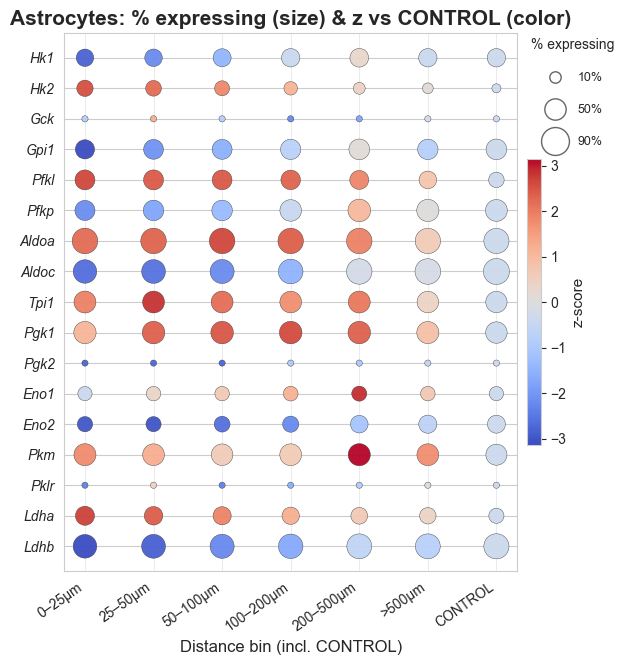

In [732]:
# Cell type to plot
CELLTYPE = "Astrocyte"

# Build table (bins + pooled CONTROL)
dot_df = build_dotplot_table(
    adata, genes_present, CELLTYPE,
    bin_col=BIN_COL, ct_col=CT_COL, cond_col=COND_COL,
    control_label=CONTROL, case_label=CASE,
    layer=LAYER, detect_threshold=0.0,
    bins_order=BINS_ORDER,
    control_bin_name="CONTROL"
)

# Force gene order exactly as given in your list
# force gene order from your list
gene_order = genes_present
summ_z = compute_zscores(dot_df, control_label="CONTROL")

summ_z = summ_z.copy()
summ_z["gene"] = pd.Categorical(
    summ_z["gene"],
    categories=gene_order,
    ordered=True
)

# plot without triggering any sorting
plot_dotplot_beautified(
    summ_z,
    title="Astrocytes: % expressing (size) & z vs CONTROL (color)",
    color_mode="z_vs_ctrl",
    cmap="coolwarm",
    size_range=(20, 350),
    sort_genes=None,   # don't auto-sort
    sort_bins=["0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm","CONTROL"],
    control_last=True
)

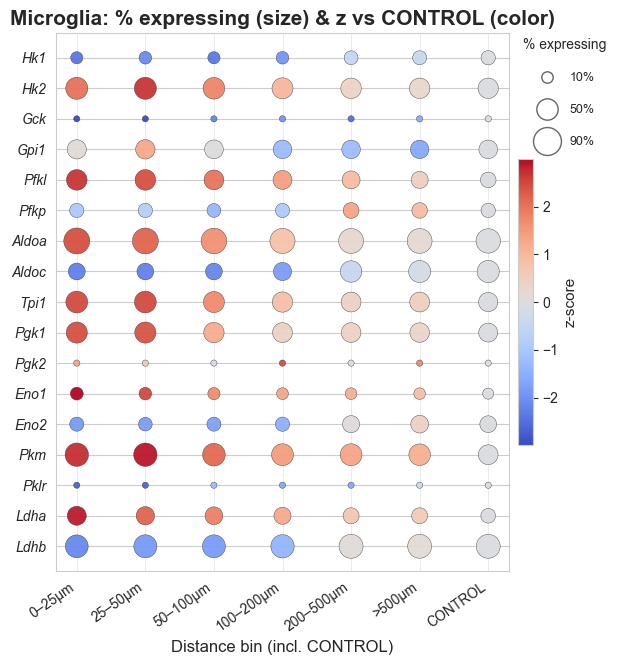

In [730]:
# Cell type to plot
CELLTYPE = "Microglia"

# Build table (bins + pooled CONTROL)
dot_df = build_dotplot_table(
    adata, genes_present, CELLTYPE,
    bin_col=BIN_COL, ct_col=CT_COL, cond_col=COND_COL,
    control_label=CONTROL, case_label=CASE,
    layer=LAYER, detect_threshold=0.0,
    bins_order=BINS_ORDER,
    control_bin_name="CONTROL"
)

# Force gene order exactly as given in your list
# force gene order from your list
gene_order = genes_present
summ_z = compute_zscores(dot_df, control_label="CONTROL")

summ_z = summ_z.copy()
summ_z["gene"] = pd.Categorical(
    summ_z["gene"],
    categories=gene_order,
    ordered=True
)

# plot without triggering any sorting
plot_dotplot_beautified(
    summ_z,
    title=CELLTYPE+": % expressing (size) & z vs CONTROL (color)",
    color_mode="z_vs_ctrl",
    cmap="coolwarm",
    size_range=(20, 350),
    sort_genes=None,   # don't auto-sort
    sort_bins=["0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm","CONTROL"],
    control_last=True
)

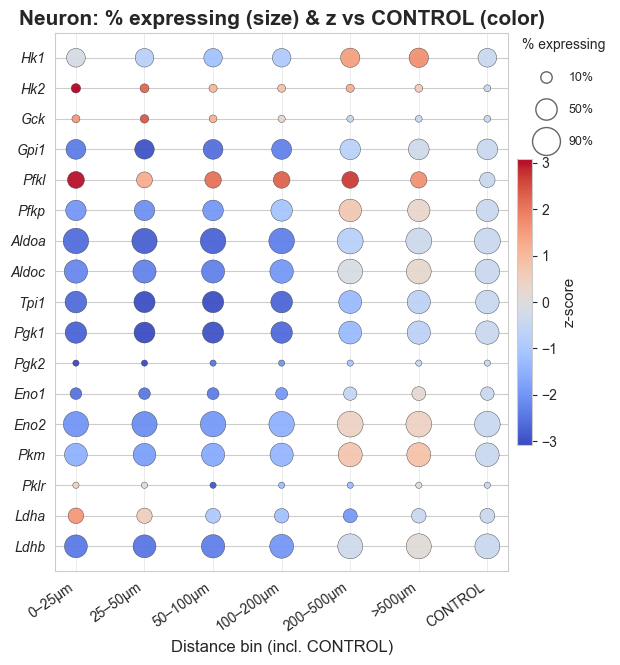

In [731]:
# Cell type to plot
CELLTYPE = "Neuron"

# Build table (bins + pooled CONTROL)
dot_df = build_dotplot_table(
    adata, genes_present, CELLTYPE,
    bin_col=BIN_COL, ct_col=CT_COL, cond_col=COND_COL,
    control_label=CONTROL, case_label=CASE,
    layer=LAYER, detect_threshold=0.0,
    bins_order=BINS_ORDER,
    control_bin_name="CONTROL"
)

# Force gene order exactly as given in your list
# force gene order from your list
gene_order = genes_present
summ_z = compute_zscores(dot_df, control_label="CONTROL")

summ_z = summ_z.copy()
summ_z["gene"] = pd.Categorical(
    summ_z["gene"],
    categories=gene_order,
    ordered=True
)

# plot without triggering any sorting
plot_dotplot_beautified(
    summ_z,
    title=CELLTYPE+": % expressing (size) & z vs CONTROL (color)",
    color_mode="z_vs_ctrl",
    cmap="coolwarm",
    size_range=(20, 350),
    sort_genes=None,   # don't auto-sort
    sort_bins=["0–25µm","25–50µm","50–100µm","100–200µm","200–500µm",">500µm","CONTROL"],
    control_last=True
)

In [ ]:
# Original (ordered) glycolysis list
glycolysis_enzymes_mouse = [
    "Hk1", "Hk2", "Hk3", "Gck",          # Hexokinases
    "Gpi1",                              # Glucose-6-phosphate isomerase
    "Pfkl", "Pfkm", "Pfkp",              # Phosphofructokinases
    "Aldoa", "Aldob", "Aldoc",           # Aldolases
    "Tpi1",                              # Triosephosphate isomerase
    "Gapdh",                             # Glyceraldehyde-3-phosphate dehydrogenase
    "Pgk1", "Pgk2",                      # Phosphoglycerate kinases
    "Pgam1", "Pgam2", "Pgam4",           # Phosphoglycerate mutases
    "Eno1", "Eno2", "Eno3",              # Enolases
    "Pkm", "Pklr",                       # Pyruvate kinases
    "Ldha", "Ldhb"                       # Lactate dehydrogenases
]

# Flip the order
glycolysis_enzymes_mouse_flipped = list(reversed(glycolysis_enzymes_mouse))

# Keep only genes present in adata
genes_present = [g for g in glycolysis_enzymes_mouse_flipped if g in adata.var_names]

print("Genes to plot (flipped, present only):", genes_present)

In [531]:
global_frac = (
    adata.obs["celltype_merged"].value_counts(normalize=True).to_dict()
)
counts["enrichment_ratio"] = counts.apply(
    lambda r: r["frac_bin"] / global_frac[r["celltype_merged"]], axis=1
)

In [532]:
global_frac

{'Neuron': 0.20068825470582102,
 'Oligodendrocyte': 0.17998454846880707,
 'Astrocyte': 0.10862942227195817,
 'Microglia': 0.07974021692693938,
 'Fibroblast': 0.07288233849617805,
 'Endothelial': 0.06274801781971943,
 'T cell': 0.039035860335201795,
 'APC/Myeloid': 0.03832495534417781,
 'Foamy Myeloid': 0.037240657037679085,
 'OPC': 0.03712628431041655,
 'Glial-like': 0.03566186488095705,
 'Monocyte': 0.030812236984776094,
 'Pericyte': 0.023023678518447086,
 'B cell': 0.012326464615657179,
 'Mixed glia-vascular': 0.012325343314409506,
 'Monocyte (inflammatory)': 0.011763571389325884,
 'Dendritic cell': 0.007402830837129872,
 'Ependymal': 0.007225665239997713,
 'T cell (cycling)': 0.0015047862743756875,
 'Fibroblast (cycling)': 0.001133635561396289,
 'Metabolic-like': 0.00041936666662929}

[warn] dropped 8 missing genes: ['Hk3', 'Pfkm', 'Aldob', 'Gapdh', 'Pgam1', 'Pgam2', 'Pgam4', 'Eno3']


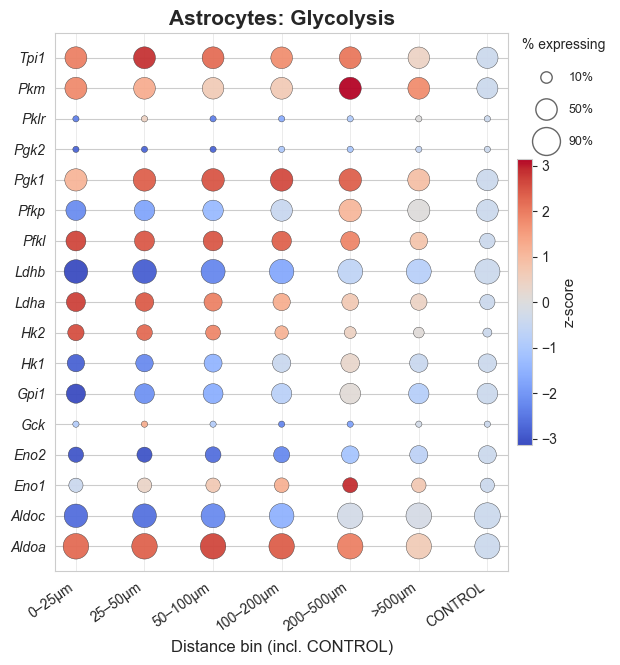

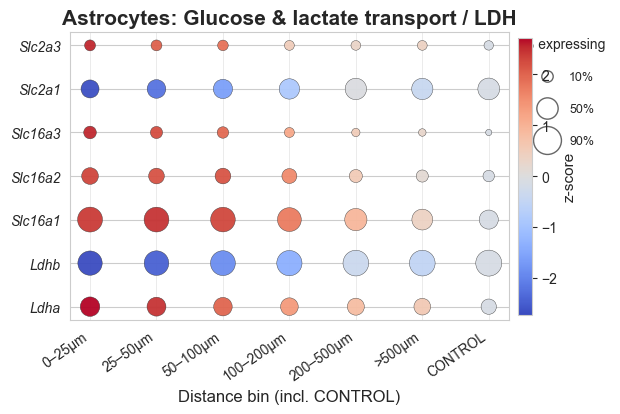

[warn] dropped 5 missing genes: ['G6pd', 'Pgls', 'Rpia', 'Tkt', 'Taldo1']
[skip] No genes from 'Pentose Phosphate (PPP)' in the dataset for Astrocyte.
[warn] dropped 7 missing genes: ['Idh3a', 'Idh3b', 'Suclg1', 'Suclg2', 'Mdh2', 'Fh', 'Aco2']


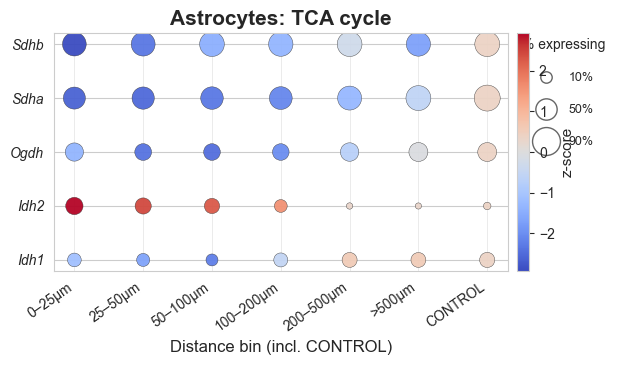

[warn] dropped 9 missing genes: ['Ndufs2', 'Ndufb8', 'Uqcrc1', 'Uqcrc2', 'Uqcrfs1', 'Cox4i1', 'Cox5a', 'Atp5f1a', 'Atp5f1b']


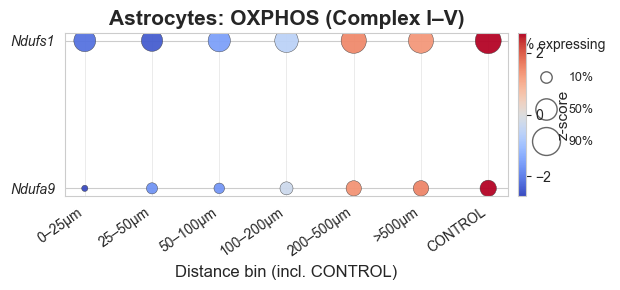

[warn] dropped 9 missing genes: ['Gclc', 'Gclm', 'Txn1', 'Txnrd1', 'Prdx1', 'Prdx2', 'Prdx3', 'Gpx1', 'Gpx4']


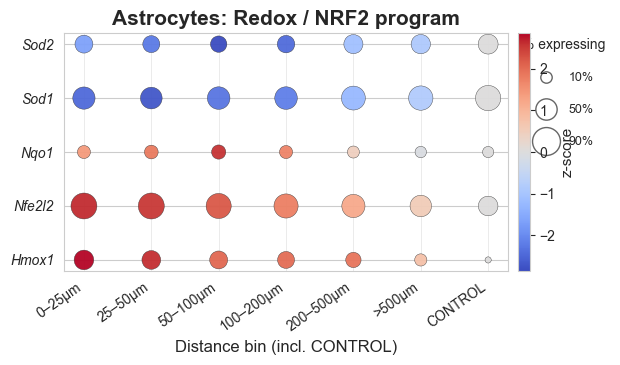

[warn] dropped 8 missing genes: ['Hmgcs1', 'Mvk', 'Mvd', 'Fdft1', 'Sqle', 'Sc5d', 'Dhcr24', 'Soat1']


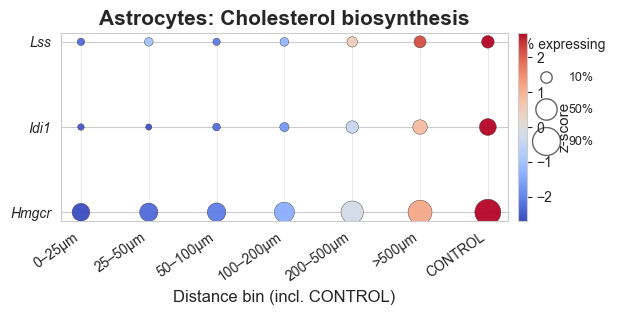

[warn] dropped 4 missing genes: ['Acadm', 'Acadvl', 'Acadl', 'Hadha']


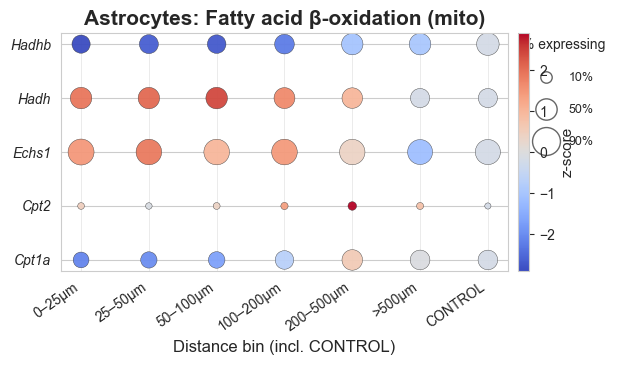

[warn] dropped 6 missing genes: ['Pdha1', 'Pdhb', 'Dlat', 'Dld', 'Pdp1', 'Pdp2']


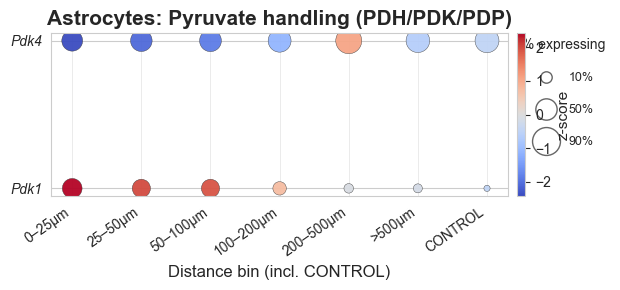

[warn] dropped 1 missing genes: ['Polg2']


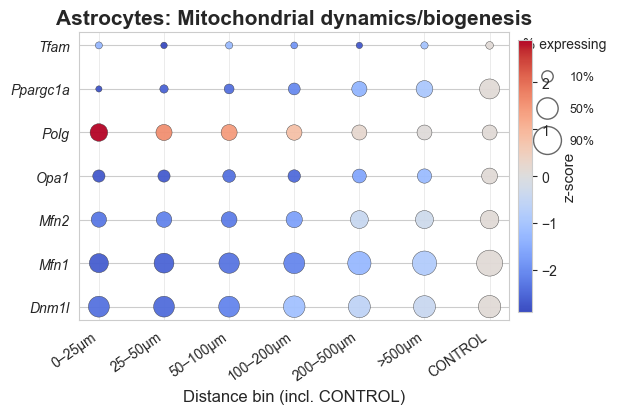

[warn] dropped 8 missing genes: ['Hk3', 'Pfkm', 'Aldob', 'Gapdh', 'Pgam1', 'Pgam2', 'Pgam4', 'Eno3']


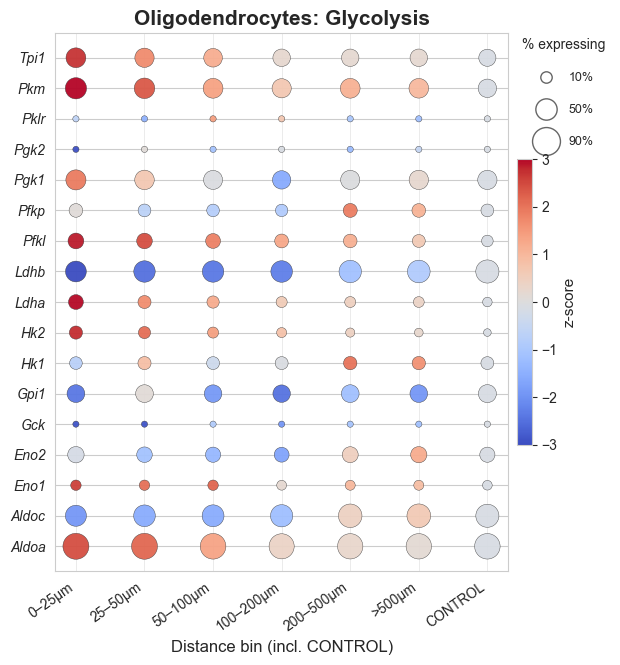

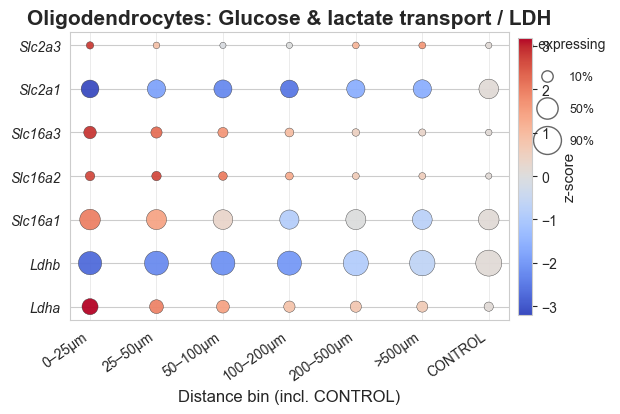

[warn] dropped 7 missing genes: ['Idh3a', 'Idh3b', 'Suclg1', 'Suclg2', 'Mdh2', 'Fh', 'Aco2']


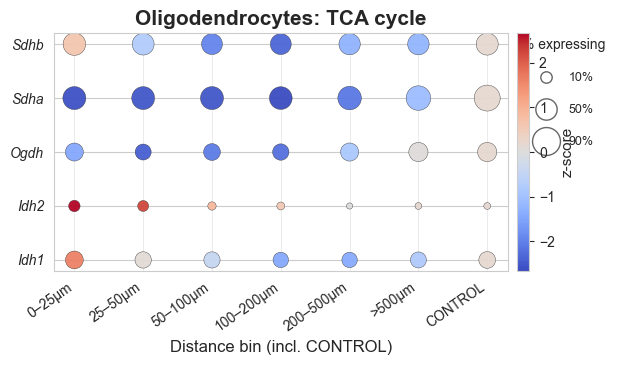

[warn] dropped 9 missing genes: ['Ndufs2', 'Ndufb8', 'Uqcrc1', 'Uqcrc2', 'Uqcrfs1', 'Cox4i1', 'Cox5a', 'Atp5f1a', 'Atp5f1b']


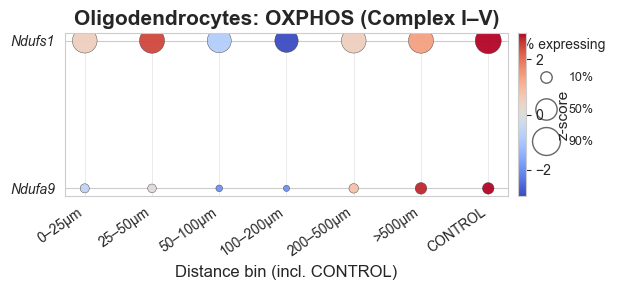

[warn] dropped 8 missing genes: ['Hmgcs1', 'Mvk', 'Mvd', 'Fdft1', 'Sqle', 'Sc5d', 'Dhcr24', 'Soat1']


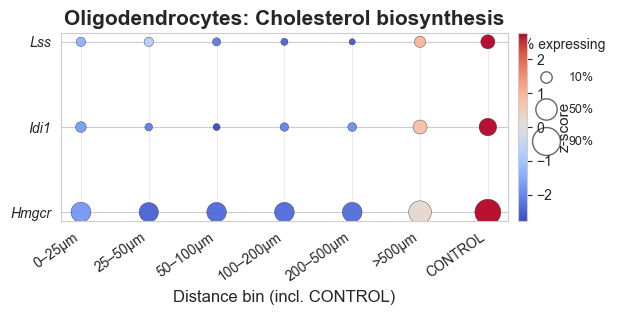

In [734]:
# ---------- 1) Pathway gene sets (mouse symbols) ----------
PATHWAYS_MOUSE = {
    # already did Glycolysis, included here for completeness
    "Glycolysis": [
        "Hk1","Hk2","Hk3","Gck",
        "Gpi1",
        "Pfkl","Pfkm","Pfkp",
        "Aldoa","Aldob","Aldoc",
        "Tpi1",
        "Gapdh",
        "Pgk1","Pgk2",
        "Pgam1","Pgam2","Pgam4",
        "Eno1","Eno2","Eno3",
        "Pkm","Pklr",
        "Ldha","Ldhb"
    ],
    "Pentose Phosphate (PPP)": [
        "G6pd","Pgls","Rpia","Tkt","Taldo1"
    ],
    "TCA cycle": [
        "Idh1","Idh2","Idh3a","Idh3b",
        "Ogdh","Suclg1","Suclg2",
        "Sdha","Sdhb","Mdh2","Fh","Aco2"
    ],
    "OXPHOS (Complex I–V)": [
        # Complex I
        "Ndufs1","Ndufs2","Ndufa9","Ndufb8",
        # Complex III
        "Uqcrc1","Uqcrc2","Uqcrfs1",
        # Complex IV
        "Cox4i1","Cox5a",
        # Complex V
        "Atp5f1a","Atp5f1b"
    ],
    "Fatty acid β-oxidation (mito)": [
        "Cpt1a","Cpt2","Acadm","Acadvl","Acadl",
        "Hadha","Hadhb","Echs1","Hadh"
    ],
    "Cholesterol biosynthesis": [
        "Hmgcs1","Hmgcr","Mvk","Mvd","Idi1",
        "Fdft1","Sqle","Lss","Sc5d","Dhcr24","Soat1"
    ],
    "Redox / NRF2 program": [
        "Nfe2l2","Nqo1","Hmox1",
        "Gclc","Gclm","Txn1","Txnrd1",
        "Prdx1","Prdx2","Prdx3","Gpx1","Gpx4",
        "Sod1","Sod2"
    ],
    "Glucose & lactate transport / LDH": [
        "Slc2a1","Slc2a3",      # GLUT1/3
        "Ldha","Ldhb",
        "Slc16a1","Slc16a2","Slc16a3"  # MCT1/2/4
    ],
    "Pyruvate handling (PDH/PDK/PDP)": [
        "Pdha1","Pdhb","Dlat","Dld",    # PDH complex
        "Pdk1","Pdk4",                  # inhibits PDH
        "Pdp1","Pdp2"                   # activates PDH
    ],
    "Mitochondrial dynamics/biogenesis": [
        "Mfn1","Mfn2","Opa1","Dnm1l",   # fusion/fission
        "Polg","Polg2","Tfam","Ppargc1a"
    ],
    "Anaplerosis / pyruvate entry": [
        "Mpc1","Mpc2","Pc","Got1","Got2","Glud1"
    ],
}

# ---------- 2) Small helper: keep input order, drop missing ----------
def genes_present_in_order(ad, genes):
    present = [g for g in genes if g in ad.var_names]
    missing = [g for g in genes if g not in ad.var_names]
    if missing:
        print(f"[warn] dropped {len(missing)} missing genes: {missing[:15]}{' …' if len(missing)>15 else ''}")
    return present

# ---------- 3) One function to make the plot for a pathway & cell type ----------
def plot_pathway_dotplot(
    adata, pathway_name, celltype,
    bin_col=BIN_COL, ct_col=CT_COL, cond_col=COND_COL,
    control_label=CONTROL, case_label=CASE, layer=LAYER,
    bins_order=BINS_ORDER,
    title_prefix=None,
    size_range=(20, 350),
    cmap="coolwarm"
):
    genes = genes_present_in_order(adata, PATHWAYS_MOUSE[pathway_name])
    if not genes:
        print(f"[skip] No genes from '{pathway_name}' in the dataset for {celltype}.")
        return

    dot_df = build_dotplot_table(
        adata, genes, celltype,
        bin_col=bin_col, ct_col=ct_col, cond_col=cond_col,
        control_label=control_label, case_label=case_label,
        layer=layer, detect_threshold=0.0,
        bins_order=bins_order,
        control_bin_name="CONTROL"
    )
    summ_z = compute_zscores(dot_df, control_label="CONTROL")

    plot_dotplot_beautified(
        summ_z,
        title=(title_prefix or celltype) + f": {pathway_name}",
        color_mode="z_vs_ctrl",          # blue<0, red>0 vs control
        cmap=cmap,
        size_range=size_range,
        sort_genes=None,                 # keep your input order
        sort_genes_bin=None,
        sort_bins=bins_order + ["CONTROL"],
        control_last=True,
        #honor_input_order=True,          # <- from our latest helper
        jitter_y=0.0
    )

# ---------- 4) Examples ----------
# Astrocytes
for pw in [
    "Glycolysis",
    "Glucose & lactate transport / LDH",
    "Pentose Phosphate (PPP)",
    "TCA cycle",
    "OXPHOS (Complex I–V)",
    "Redox / NRF2 program",
    "Cholesterol biosynthesis",
    "Fatty acid β-oxidation (mito)",
    "Pyruvate handling (PDH/PDK/PDP)",
    "Mitochondrial dynamics/biogenesis",
]:
    plot_pathway_dotplot(adata, pw, "Astrocyte", title_prefix="Astrocytes")

# Oligodendrocytes (change celltype as needed)
for pw in ["Glycolysis","Glucose & lactate transport / LDH","TCA cycle","OXPHOS (Complex I–V)","Cholesterol biosynthesis"]:
    plot_pathway_dotplot(adata, pw, "Oligodendrocyte", title_prefix="Oligodendrocytes")

In [557]:
# Which neighbors are enriched around Slc16a3-high astrocytes?
res_astros = neighbor_enrichment(
    adata, "Ldha", threshold=3, layer="raw", focus_celltype="Astrocyte"
)

res_astros.groupby("neighbor_celltype")["enrichment"].mean().sort_values(ascending=False)

[skip] no Ldha-high Astrocyte cells in G5_L1_1
[skip] no Ldha-high Astrocyte cells in S2-T2_2
[skip] no Ldha-high Astrocyte cells in S3-T2_1
[skip] no Ldha-high Astrocyte cells in S3-T3_0
[skip] no Ldha-high Astrocyte cells in S3-T3_1
[skip] no Ldha-high Astrocyte cells in S3-T3_2
[skip] no Ldha-high Astrocyte cells in S4-T1_0
[skip] no Ldha-high Astrocyte cells in S4-T1_2
[skip] no Ldha-high Astrocyte cells in S4-T2_0
[skip] no Ldha-high Astrocyte cells in S4-T2_2


neighbor_celltype
T cell (cycling)           2.243369
Astrocyte                  2.075582
OPC                        1.606885
Microglia                  1.297898
Ependymal                  1.283801
Mixed glia-vascular        1.084329
Monocyte                   1.046418
T cell                     0.964835
APC/Myeloid                0.902818
Oligodendrocyte            0.872165
Neuron                     0.794656
Endothelial                0.732871
Foamy Myeloid              0.729824
Pericyte                   0.610548
B cell                     0.532692
Fibroblast                 0.395512
Monocyte (inflammatory)    0.371178
Dendritic cell             0.188434
Glial-like                 0.034846
Fibroblast (cycling)       0.000000
Metabolic-like             0.000000
Name: enrichment, dtype: float64

In [556]:
# Which neighbors are enriched around Slc16a3-high astrocytes?
res_astros = neighbor_enrichment(
    adata, "Ldha", threshold=2, layer="raw", focus_celltype="Oligodendrocyte"
)

res_astros.groupby("neighbor_celltype")["enrichment"].mean().sort_values(ascending=False)

[skip] no Ldha-high Oligodendrocyte cells in G5_L1_1
[skip] no Ldha-high Oligodendrocyte cells in G5_L2_2
[skip] no Ldha-high Oligodendrocyte cells in S1-B2_2
[skip] no Ldha-high Oligodendrocyte cells in S1-T1_1
[skip] no Ldha-high Oligodendrocyte cells in S1-T1_2
[skip] no Ldha-high Oligodendrocyte cells in S1-T2_2
[skip] no Ldha-high Oligodendrocyte cells in S2-B2_0
[skip] no Ldha-high Oligodendrocyte cells in S3-T1_1
[skip] no Ldha-high Oligodendrocyte cells in S3-T1_2
[skip] no Ldha-high Oligodendrocyte cells in S3-T3_0
[skip] no Ldha-high Oligodendrocyte cells in S3-T3_1
[skip] no Ldha-high Oligodendrocyte cells in S4-B1_2
[skip] no Ldha-high Oligodendrocyte cells in S4-T1_0
[skip] no Ldha-high Oligodendrocyte cells in S4-T1_1
[skip] no Ldha-high Oligodendrocyte cells in S4-T1_2
[skip] no Ldha-high Oligodendrocyte cells in S4-T2_0
[skip] no Ldha-high Oligodendrocyte cells in S4-T2_2
[skip] no Ldha-high Oligodendrocyte cells in S4-T3_1
[skip] no Ldha-high Oligodendrocyte cells in S

neighbor_celltype
T cell (cycling)           3.253422
T cell                     2.313634
Astrocyte                  1.787860
OPC                        1.701909
Oligodendrocyte            1.495347
Microglia                  1.316285
Mixed glia-vascular        0.960952
Pericyte                   0.821175
APC/Myeloid                0.777896
Endothelial                0.762936
Foamy Myeloid              0.596357
Monocyte                   0.576067
Monocyte (inflammatory)    0.460576
Neuron                     0.376415
Dendritic cell             0.256367
Fibroblast                 0.168356
Glial-like                 0.069243
B cell                     0.018746
Fibroblast (cycling)       0.000000
Ependymal                  0.000000
Metabolic-like             0.000000
Name: enrichment, dtype: float64

In [558]:
import numpy as np, pandas as pd
import scipy.sparse as sp
from sklearn.neighbors import NearestNeighbors

def neighbor_enrichment_zscore(
    adata,
    gene,
    threshold=1,
    sample_col="sample_id",
    x_col="x_centroid",
    y_col="y_centroid",
    celltype_col="celltype_merged",
    layer="raw",
    focus_celltype=None,
    n_permutations=200,
    random_state=0
):
    rng = np.random.default_rng(random_state)
    results = []

    for sample, idx in adata.obs.groupby(sample_col).indices.items():
        sub = adata[idx, :]
        if gene not in sub.var_names:
            continue

        # --- expression vector ---
        if layer in sub.layers:
            X = sub.layers[layer]
        else:
            X = sub.X
        gidx = sub.var_names.get_loc(gene)
        expr = X[:, gidx].toarray().ravel() if sp.issparse(X) else np.asarray(X[:, gidx]).ravel()

        # mark gene-high
        gene_high = expr > float(threshold)

        # restrict to focus celltype (optional)
        if focus_celltype is not None:
            is_focus = sub.obs[celltype_col].astype(str).eq(focus_celltype).values
            gene_high = gene_high & is_focus

        n_high = int(gene_high.sum())
        if n_high == 0:
            print(f"[skip] no {gene}-high {focus_celltype or ''} cells in {sample}")
            continue

        coords = sub.obs[[x_col, y_col]].to_numpy(dtype=float)
        nn = NearestNeighbors(n_neighbors=2).fit(coords)
        _, neigh_idx = nn.kneighbors(coords)
        neighbor_types = sub.obs.iloc[neigh_idx[:, 1]][celltype_col].values

        df = pd.DataFrame({
            "gene_high": gene_high,
            "neighbor_celltype": neighbor_types
        })

        # observed frequencies
        obs_freq = df.loc[df["gene_high"], "neighbor_celltype"].value_counts(normalize=True)

        # null distribution by shuffling labels within focus celltype
        null_freqs = {ct: [] for ct in obs_freq.index}
        mask_focus = sub.obs[celltype_col].astype(str).eq(focus_celltype).values if focus_celltype else np.ones(len(sub), bool)

        for _ in range(n_permutations):
            shuffled = np.zeros_like(gene_high)
            # sample same number of highs among focus cells
            idx_focus = np.where(mask_focus)[0]
            idx_high = rng.choice(idx_focus, size=n_high, replace=False)
            shuffled[idx_high] = True
            freq = pd.Series(neighbor_types[shuffled]).value_counts(normalize=True)
            for ct, v in freq.items():
                null_freqs[ct].append(v)

        # compute z-scores
        for ct, obs_v in obs_freq.items():
            null_vals = np.array(null_freqs.get(ct, [0]))
            mu, sigma = null_vals.mean(), null_vals.std(ddof=1)
            z = (obs_v - mu) / (sigma + 1e-9)
            results.append({
                "sample": sample,
                "gene": gene,
                "focus_celltype": focus_celltype or "ALL",
                "neighbor_celltype": ct,
                "obs_freq": obs_v,
                "null_mean": mu,
                "null_sd": sigma,
                "zscore": z
            })

    return pd.DataFrame(results)

In [559]:
res_z = neighbor_enrichment_zscore(
    adata, "Ldha", threshold=2,
    layer="raw",
    focus_celltype="Astrocyte",
    n_permutations=500
)

# see top enriched neighbor types
res_z.groupby("neighbor_celltype")["zscore"].mean().sort_values(ascending=False)

[skip] no Ldha-high Astrocyte cells in S4-T1_0
[skip] no Ldha-high Astrocyte cells in S4-T1_2
[skip] no Ldha-high Astrocyte cells in S4-T2_0
[skip] no Ldha-high Astrocyte cells in S4-T2_2


neighbor_celltype
Monocyte                   0.740784
APC/Myeloid                0.565220
T cell                     0.451310
Dendritic cell             0.279342
OPC                        0.267833
Foamy Myeloid              0.232114
Ependymal                  0.145228
Monocyte (inflammatory)    0.143700
T cell (cycling)           0.100965
Microglia                  0.093080
B cell                     0.072813
Fibroblast                 0.045566
Metabolic-like            -0.036293
Fibroblast (cycling)      -0.045397
Glial-like                -0.064789
Neuron                    -0.069600
Mixed glia-vascular       -0.135338
Endothelial               -0.141129
Pericyte                  -0.320182
Astrocyte                 -0.341412
Oligodendrocyte           -0.492804
Name: zscore, dtype: float64

In [563]:
res_z = neighbor_enrichment_zscore(
    adata, "Serpina3n", threshold=5,
    layer="raw",
    focus_celltype="Astrocyte",
    n_permutations=500
)

# see top enriched neighbor types
res_z.groupby("neighbor_celltype")["zscore"].mean().sort_values(ascending=False)

[skip] no Serpina3n-high Astrocyte cells in S1-T1_2


neighbor_celltype
Fibroblast                 1.640509
T cell                     1.481185
Microglia                  1.434626
APC/Myeloid                1.340303
Oligodendrocyte            1.057836
OPC                        1.016486
Monocyte                   0.797804
Monocyte (inflammatory)    0.625249
B cell                     0.517951
Dendritic cell             0.482075
Glial-like                 0.467065
T cell (cycling)           0.188179
Astrocyte                  0.146821
Fibroblast (cycling)       0.089395
Metabolic-like            -0.084615
Foamy Myeloid             -0.130165
Ependymal                 -0.240702
Endothelial               -1.051011
Pericyte                  -1.338658
Mixed glia-vascular       -1.348871
Neuron                    -3.753219
Name: zscore, dtype: float64

In [593]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree
import scipy.sparse as sp
import matplotlib.pyplot as plt

# ---- small helpers ----
def _to_dense(X):
    return X.toarray() if sp.issparse(X) else np.asarray(X)

def _get_layer(ad, layer):
    if layer and (layer in ad.layers):
        return ad.layers[layer]
    return ad.X

def _two_sided_p_from_z(z):
    # N(0,1) two-sided p
    from math import erf, sqrt
    return 2 * (1 - 0.5 * (1 + erf(abs(z) / sqrt(2))))

# ---- main function ----
def neighbor_enrichment_ldha_high_astros(
    adata,
    gene="Ldha",
    focal_celltype="Astrocyte",
    celltype_col="celltype_merged",
    sample_col="sample_id",
    x_col="x_centroid",
    y_col="y_centroid",
    # lesion proximity filter (set bin_col=None to use all EAE tissue)
    bin_col="lesion_distance_bin",
    proximal_bins=("0–10µm","10–25µm","25–50µm"),
    # use "raw" counts for Xenium
    layer="raw",
    # define "gene-high" focal cells
    expr_threshold=None,      # e.g. 2.0 (counts); set None to use quantile
    expr_quantile=0.9,        # top 10% if threshold is None
    # neighbor search
    radius_um=35.0,
    neighbor_celltypes=None,  # None -> all cell types observed
    # permutations
    n_perm=1000,
    random_state=0,
    # minimums to include a sample
    min_focal=5,
    min_pairs=10,
    # optional condition filter
    cond_col="condition",
    case_label=None,          # e.g. "EAE"; None -> all non-control
    control_label="CONTROL",
):
    rng = np.random.default_rng(random_state)

    # ---- subset cells: case-only and astrocytes, optionally proximal bins ----
    obs = adata.obs.copy()

    if cond_col is not None:
        if case_label is None:
            case_mask = (obs[cond_col] != control_label)
        else:
            case_mask = (obs[cond_col] == case_label)
    else:
        case_mask = np.ones(len(obs), dtype=bool)

    mask = case_mask & (obs[celltype_col] == focal_celltype)
    if bin_col is not None:
        mask &= obs[bin_col].isin(proximal_bins)

    if mask.sum() == 0:
        raise ValueError("No astrocytes after filtering (check condition/bin labels).")

    sub = adata[mask, :].copy()
    if gene not in sub.var_names:
        raise KeyError(f"{gene} not found in adata.var_names")

    # expression vector for LDHA
    X = _get_layer(sub, layer)
    X = _to_dense(X)
    ldha = np.asarray(X[:, sub.var_names.get_loc(gene)]).ravel()

    # define LDHA-high per sample (or by absolute threshold)
    samples = sub.obs[sample_col].astype(str).values
    coords  = sub.obs[[x_col, y_col]].to_numpy(float)
    cts     = sub.obs[celltype_col].astype(str).values

    # which neighbor CTs to score
    if neighbor_celltypes is None:
        neighbor_cts = np.unique(adata.obs[celltype_col].astype(str))
    else:
        neighbor_cts = np.array(neighbor_celltypes, dtype=str)

    # Precompute sample index lists
    sample_to_idx = {s: np.where(samples == s)[0] for s in np.unique(samples)}

    rows = []
    z_blocks = []

    for s, idx in sample_to_idx.items():
        if idx.size == 0:
            continue

        ld = ldha[idx]
        xy = coords[idx, :]
        ct = cts[idx]

        # determine LDHA-high mask in this sample
        if expr_threshold is not None:
            high = ld > float(expr_threshold)
        else:
            # per-sample quantile
            q = np.quantile(ld, expr_quantile) if idx.size > 0 else np.inf
            high = ld >= q

        n_focal = int(high.sum())
        if n_focal < min_focal:
            continue

        # KD-tree neighbor search within radius (exclude self)
        tree = cKDTree(xy)
        focal_idx = np.where(high)[0]
        neigh_lists = tree.query_ball_point(xy[focal_idx], r=radius_um)

        pairs = []
        for fi, neigh in zip(focal_idx, neigh_lists):
            neigh = [j for j in neigh if j != fi]
            if neigh:
                pairs.extend([(fi, j) for j in neigh])

        if len(pairs) < min_pairs:
            continue

        pairs = np.array(pairs, dtype=int)
        neigh_ct = ct[pairs[:, 1]]

        # observed frequency of neighbor CTs
        n_pairs = float(len(neigh_ct))
        obs_counts = pd.Series(neigh_ct).value_counts()
        obs_freq = (obs_counts / n_pairs).reindex(neighbor_cts).fillna(0.0).to_numpy()

        # permutation null: shuffle high labels within sample
        null_freq = np.zeros((n_perm, len(neighbor_cts)), dtype=float)
        for p in range(n_perm):
            shuf = high.copy()
            rng.shuffle(shuf)
            foc_perm = np.where(shuf)[0]
            perm_pairs = []
            if foc_perm.size > 0:
                nl = tree.query_ball_point(xy[foc_perm], r=radius_um)
                for fi, neigh in zip(foc_perm, nl):
                    neigh = [j for j in neigh if j != fi]
                    if neigh:
                        perm_pairs.extend([(fi, j) for j in neigh])

            if not perm_pairs:
                null_freq[p, :] = np.nan
                continue

            perm_pairs = np.array(perm_pairs, dtype=int)
            neigh_perm = ct[perm_pairs[:, 1]]
            pc = pd.Series(neigh_perm).value_counts()
            null_freq[p, :] = (pc / float(len(neigh_perm))).reindex(neighbor_cts).fillna(0.0).to_numpy()

        valid = np.isfinite(null_freq).all(axis=1)
        if valid.sum() == 0:
            continue

        mu = np.nanmean(null_freq[valid, :], axis=0)
        sd = np.nanstd(null_freq[valid, :], axis=0, ddof=1)
        sd_safe = np.where(sd > 0, sd, np.nan)

        z = (obs_freq - mu) / sd_safe
        # empirical two-sided p
        p_emp = []
        for j in range(len(neighbor_cts)):
            diffs = null_freq[valid, j] - mu[j]
            obs_diff = obs_freq[j] - mu[j]
            extreme = np.sum(np.abs(diffs) >= abs(obs_diff))
            p_emp.append((extreme + 1) / (valid.sum() + 1))

        enr = np.divide(obs_freq, mu, out=np.full_like(obs_freq, np.nan), where=mu > 0)

        for j, ct_name in enumerate(neighbor_cts):
            rows.append({
                "sample": s,
                "focal_celltype": focal_celltype,
                "gene": gene,
                "neighbor_celltype": ct_name,
                "n_focal": n_focal,
                "n_pairs": int(n_pairs),
                "freq_obs": float(obs_freq[j]),
                "freq_null_mean": float(mu[j]),
                "freq_null_sd": float(sd[j]),
                "z": float(z[j]) if np.isfinite(z[j]) else np.nan,
                "p_empirical": float(p_emp[j]) if np.isfinite(mu[j]) else np.nan,
                "enrichment_ratio": float(enr[j]) if np.isfinite(enr[j]) else np.nan,
                "radius_um": radius_um,
                "bins": ";".join(proximal_bins) if bin_col is not None else "ALL",
                "n_perm": int(valid.sum())
            })

        z_blocks.append(pd.Series(z, index=neighbor_cts, name=s))

    if not rows:
        raise ValueError("No valid samples (try a larger radius, lower min_focal/min_pairs, or use quantile).")

    res = pd.DataFrame(rows)

    # Pooled (Stouffer) z across samples per neighbor cell type
    if z_blocks:
        Z = pd.concat(z_blocks, axis=1).T
        meta_rows = []
        for ct_name in Z.columns:
            z_ct = Z[ct_name].dropna()
            if z_ct.empty:
                continue
            z_meta = z_ct.sum() / np.sqrt(len(z_ct))
            p_meta = _two_sided_p_from_z(z_meta)
            meta_rows.append({
                "sample": "POOLED",
                "focal_celltype": focal_celltype,
                "gene": gene,
                "neighbor_celltype": ct_name,
                "z": float(z_meta),
                "p_empirical": float(p_meta)
            })
        res = pd.concat([res, pd.DataFrame(meta_rows)], ignore_index=True)

    return res

# ---- quick plotting helper (top pooled results) ----
def plot_neighbor_enrichment_bar(res, top_n=10, title=None):
    pooled = res[res["sample"]=="POOLED"].dropna(subset=["z"])
    if pooled.empty:
        print("[warn] no pooled rows to plot")
        return None
    pooled = pooled.sort_values("z", ascending=False).head(top_n)
    fig, ax = plt.subplots(figsize=(6, 0.4*len(pooled)))
    ax.barh(pooled["neighbor_celltype"], pooled["z"])
    ax.invert_yaxis()
    ax.set_xlabel("Pooled z (Stouffer)")
    ax.set_title(title or "Neighbor enrichment around LDHA-high astrocytes")
    for i, r in pooled.iterrows():
        ax.text(r["z"], r["neighbor_celltype"], f"  p={r['p_empirical']:.2e}", va="center")
    plt.tight_layout()
    return fig

In [595]:
res = neighbor_enrichment_ldha_high_astros(
    adata,
    gene="Ldha",
    focal_celltype="Astrocyte",
    bin_col="dist_bin",                             # or "lesion_distance_bin"
    proximal_bins=("0–25µm","25–50µm"),            # focus near lesion
    layer="raw",                                    # Xenium counts
    expr_threshold=2, expr_quantile=0.9,         # top 10% per sample = "high"
    radius_um=35.0,                                 # a bit larger to boost pairs
    neighbor_celltypes=None,                        # score all observed CTs
    n_perm=1000, random_state=0,
    min_focal=5, min_pairs=10,                      # relaxed to keep samples
    cond_col="condition", case_label=None,          # all non-control
    control_label="CONTROL"
)

# See pooled results (bigger z = stronger enrichment; p<0.05 ~ |z|>1.96)
res_pooled = res[res["sample"]=="POOLED"].sort_values("z", ascending=False)
display(res_pooled)

# Quick bar plot for top hits
_ = plot_neighbor_enrichment_bar(res, top_n=12, title="LDHA-high astrocytes (proximal bins)")

,sample,focal_celltype,gene,neighbor_celltype,n_focal,n_pairs,freq_obs,freq_null_mean,freq_null_sd,z,p_empirical,enrichment_ratio,radius_um,bins,n_perm


[warn] no pooled rows to plot


In [596]:
res

,sample,focal_celltype,gene,neighbor_celltype,n_focal,n_pairs,freq_obs,freq_null_mean,freq_null_sd,z,p_empirical,enrichment_ratio,radius_um,bins,n_perm
0,G3_L2_0,Astrocyte,Ldha,APC/Myeloid,10,16,0.0,0.0,0.0,NaN,1.0,NaN,35.0,0–25µm;25–50µm,1000
1,G3_L2_0,Astrocyte,Ldha,Astrocyte,10,16,1.0,1.0,0.0,NaN,1.0,1.0,35.0,0–25µm;25–50µm,1000
2,G3_L2_0,Astrocyte,Ldha,B cell,10,16,0.0,0.0,0.0,NaN,1.0,NaN,35.0,0–25µm;25–50µm,1000
3,G3_L2_0,Astrocyte,Ldha,Dendritic cell,10,16,0.0,0.0,0.0,NaN,1.0,NaN,35.0,0–25µm;25–50µm,1000
4,G3_L2_0,Astrocyte,Ldha,Endothelial,10,16,0.0,0.0,0.0,NaN,1.0,NaN,35.0,0–25µm;25–50µm,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
352,S4-T3_0,Astrocyte,Ldha,OPC,5,24,0.0,0.0,0.0,NaN,1.0,NaN,35.0,0–25µm;25–50µm,1000
353,S4-T3_0,Astrocyte,Ldha,Oligodendrocyte,5,24,0.0,0.0,0.0,NaN,1.0,NaN,35.0,0–25µm;25–50µm,1000
354,S4-T3_0,Astrocyte,Ldha,Pericyte,5,24,0.0,0.0,0.0,NaN,1.0,NaN,35.0,0–25µm;25–50µm,1000
355,S4-T3_0,Astrocyte,Ldha,T cell,5,24,0.0,0.0,0.0,NaN,1.0,NaN,35.0,0–25µm;25–50µm,1000


In [597]:
_ = plot_neighbor_enrichment_bar(res, top_n=12, title="LDHA-high astrocytes (proximal bins)")

[warn] no pooled rows to plot
